# Predicting the Soil Temperature at 100cm depth using machine learning
### 1. Problem definition
> Soil temperature is one of the important parameters of a soil characteristics that contributes information in understanding the nitrate levels of a soil at different depths. This is because the soil temperature affects the soil's microbial activity, plant uptake, volatilization of Nitrogen compounds and leaching.  NMBU measures soil temperature at different depths (2cm, 5cm, 10cm, 20cm, 50cm, 100cm) using platinum resistance thermometers called PT100. Machine learning based predication may help reducing the effort and installation cost required to measure temperature at deeper soil levels such 100cm. This machine learning algorithm will first try to predict the soil temperature at 100cm from the different data features. 
### 2. Data Source
> To start the analysis process, the data source (2018-2022) is downloaded from the Meteorological data for Ås - BIOKLIM website (https://www.nmbu.no/forskning/grupper/meteorologiske-data) and organized into one big dataset which contains nearly 1800 samples. The improvements will be: first, the dataset will be improved to have bigger number of samples (2000-2024); second, multi-sites will be considererd to make the prediction more generic for different types of soils in Norway.
> #### There is one dataset inside the data folder
### 3. Evaluation metrics
> The evaluation metrics such as R-squared (R²) Score, Mean Absolute Error (MAE), Mean Square Error (MSE) and Root Mean Square Log Error (RMSLE) will be considered as common regression metrics.
> > The goal of this machine learning model is to build a machine leanrning model that minimizes the erros: MAE, MSE, RMSLE and increase the R-squared (R²) Score.
### 4. Data Features
> The original features of the dataset are:  month,	date, mean_air_temperature_2m, min_air_temperature_2m,	max_air_temperature_2m	soil_temperature_2cm,	soil_temperature_5cm,	soil_temperature_10cm,	soil_temperature_20cm,	soil_temperature_50cm,	relative_humudity_%,	air_pressure_2m_mbar,	radiation_balance_w_m2,	albedo_RR_GR,	earth_heat_flux_MJ_m2,	evaporation_mm,	rainfall_mm,	snowfall_cm. But through feature importance analysis less number of features will be used for consideration.
>> The original dataset is inside the data folder in this project with a file name 'NMBUBigDatasetFinal.csv'.



In [1]:
# !pip install statsmodels

In [2]:
!pip install tensorflow

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
# Import the train_test_split module from sklearn
from sklearn.model_selection import train_test_split
# For z-score calculations
from scipy import stats
# Import the GridSearchCV and RandomizeSearchCV
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import mplcursors
import pickle
from joblib import dump, load
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import IsolationForest

In [4]:
dataset = pd.read_csv("data/NMBUBigDatasetFinal.csv", low_memory=False)

In [5]:
dataset

,ID,date,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,albedo_RR_GR,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100
0,1,1/1/2000,-5.0,-7.6,-3.0,100.0,1001.5,NaN,NaN,-0.3,-0.12,1.17,0.74,NaN,-0.2,-0.1,0.1,0.4,1.9,3.4
1,2,1/2/2000,0.6,-5.0,4.0,88.6,997.7,NaN,NaN,-0.2,-2.21,1.62,0.77,NaN,-0.1,-0.1,0.0,0.4,1.9,3.4
2,3,1/3/2000,2.1,-1.1,4.6,88.6,991.5,8.8,NaN,-0.1,-1.80,0.71,0.39,NaN,-0.1,-0.1,0.0,0.5,1.9,3.4
3,4,1/4/2000,1.8,-3.3,4.4,67.3,987.0,2.1,NaN,-0.1,-4.83,2.49,0.48,NaN,0.0,0.0,0.1,0.5,1.9,3.4
4,5,1/5/2000,0.6,-3.6,4.4,98.2,993.3,1.2,NaN,-0.2,-0.44,1.68,0.17,NaN,0.0,0.0,0.1,0.5,1.9,3.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8851,8852,3/28/2024,5.2,2.4,7.9,90.0,976.7,7.6,NaN,0.6,0.45,13.34,0.21,NaN,1.6,1.3,1.0,0.9,1.2,2.0
8852,8853,3/29/2024,5.9,4.7,7.4,93.6,978.3,2.6,NaN,0.8,0.29,9.17,0.18,NaN,2.9,2.6,2.1,1.7,1.5,2.1
8853,8854,3/30/2024,5.9,4.0,7.4,94.4,990.1,2.0,NaN,0.7,0.61,9.32,0.18,NaN,3.5,3.3,2.8,2.5,1.9,2.2
8854,8855,3/31/2024,6.2,2.4,8.0,93.6,988.1,2.9,NaN,0.6,0.02,8.09,0.18,NaN,4.2,4.1,3.6,3.1,2.4,2.3


# 1. Data Preprocessing Stage
### Excel manipulation to clean the original dataset
#### 1. Duplicate values were removed where one date is repeated.
#### 2. Some of the snow_depth_cm data read from sensor are replaced by the manually recorded snow_depth_manual_cm data if manual recording data exists
#### 3. Unnecessary columns are removed from the original dataset


In [6]:
# dataset['snow_depth_cm'] = dataset['snow_depth_cm'].fillna(dataset['snow_depth_manual_cm'])
# dataset.drop('snow_depth_manual_cm', axis=1, inplace=True)

In [7]:
# Add a year, month and day columns by feature engineering to make manipulation of these easy
dataset['date'] = pd.to_datetime(dataset['date'])
dataset_copied = dataset.copy()
dataset_copied['year'] = dataset_copied['date'].dt.year
dataset_copied['month'] = dataset_copied['date'].dt.month
dataset_copied['day'] = dataset_copied['date'].dt.day

In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8856 entries, 0 to 8855
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   ID                                   8856 non-null   int64         
 1   date                                 8856 non-null   datetime64[ns]
 2   mean_air_temperature_2m              8856 non-null   float64       
 3   min_air_temperature_2m               8856 non-null   float64       
 4   max_air_temperature_2m               8856 non-null   float64       
 5   relative_humidity                    8764 non-null   float64       
 6   air_pressure_2m_mbar                 8822 non-null   float64       
 7   precipitation_mm                     8402 non-null   float64       
 8   evaporation_mm                       2466 non-null   float64       
 9   earth_heat_flux_MJ_m2                7891 non-null   float64       
 10  radiation_ba

In [9]:
dataset.isna().sum()

ID                                        0
date                                      0
mean_air_temperature_2m                   0
min_air_temperature_2m                    0
max_air_temperature_2m                    0
relative_humidity                        92
air_pressure_2m_mbar                     34
precipitation_mm                        454
evaporation_mm                         6390
earth_heat_flux_MJ_m2                   965
radiation_balance_w_m2                  202
phosynthetic_active_radiation_mE_m2     427
albedo_RR_GR                            684
snow_depth_cm                          7537
ST2                                      96
ST5                                      94
ST10                                    157
ST20                                    170
ST50                                    324
ST100                                    95
dtype: int64

In [10]:
dataset_copied

,ID,date,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,year,month,day
0,1,2000-01-01,-5.0,-7.6,-3.0,100.0,1001.5,NaN,NaN,-0.3,...,NaN,-0.2,-0.1,0.1,0.4,1.9,3.4,2000,1,1
1,2,2000-01-02,0.6,-5.0,4.0,88.6,997.7,NaN,NaN,-0.2,...,NaN,-0.1,-0.1,0.0,0.4,1.9,3.4,2000,1,2
2,3,2000-01-03,2.1,-1.1,4.6,88.6,991.5,8.8,NaN,-0.1,...,NaN,-0.1,-0.1,0.0,0.5,1.9,3.4,2000,1,3
3,4,2000-01-04,1.8,-3.3,4.4,67.3,987.0,2.1,NaN,-0.1,...,NaN,0.0,0.0,0.1,0.5,1.9,3.4,2000,1,4
4,5,2000-01-05,0.6,-3.6,4.4,98.2,993.3,1.2,NaN,-0.2,...,NaN,0.0,0.0,0.1,0.5,1.9,3.4,2000,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8851,8852,2024-03-28,5.2,2.4,7.9,90.0,976.7,7.6,NaN,0.6,...,NaN,1.6,1.3,1.0,0.9,1.2,2.0,2024,3,28
8852,8853,2024-03-29,5.9,4.7,7.4,93.6,978.3,2.6,NaN,0.8,...,NaN,2.9,2.6,2.1,1.7,1.5,2.1,2024,3,29
8853,8854,2024-03-30,5.9,4.0,7.4,94.4,990.1,2.0,NaN,0.7,...,NaN,3.5,3.3,2.8,2.5,1.9,2.2,2024,3,30
8854,8855,2024-03-31,6.2,2.4,8.0,93.6,988.1,2.9,NaN,0.6,...,NaN,4.2,4.1,3.6,3.1,2.4,2.3,2024,3,31


In [11]:
dataset

,ID,date,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,albedo_RR_GR,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100
0,1,2000-01-01,-5.0,-7.6,-3.0,100.0,1001.5,NaN,NaN,-0.3,-0.12,1.17,0.74,NaN,-0.2,-0.1,0.1,0.4,1.9,3.4
1,2,2000-01-02,0.6,-5.0,4.0,88.6,997.7,NaN,NaN,-0.2,-2.21,1.62,0.77,NaN,-0.1,-0.1,0.0,0.4,1.9,3.4
2,3,2000-01-03,2.1,-1.1,4.6,88.6,991.5,8.8,NaN,-0.1,-1.80,0.71,0.39,NaN,-0.1,-0.1,0.0,0.5,1.9,3.4
3,4,2000-01-04,1.8,-3.3,4.4,67.3,987.0,2.1,NaN,-0.1,-4.83,2.49,0.48,NaN,0.0,0.0,0.1,0.5,1.9,3.4
4,5,2000-01-05,0.6,-3.6,4.4,98.2,993.3,1.2,NaN,-0.2,-0.44,1.68,0.17,NaN,0.0,0.0,0.1,0.5,1.9,3.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8851,8852,2024-03-28,5.2,2.4,7.9,90.0,976.7,7.6,NaN,0.6,0.45,13.34,0.21,NaN,1.6,1.3,1.0,0.9,1.2,2.0
8852,8853,2024-03-29,5.9,4.7,7.4,93.6,978.3,2.6,NaN,0.8,0.29,9.17,0.18,NaN,2.9,2.6,2.1,1.7,1.5,2.1
8853,8854,2024-03-30,5.9,4.0,7.4,94.4,990.1,2.0,NaN,0.7,0.61,9.32,0.18,NaN,3.5,3.3,2.8,2.5,1.9,2.2
8854,8855,2024-03-31,6.2,2.4,8.0,93.6,988.1,2.9,NaN,0.6,0.02,8.09,0.18,NaN,4.2,4.1,3.6,3.1,2.4,2.3


### NOTE: There are huge missing values for evaporation_mm= 6392, snow_depth_cm=7272 which hugely affect our data if we randomly impute them. So we need to study why these data are missing to decide on either to impute or drop these features from our dataset. To see if the missing values are evenly distributed throughout the period or are missing at specific instants, let us see the time series trend.

#### Draw Evaporation(mm) vs Time to see the trend and missing values

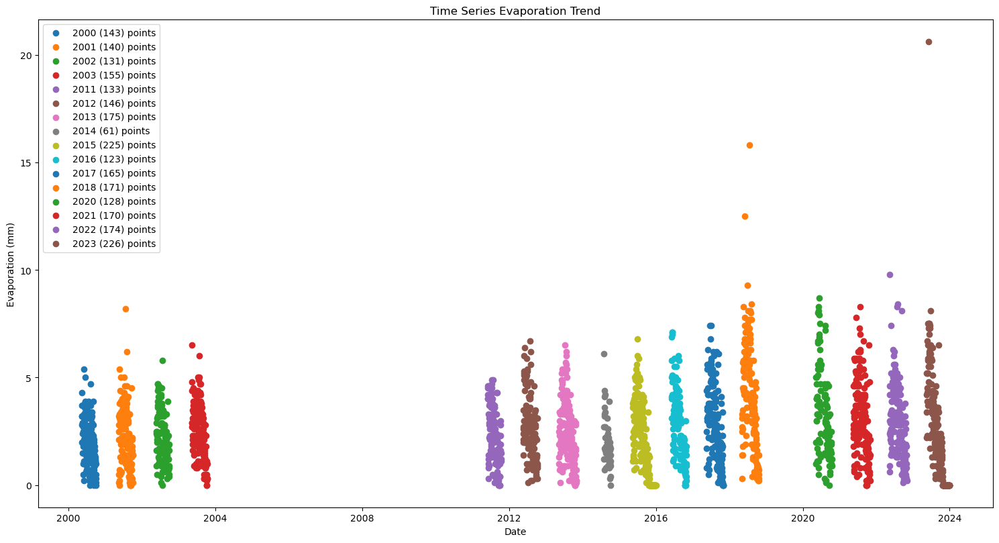

In [12]:
# Draw the scatter plot of the evaporation witht respect to time
# Filter out rows where evaporation is not missing
valid_evap_data = dataset_copied.dropna(subset=['evaporation_mm'])

# Group the valid data by year
# valid_evap_data['Year'] = valid_evap_data['year']
grouped_evap_data = valid_evap_data.groupby('year')

# Draw the scatter plot of snow_depth_cm vs date
def scatter_evaporation_timeseries(dataset_name, file='images/evaporation_mm_trend.png'):
    # Determine the number of unique groups (years) to adjust the figure size
    num_years = len(dataset_name['year'].unique())
    
    # Base figure height and additional height per year
    base_height = 5
    extra_height_per_year = 0.2
    
    # Adjust figure height based on the number of legend items
    fig_height = base_height + extra_height_per_year * num_years
    fig, ax = plt.subplots(figsize=(15, fig_height))
    
    for year, group in dataset_name:
        ax.scatter(group['date'], group['evaporation_mm'], label=f'{year} ({len(group)}) points')
    
    # Set plot title and labels
    ax.set(title="Time Series Evaporation Trend", xlabel="Date", ylabel="Evaporation (mm)")
    
    # Add legend outside the plot area
    ax.legend()
    
    # Adjust layout to make room for the legend
    plt.tight_layout()
    
    # Save the plot
    plt.savefig(file, bbox_inches='tight')
    plt.show()
    
scatter_evaporation_timeseries(grouped_evap_data, 'images/evaporation_mm_missing_values')

### The above evaporation scatter plot shows there is missing data from 2004 - 2010 and 2019 which are in total 8 years. So, we can see at least 8 years data is fully missing. The majority of the evaporation value range from 0 to 10mm but there are three values which tend to be outliers and can be removed from the dataset. Two of them are in 2018 (12.5mm and 15.8mm) and one is in 2023 (20.6mm).

#### Remove the evaporation outliers (>10mm) from the dataset and redraw the scatter plot of evaporation timeseries

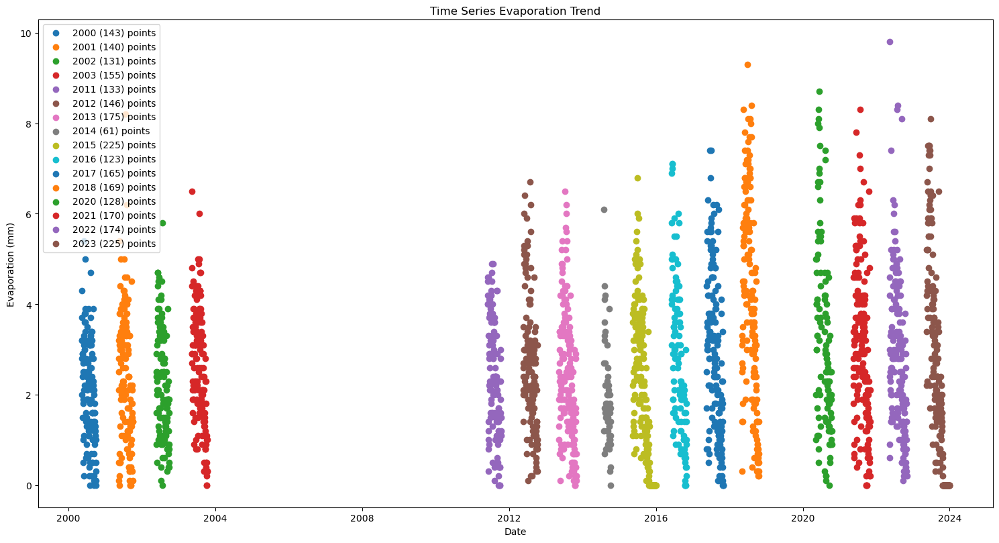

In [13]:
# Filter rows where 'evaporation_mm' is less than or equal to 10 and re-draw
dataset_copied = dataset_copied[(dataset_copied['evaporation_mm'] <= 10) | (pd.isna(dataset_copied['evaporation_mm']))]

# Filter out rows where evaporation is not missing
valid_evap_data = dataset_copied.dropna(subset=['evaporation_mm'])

# Group the valid data by year
grouped_evap_data = valid_evap_data.groupby('year')
# Redraw the evaporation_mm with time for outliers removed
scatter_evaporation_timeseries(grouped_evap_data, 'images/evaporation_mm_outliers_removed.png')

#### Fill the missing values of evaporation by the average of each same day throughout the years for non-empty values.

In [14]:
dataset_copied.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8853 entries, 0 to 8855
Data columns (total 23 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   ID                                   8853 non-null   int64         
 1   date                                 8853 non-null   datetime64[ns]
 2   mean_air_temperature_2m              8853 non-null   float64       
 3   min_air_temperature_2m               8853 non-null   float64       
 4   max_air_temperature_2m               8853 non-null   float64       
 5   relative_humidity                    8761 non-null   float64       
 6   air_pressure_2m_mbar                 8819 non-null   float64       
 7   precipitation_mm                     8399 non-null   float64       
 8   evaporation_mm                       2463 non-null   float64       
 9   earth_heat_flux_MJ_m2                7888 non-null   float64       
 10  radiation_balance

In [15]:
dataset_copied.isna().sum()

ID                                        0
date                                      0
mean_air_temperature_2m                   0
min_air_temperature_2m                    0
max_air_temperature_2m                    0
relative_humidity                        92
air_pressure_2m_mbar                     34
precipitation_mm                        454
evaporation_mm                         6390
earth_heat_flux_MJ_m2                   965
radiation_balance_w_m2                  202
phosynthetic_active_radiation_mE_m2     427
albedo_RR_GR                            684
snow_depth_cm                          7534
ST2                                      96
ST5                                      94
ST10                                    157
ST20                                    170
ST50                                    324
ST100                                    95
year                                      0
month                                     0
day                             

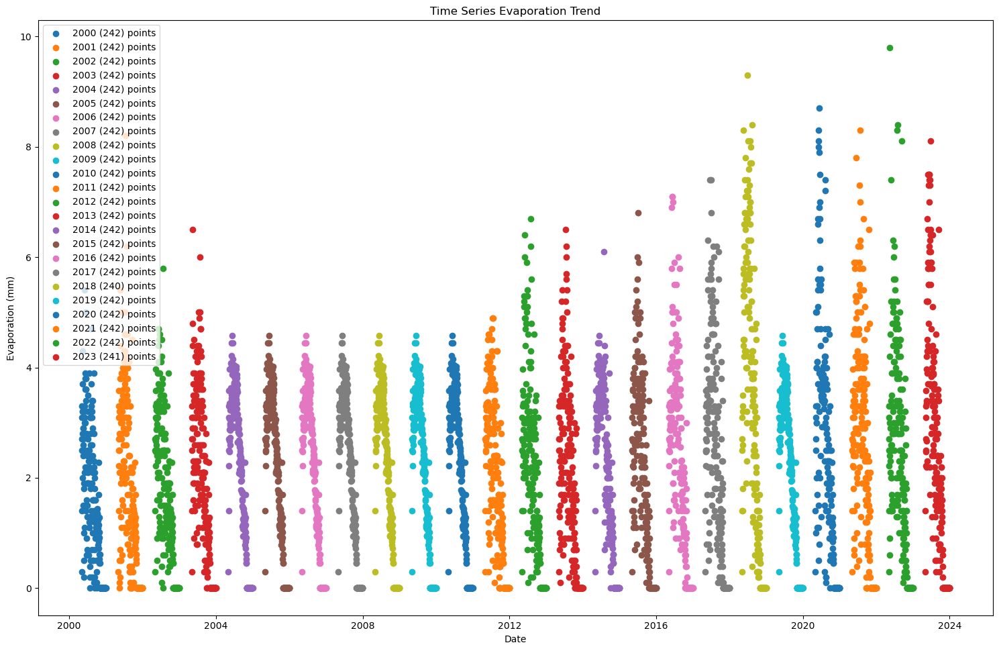

In [16]:
# Calculate the mean for evaporation_mm considering only non-NaN values for each day and month
mean_values = dataset_copied.groupby(['day', 'month'])['evaporation_mm'].apply(lambda x: x.dropna().mean()).reset_index(name='evaporation_mm_mean')

# Merge mean_values with the original DataFrame to fill missing values
dataset_copied = pd.merge(dataset_copied, mean_values, on=['day', 'month'], how='left')

# Fill missing values for evaporation_mm with the mean values calculated for the specific range of years
def fill_missing_evaporation(row):
    if pd.isna(row['evaporation_mm']):
        # Calculate the mean value for the specific range of years
        filtered_means = mean_values[(mean_values['day'] == row['day']) & (mean_values['month'] == row['month'])]
        mean_value = filtered_means['evaporation_mm_mean'].mean() if not filtered_means.empty else None
        return mean_value
    else:
        return row['evaporation_mm']

# Fill missing values for evaporation_mm with the mean values calculated for the specific range of years
dataset_copied['evaporation_mm'] = dataset_copied.apply(fill_missing_evaporation, axis=1)
# Drop auxiliary columns
dataset_copied.drop('evaporation_mm_mean', axis=1, inplace=True)
# Drop duplicates in case there are overlapping values from the merge
dataset_copied.drop_duplicates(inplace=True)

# Redraw the scatter plot for evaporation timeseries
# Filter out rows where evaporation is not missing
valid_evap_data = dataset_copied.dropna(subset=['evaporation_mm'])

# Group the valid data by year
grouped_evap_data = valid_evap_data.groupby('year')

# Draw the scatter plot of snow_depth_cm vs date
scatter_evaporation_timeseries(grouped_evap_data, 'images/evaporation_mm_missing_values_filled.png')

In [17]:
dataset_copied.isna().sum()

ID                                        0
date                                      0
mean_air_temperature_2m                   0
min_air_temperature_2m                    0
max_air_temperature_2m                    0
relative_humidity                        92
air_pressure_2m_mbar                     34
precipitation_mm                        454
evaporation_mm                         3048
earth_heat_flux_MJ_m2                   965
radiation_balance_w_m2                  202
phosynthetic_active_radiation_mE_m2     427
albedo_RR_GR                            684
snow_depth_cm                          7534
ST2                                      96
ST5                                      94
ST10                                    157
ST20                                    170
ST50                                    324
ST100                                    95
year                                      0
month                                     0
day                             

#### Let's count and draw the missing values based on monthes to see if the evaporation is missing for winter seasons

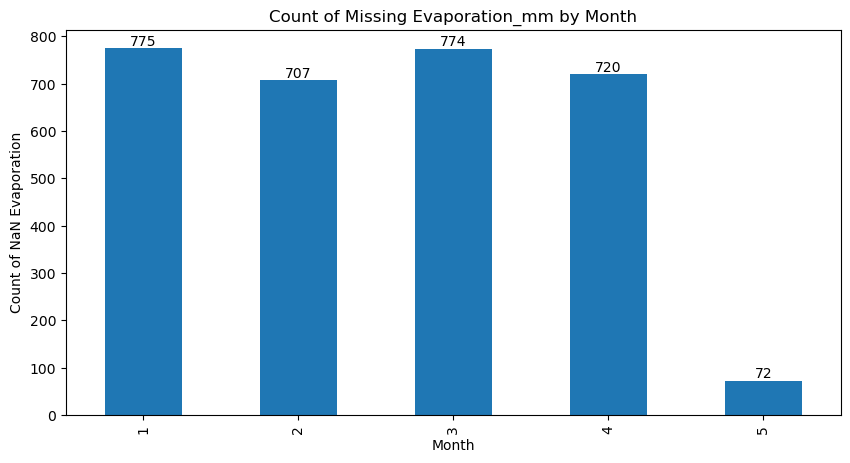

In [18]:
# Filter the dataframe to select rows where evaporation_mm is NaN
nan_evaporation = dataset_copied[dataset_copied['evaporation_mm'].isna()]

# Group by month and count NaN occurrenc
nan_evaporation_counts = nan_evaporation.groupby('month').size()

# Define the plot
fig, ax = plt.subplots(figsize=(10,5))
# Plotting the bar graph
nan_evaporation_counts.plot(kind='bar', ax=ax)

# Annotating each bar with its count value
for i, count in enumerate(nan_evaporation_counts):
    ax.text(i, count, str(count), ha='center', va='bottom')

# Setting labels and title
ax.set_xlabel('Month')
ax.set_ylabel('Count of NaN Evaporation')
ax.set_title('Count of Missing Evaporation_mm by Month')
# Save the figure to a file (e.g., PNG, PDF, etc.)
plt.savefig('images/evaporation_missing_count_by_month.png')  # Save as PNG format
# Displaying the plot
plt.show()

#### The above bargraph shows the missing evaporation measurements are mostly from January - April except few in May. This could be due to the winter season that evaporation is less likely. So, we can fill them all by zero value.

In [19]:
# Fill the missing evaporation_mm values by zero
dataset_copied['evaporation_mm'] = dataset_copied['evaporation_mm'].fillna(0.0)
dataset_copied.isna().sum()

ID                                        0
date                                      0
mean_air_temperature_2m                   0
min_air_temperature_2m                    0
max_air_temperature_2m                    0
relative_humidity                        92
air_pressure_2m_mbar                     34
precipitation_mm                        454
evaporation_mm                            0
earth_heat_flux_MJ_m2                   965
radiation_balance_w_m2                  202
phosynthetic_active_radiation_mE_m2     427
albedo_RR_GR                            684
snow_depth_cm                          7534
ST2                                      96
ST5                                      94
ST10                                    157
ST20                                    170
ST50                                    324
ST100                                    95
year                                      0
month                                     0
day                             

### Plot the evaporation data after removing all missing values

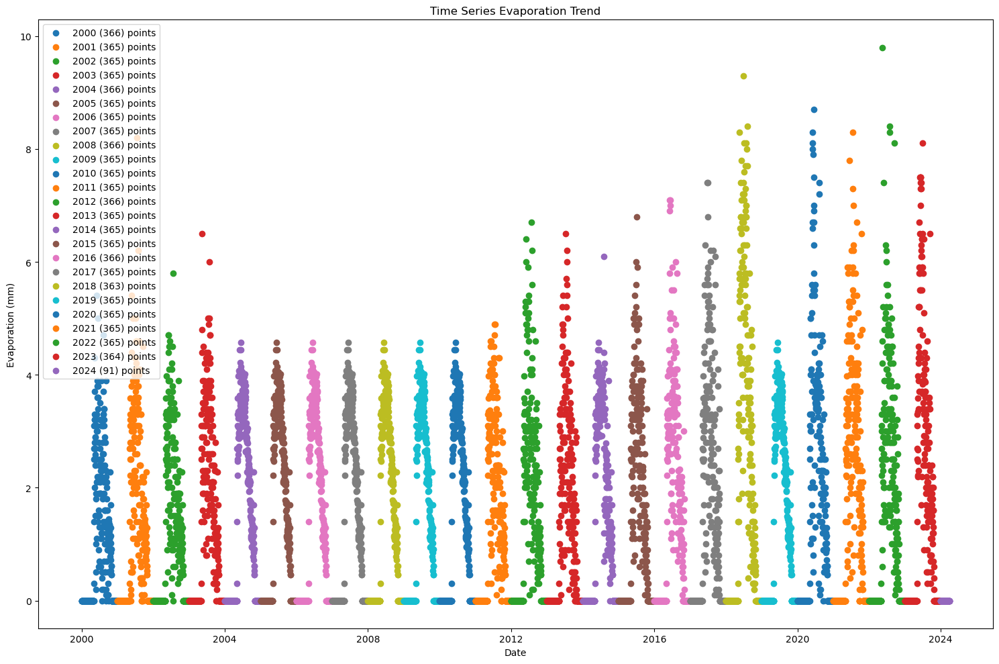

In [20]:
# Redraw the scatter plot for evaporation timeseries
# Filter out rows where evaporation is not missing
valid_evap_data_filled = dataset_copied.dropna(subset=['evaporation_mm'])

# Group the valid data by year
grouped_evap_data_filled = valid_evap_data_filled.groupby('year')

# Draw the scatter plot of snow_depth_cm vs date
scatter_evaporation_timeseries(grouped_evap_data_filled, 'images/evaporation_mm_all_missing_values_filled.png')

#### Draw Snow Depth(cm) vs Time to see the trend and missing values with time

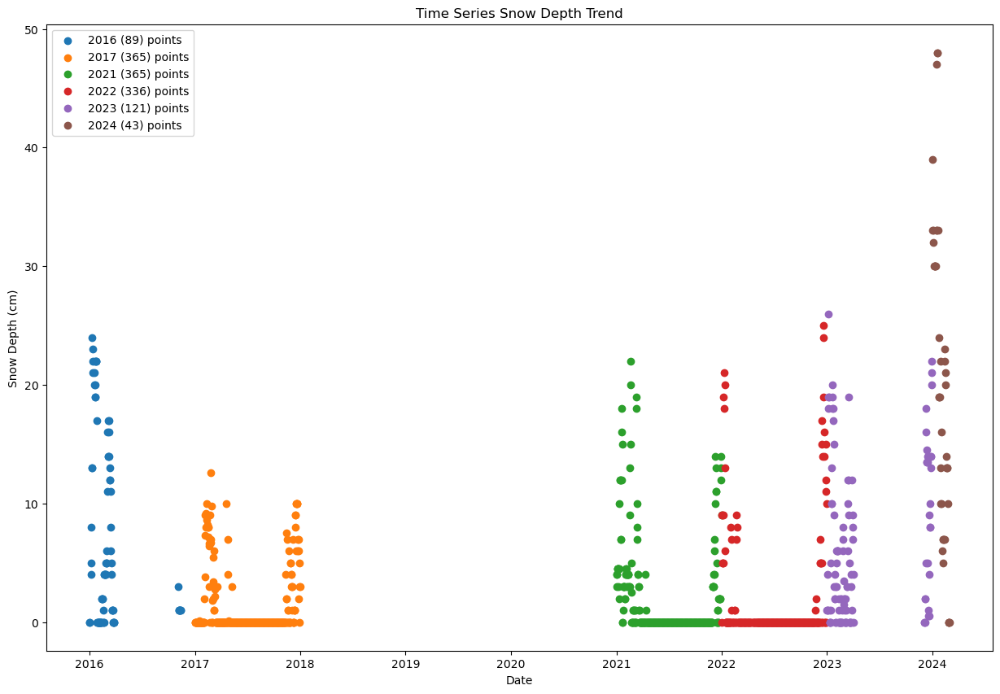

In [21]:
def scatter_snow_depth_timeseries(dataset_name, file='images/snow_depth_time_series.png'):
    # Draw the scatter plot of the evaporation witht respect to time
    # Determine the number of unique groups (years) to adjust the figure size
    num_years = len(dataset_name['year'].unique())
    
    # Base figure height and additional height per year
    base_height = 5
    extra_height_per_year = 0.2
    
    # Adjust figure height based on the number of legend items
    fig_height = base_height + extra_height_per_year * num_years
    fig, ax = plt.subplots(figsize=(15, fig_height))
    # Filter out rows where snow_depth_cm is not missing
    valid_snow_data = dataset_name.dropna(subset=['snow_depth_cm'])
    
    # Group the valid data by year
    # valid_snow_data['Year'] = valid_snow_data['date'].dt.year
    grouped_snow_data = valid_snow_data.groupby('year')
    
    for year, group in grouped_snow_data:
        ax.scatter(group['date'], group['snow_depth_cm'], label=f'{year} ({len(group)}) points')
    
    # Set plot title and labels
    ax.set(title="Time Series Snow Depth Trend", xlabel="Date", ylabel="Snow Depth (cm)")
    
    # Add legend
    ax.legend()
    # Save the figure to a file (e.g., PNG, PDF, etc.)
    plt.savefig(file)
    
    plt.show()
    
scatter_snow_depth_timeseries(dataset_copied, 'images/snow_depth_time_series_missing_values.png')

### The above snow depth scatter plot shows that snow data is completely missing from 2000-2015 and 2019. The daily snow depth ranges from 0 to about 50 cm.

### Some of the surface snow thickness values missing from the dataset are filled from the data gathered from MET Norway Frost API from 10/01/2016 - 29/03/2024

In [22]:
# Merge the two dataframes based on the 'date' column
snow_thickness = pd.read_csv('data/surface_snow_daily_2016_2024.csv')
snow_thickness['date'] = pd.to_datetime(snow_thickness['date'])
# Replace all values of snow_thickness['snow_depth_cm'] equal to -1 with 0 because -1 in MET Frost API indicates it is a very low or zero snow depth
snow_thickness.loc[snow_thickness['snow_depth_cm'] == -1, 'snow_depth_cm'] = 0

# Merge the two dataframes based on the 'date' column
merged_df = pd.merge(dataset_copied, snow_thickness, on='date', suffixes=('_copied', '_thickness'), how='left')

# Copy values from 'snow_depth_cm_thickness' to 'snow_depth_cm_copied' where 'snow_depth_cm_copied' is NaN
merged_df['snow_depth_cm_copied'] = merged_df['snow_depth_cm_copied'].fillna(merged_df['snow_depth_cm_thickness'])

# Drop the 'snow_depth_cm_thickness' column
merged_df.drop(['snow_depth_cm_thickness','index','elementId','sourceId'], axis=1, inplace=True)

# If needed, you can rename the 'snow_depth_cm_copied' column back to 'snow_depth_cm'
merged_df.rename(columns={'snow_depth_cm_copied': 'snow_depth_cm'}, inplace=True)

# Now, merged_df contains the updated snow depth values in the dataset_copied dataframe

# To overwrite the original dataset_copied with the updated values:
dataset_copied = merged_df.copy()

In [23]:
dataset[dataset['albedo_RR_GR'] < 0]['date']

Series([], Name: date, dtype: datetime64[ns])

In [24]:
dataset_copied.isna().sum()

ID                                        0
date                                      0
mean_air_temperature_2m                   0
min_air_temperature_2m                    0
max_air_temperature_2m                    0
relative_humidity                        92
air_pressure_2m_mbar                     34
precipitation_mm                        454
evaporation_mm                            0
earth_heat_flux_MJ_m2                   965
radiation_balance_w_m2                  202
phosynthetic_active_radiation_mE_m2     427
albedo_RR_GR                            684
snow_depth_cm                          6435
ST2                                      96
ST5                                      94
ST10                                    157
ST20                                    170
ST50                                    324
ST100                                    95
year                                      0
month                                     0
day                             

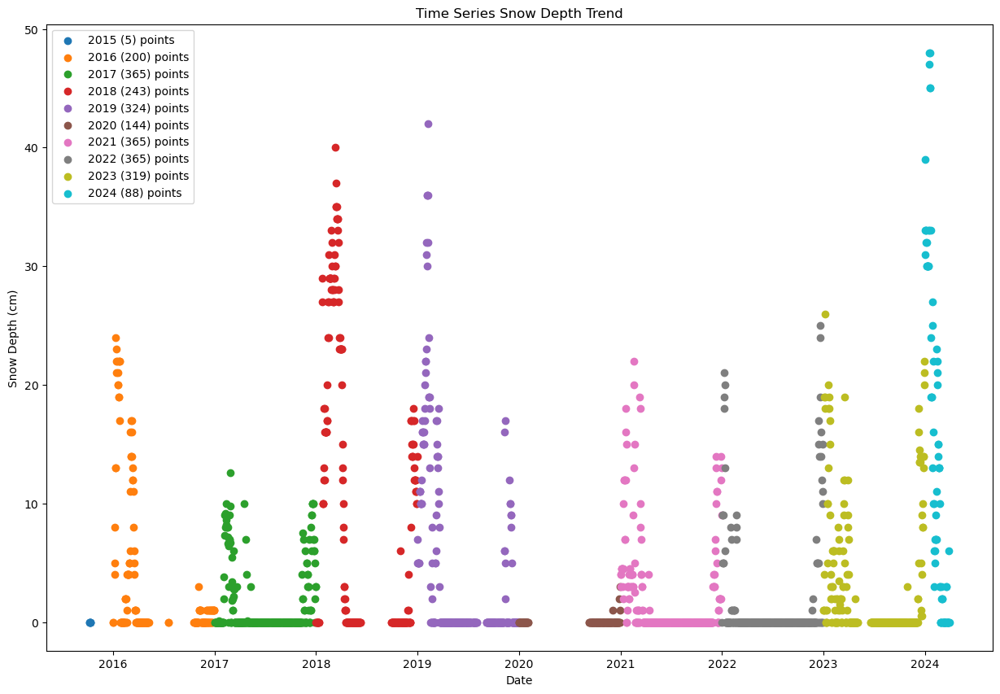

In [25]:
# Redraw the snow depth after some fillna
scatter_snow_depth_timeseries(dataset_copied, 'images/snow_depth_missing_values_filled_from_MET.png')

### Let's count and draw the missing values from 2016 - 2024 based on months to see if the snow depth is missing for non-winter seasons

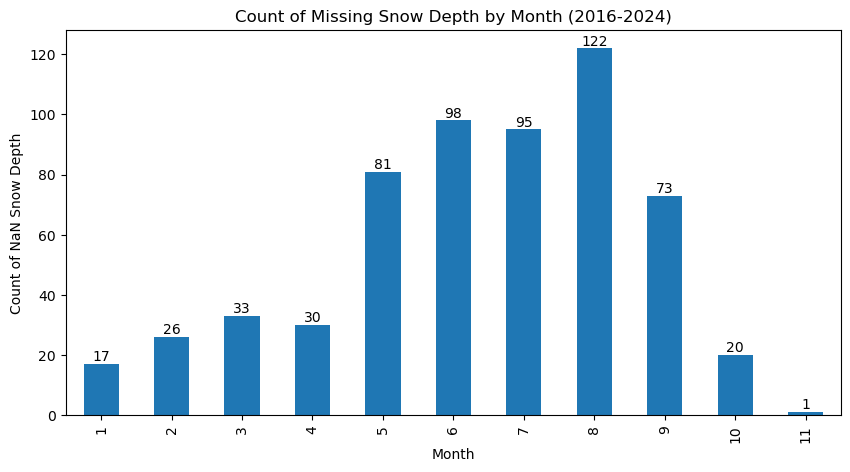

In [26]:
# Filter the dataframe to select rows for years 2016 to 2024 because the snow depth before 2016 is completely missing.
filtered_data = dataset_copied[(dataset_copied['year'] >= 2016) & (dataset_copied['year'] <= 2024)]

# Further filter the dataframe to select rows where snow_depth_cm is NaN
nan_snow_depth = filtered_data[filtered_data['snow_depth_cm'].isna()]

# Group by year and month and count NaN occurrences
nan_snow_depth_counts = nan_snow_depth.groupby(['year', 'month']).size().unstack(fill_value=0)

# Sum the counts across years to get the total missing values for each month
nan_snow_depth_counts_by_month = nan_snow_depth_counts.sum(axis=0)

# Define the plot
fig, ax = plt.subplots(figsize=(10, 5))

# Plotting the bar graph
nan_snow_depth_counts_by_month.plot(kind='bar', ax=ax)

# Annotating each bar with its count value
for i, count in enumerate(nan_snow_depth_counts_by_month):
    ax.text(i, count, str(count), ha='center', va='bottom')

# Setting labels and title
ax.set_xlabel('Month')
ax.set_ylabel('Count of NaN Snow Depth')
ax.set_title('Count of Missing Snow Depth by Month (2016-2024)')

# Save the figure to a file (e.g., PNG, PDF, etc.)
plt.savefig('images/snow_depth_missing_count_by_month.png')  # Save as PNG format

# Displaying the plot
plt.show()

### Define a helper function that is used to do the following:
##### 1. Fill missing values for each month of the year with the mean value of that month for the same year.
##### 2. For months where the mean value is NaN (i.e., all values for that month in the same year are NaN), fill missing values with the mean value of that month across all other years. 

In [27]:
# # Define a generic function that is used for filling missing values different columns
# def fill_missing_values(row_data, dataset_passed, column_name):
#     """
#     Fill missing values for a specified column based on conditions.
    
#     Parameters:
#         row_data (pandas.Series): A single row_data of the DataFrame.
#         dataset (pandas.DataFrame): The DataFrame containing the dataset.
#         column_name (str): The name of the column to fill missing values for.
    
#     Returns:
#         float: The filled value for the specified column.
#     """
#     if pd.isna(row_data[column_name]):
#         # Extract year and month from the current row_data
#         year = row_data['year']
#         month = row_data['month']
        
#         # Check if there are any non-NaN values for the same month and year
#         same_month_year = dataset_passed[(dataset_passed['year'] == year) & (dataset_passed['month'] == month)]
#         valid_values = same_month_year.dropna(subset=[column_name])
        
#         if not valid_values.empty:
#             # Calculate the mean of non-NaN values for the same month and year
#             mean_value = valid_values[column_name].mean()
#         else:
#             # Calculate the mean of non-NaN values for the same month in other years
#             other_years = dataset_passed[(dataset_passed['month'] == month) & (dataset_passed['year'] != year)]
#             other_years_valid_value = other_years.dropna(subset=[column_name])
#             mean_value = other_years_valid_value[column_name].mean()
        
#         return mean_value
#     else:
#         # If the value is not NaN, return the original value
#         return row_data[column_name]

# def fill_missing_by_monthly_mean(column_name, dataset_passed):
#     dataset_passed[column_name] = dataset_passed.apply(lambda row_data: fill_missing_values(row_data, dataset_passed, column_name), axis=1)

### Fill missing values of all features using the above helper function

In [28]:
# %%time
# # Fill the missing values for all features by the monthly mean of that specific year or mean value of that month across all other years if the month of that specific year is NaN
# fill_missing_by_monthly_mean("evaporation_mm", dataset_copied)
# fill_missing_by_monthly_mean("ST2", dataset_copied)
# fill_missing_by_monthly_mean("ST5", dataset_copied)
# fill_missing_by_monthly_mean("ST10", dataset_copied)
# fill_missing_by_monthly_mean("ST20", dataset_copied)
# fill_missing_by_monthly_mean("ST50", dataset_copied)
# fill_missing_by_monthly_mean("ST100", dataset_copied)
# fill_missing_by_monthly_mean("relative_humidity", dataset_copied)
# fill_missing_by_monthly_mean("air_pressure_2m_mbar", dataset_copied)
# fill_missing_by_monthly_mean("radiation_balance_w_m2", dataset_copied)
# fill_missing_by_monthly_mean("albedo_RR_GR", dataset_copied)
# fill_missing_by_monthly_mean("earth_heat_flux_MJ_m2", dataset_copied)
# fill_missing_by_monthly_mean("precipitation_mm", dataset_copied)
# fill_missing_by_monthly_mean("snow_depth_cm", dataset_copied)
# fill_missing_by_monthly_mean("phosynthetic_active_radiation_mE_m2", dataset_copied)

### Define helper function that takes mean value of the same day and month across all years

In [29]:
# Define a generic function that is used for filling missing values different columns
def fill_missing_values_by_mean_day(row_data, dataset_passed, column_name):
    """
    Fill missing values for a specified column based on conditions.
    
    Parameters:
        row_data (pandas.Series): A single row_data of the DataFrame.
        dataset (pandas.DataFrame): The DataFrame containing the dataset.
        column_name (str): The name of the column to fill missing values for.
    
    Returns:
        float: The filled value for the specified column.
    """
    if pd.isna(row_data[column_name]):
        # Extract year and month from the current row_data
        year = row_data['year']
        month = row_data['month']
        day = row_data['day']
        
        # Check if there are any non-NaN values for the same month and year
        same_month_day = dataset_passed[(dataset_passed['day'] == day) & (dataset_passed['month'] == month)]
        valid_day_values = same_month_day.dropna(subset=[column_name])
        # Check if there are any non-NaN values for the same month and year
        same_month_year = dataset_passed[(dataset_passed['year'] == year) & (dataset_passed['month'] == month)]
        valid_month_values = same_month_year.dropna(subset=[column_name])
        
        if not valid_day_values.empty:
            # Calculate the mean of non-NaN values for the same month and year
            mean_values = valid_day_values[column_name].mean()
        elif not valid_month_values.empty:            
            mean_values = valid_month_values[column_name].mean()
        else:
            # Calculate the mean of non-NaN values for the same month in other years
            other_years = dataset_passed[(dataset_passed['month'] == month)]
            other_years_valid_value = other_years.dropna(subset=[column_name])
            mean_values = other_years_valid_value[column_name].mean()
        
        return mean_values
    else:
        # If the value is not NaN, return the original value
        return row_data[column_name]

def fill_missing_by_daily_mean(column_name, dataset_passed):
    dataset_passed[column_name] = dataset_passed.apply(lambda row_data: fill_missing_values_by_mean_day(row_data, dataset_passed, column_name), axis=1)

In [30]:
mean_values

,day,month,evaporation_mm_mean
0,1,1,NaN
1,1,2,NaN
2,1,3,NaN
3,1,4,NaN
4,1,5,NaN
...,...,...,...
361,31,5,3.630769
362,31,7,3.692857
363,31,8,2.537500
364,31,10,0.457143


### Fill missing values of all features using the daily mean above helper function

In [31]:
%%time
# Fill the missing values for all features by the monthly mean of that specific year or mean value of that month across all other years if the month of that specific year is NaN
fill_missing_by_daily_mean("evaporation_mm", dataset_copied)
fill_missing_by_daily_mean("ST2", dataset_copied)
fill_missing_by_daily_mean("ST5", dataset_copied)
fill_missing_by_daily_mean("ST10", dataset_copied)
fill_missing_by_daily_mean("ST20", dataset_copied)
fill_missing_by_daily_mean("ST50", dataset_copied)
fill_missing_by_daily_mean("ST100", dataset_copied)
fill_missing_by_daily_mean("relative_humidity", dataset_copied)
fill_missing_by_daily_mean("air_pressure_2m_mbar", dataset_copied)
fill_missing_by_daily_mean("radiation_balance_w_m2", dataset_copied)
fill_missing_by_daily_mean("albedo_RR_GR", dataset_copied)
fill_missing_by_daily_mean("earth_heat_flux_MJ_m2", dataset_copied)
fill_missing_by_daily_mean("precipitation_mm", dataset_copied)
fill_missing_by_daily_mean("snow_depth_cm", dataset_copied)
fill_missing_by_daily_mean("phosynthetic_active_radiation_mE_m2", dataset_copied)

CPU times: total: 22.4 s
Wall time: 35 s


In [32]:
dataset_copied.isna().sum()

ID                                     0
date                                   0
mean_air_temperature_2m                0
min_air_temperature_2m                 0
max_air_temperature_2m                 0
relative_humidity                      0
air_pressure_2m_mbar                   0
precipitation_mm                       0
evaporation_mm                         0
earth_heat_flux_MJ_m2                  0
radiation_balance_w_m2                 0
phosynthetic_active_radiation_mE_m2    0
albedo_RR_GR                           0
snow_depth_cm                          0
ST2                                    0
ST5                                    0
ST10                                   0
ST20                                   0
ST50                                   0
ST100                                  0
year                                   0
month                                  0
day                                    0
dtype: int64

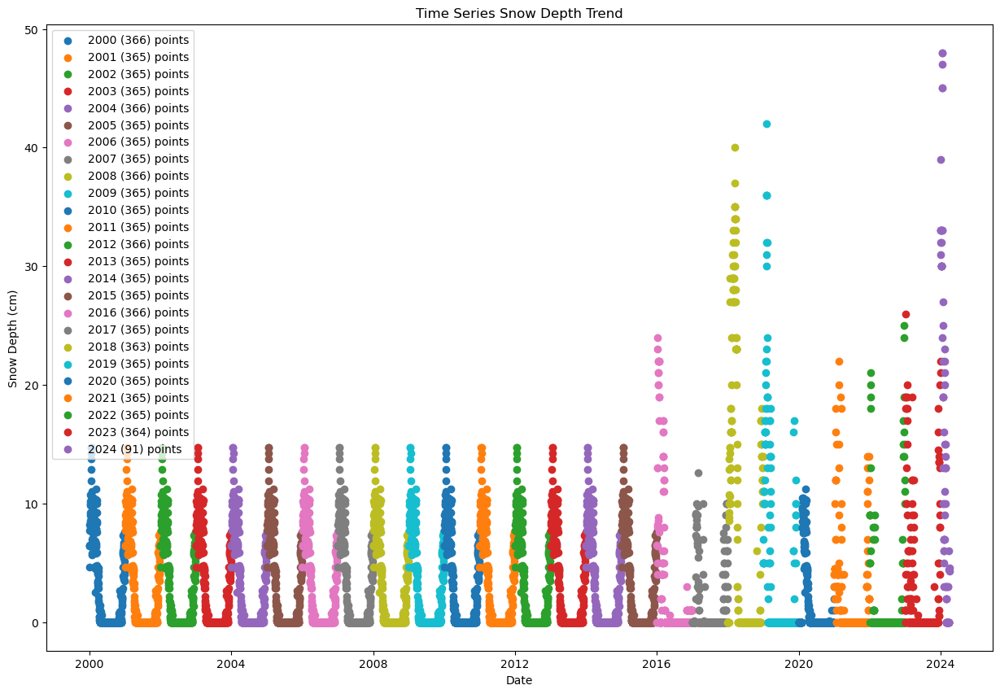

In [33]:
scatter_snow_depth_timeseries(dataset_copied, 'images/snow_depth_with_all_missing_values_filled.png')

### Soil temperature at 100cm with respect to time

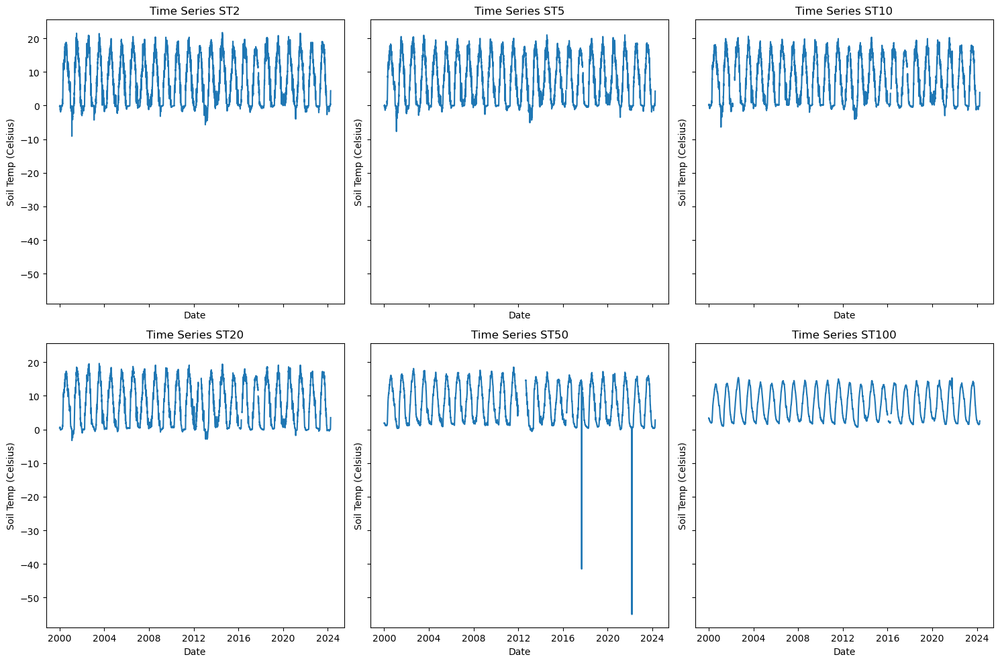

In [34]:
import matplotlib.pyplot as plt

# Define the list of columns you want to plot
columns = ["ST2", "ST5", "ST10", "ST20", "ST50", "ST100"]

# Create a figure and a set of subplots with 2 rows and 3 columns
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10), sharex=True, sharey=True)

# Flatten the 2D array of axes for easy iteration
axs = axs.flatten()

# Plot each column in a separate subplot
for ax, column in zip(axs, columns):
    ax.plot(dataset["date"], dataset[column])
    ax.set_title(f"Time Series {column}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Soil Temp (Celsius)")

# Adjust layout to prevent overlap
fig.tight_layout()

# Save the figure to a file (e.g., PNG, PDF, etc.)
plt.savefig('images/soil_temperature_time_trend_grid.png')  # Save as PNG format

# Show the plot
plt.show()


#### The time series scatter chart shows that there is similar trend of increase and decrease every year except few times like at around 2016, it showed discontinuous nature  which is due to missing measurement errors. Overall, the dataset shows us that our data is a real timeseries data.

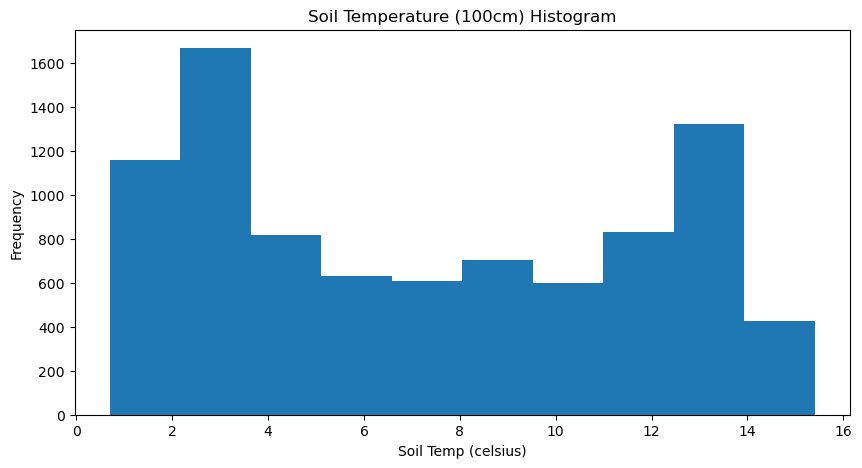

In [35]:
fig, ax = plt.subplots(figsize =(10,5))
ax.hist(dataset["ST100"]);
ax.set(title="Soil Temperature (100cm) Histogram", xlabel='Soil Temp (celsius)', ylabel="Frequency");

### Let's see the scatter plots of the the original values of the important features

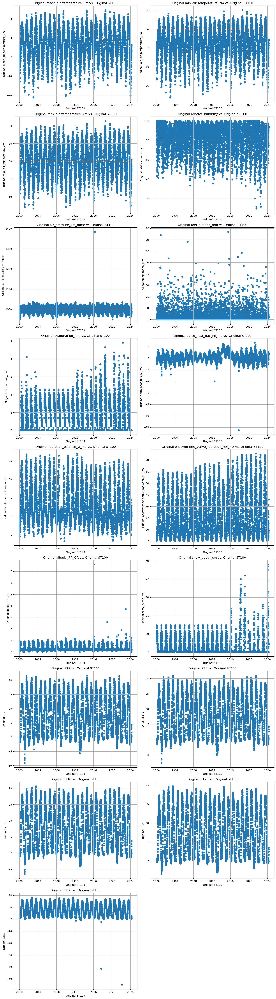

In [36]:
# Extract the features list from the dataset columns
features = dataset_copied.columns.tolist()
# remove the ST100 feature from the features list
features.remove('ST100')
# reomve the date feature from the features list
features.remove('date')
# reomve the year feature from the features list
features.remove('year')
# remove the month feature from the features list
features.remove('month')
# reomve the day feature from the features list
features.remove('day')
# reomve the ID from the features list
features.remove('ID')

# Extract the 'ST100' series
original_date = dataset_copied['date']

# Extract the important features
original_df = dataset_copied[features]

# Calculate the number of rows needed for the subplot grid
num_features = len(features)
num_cols = 2  # Number of columns for subplots
num_rows = (num_features + num_cols - 1) // num_cols

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))

# Plot z-score normalized features against z-score normalized 'ST100' individually
for i, feature in enumerate(features):
    row = i // num_cols
    col = i % num_cols
    ax = axs[row, col]
        
    ax.scatter(original_date, original_df[feature])
    ax.set_title(f'Original {feature} vs. Original ST100')
    ax.set_xlabel('Original ST100')
    ax.set_ylabel(f'Original {feature}')
    ax.grid(True)

# Hide any empty subplots
for i in range(num_features, num_rows * num_cols):
    axs.flatten()[i].axis('off')

plt.tight_layout()
plt.show()

### Let's check the outliers by normalizing our features using the z-score method seeing the trend on the scatter plots

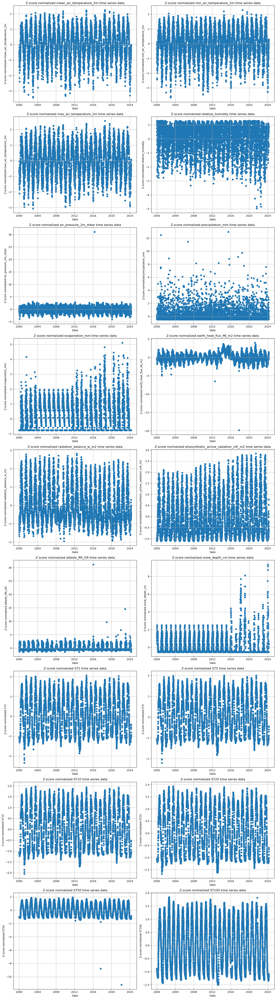

In [37]:
# Extract the features list from the dataset columns
features = dataset_copied.columns.tolist()
# reomve the date feature from the features list
features.remove('date')
# reomve the year feature from the features list
features.remove('year')
# remove the month feature from the features list
features.remove('month')
# reomve the day feature from the features list
features.remove('day')
# reomve the ID from the features list
features.remove('ID')

# Calculate Z-score for the target variable 'ST100'
# zscore_ST100 = (dataset_copied['ST100'] - dataset_copied['ST100'].mean()) / dataset_copied['ST100'].std()
# Date values
zscore_date = dataset_copied['date']

# Calculate Z-score for all features
zscore_df = (dataset_copied[features] - dataset_copied[features].mean()) / dataset_copied[features].std()

# Calculate the number of rows needed for the subplot grid
num_features = len(features)
num_cols = 2  # Number of columns for subplots
num_rows = (num_features + num_cols - 1) // num_cols

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))

# Plot z-score normalized features against z-score normalized 'ST100' individually
for i, feature in enumerate(features):
    row = i // num_cols
    col = i % num_cols
    ax = axs[row, col]
        
    # ax.scatter(zscore_ST100, zscore_df[feature])
    ax.scatter(zscore_date, zscore_df[feature])
    # ax.set_title(f'Z-score Normalized {feature} vs. Z-score Normalized ST100')
    ax.set_title(f'Z-score normalized {feature} time series data')
    # ax.set_xlabel('Z-score Normalized ST100')
    ax.set_xlabel('Date')
    ax.set_ylabel(f'Z-score normalized {feature}')
    ax.grid(True)
    # Save the figure to a file (e.g., PNG, PDF, etc.)
plt.savefig(f'images/zscore_normalized_all_features_time_series_trend_grid.png')  # Save as PNG format

# Hide any empty subplots
for i in range(num_features, num_rows * num_cols):
    axs.flatten()[i].axis('off')

plt.tight_layout()
plt.show()

### The scatter plots above show that there are outliers for some of the features. To remove the outliers, let's first normalize our dataset values to create new normalized dataset

### Define a custom scatter_plot function that takes the features and dataset and plots one feature against the other

In [38]:
def scatter_plot(features, df, parameter):
    # Calculate the number of rows needed for the subplot grid
    num_features = len(features)
    num_cols = 2  # Number of columns for subplots
    num_rows = (num_features + num_cols - 1) // num_cols
    
    # Create subplots
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))
    
    # Plot z-score normalized features against z-score normalized 'ST100' individually
    for i, feature in enumerate(features):
        row = i // num_cols
        col = i % num_cols
        ax = axs[row, col]
        
        ax.scatter(df[parameter], df[feature])
        ax.set_title(f'Z-score Normalized {feature} time series data')
        ax.set_xlabel(f'{parameter}')
        ax.set_ylabel(f'Z-score Normalized {feature}')
        ax.grid(True)
    
    # Hide any empty subplots
    for i in range(num_features, num_rows * num_cols):
        axs.flatten()[i].axis('off')
    
    plt.tight_layout()
    plt.show()

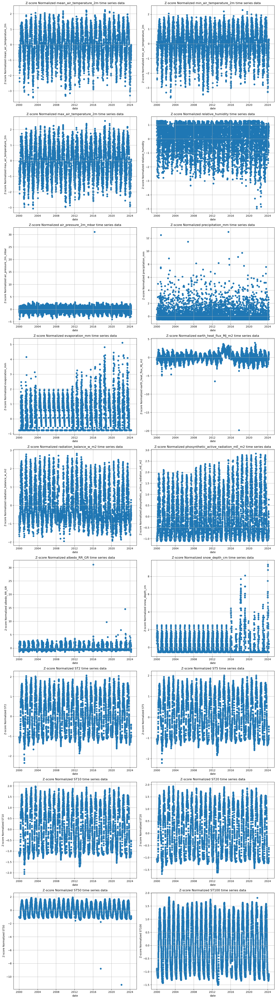

In [39]:
# Extract the features list from the dataset columns
features = dataset_copied.columns.tolist()

# Create a local copy of the dataset and drop the date and year features
dataset_denormalized_original = dataset_copied.drop(['ID','date', 'year'], axis=1)

# Temporary reomve the ID from the features list
features.remove('ID')
# reomve the date feature from the features list
features.remove('date')
# reomve the year feature from the features list
features.remove('year')

# Keep the original dataset's means of each feature for later use in denormalization
mean_original = dataset_denormalized_original[features].mean()
# Keep the original dataset's standard deviationa of each feature for later use in denormalization
std_original = dataset_denormalized_original[features].std()
# Calculate Z-score for all features
zscore_df = (dataset_denormalized_original[features] - mean_original) / std_original

# Create a new DataFrame to store the normalized values
dataset_normalized = zscore_df.copy()

# copy the ID column from the original dataset to the dataset_denormalized
dataset_denormalized_original['ID'] = dataset_copied['ID']
# copy the ID column from the original dataset to the dataset_normalized
dataset_normalized['ID'] = dataset_copied['ID']
dataset_normalized['date'] = dataset_copied['date']

dataset_normalized.to_csv('data/dataset_normalized.csv', index=False)
dataset_denormalized_original.to_csv('data/dataset_denormalized_original.csv', index=False)

# remove the month feature from the features list
features.remove('month')
# reomve the day feature from the features list
features.remove('day')
# Call the custom built scatter plot for multiple features
scatter_plot(features, dataset_normalized, 'date')
# Remove the date column after plotting because it is not used in the modelling
dataset_normalized.drop('date', axis=1, inplace=True)

### Let's check any outliers on our dataset using statistical Z-score and Interquartile Range (IQR) techniques for all the features
#### 1. Z-score: Calculate the z-score for each data point, which represents how many standard deviations it is away from the mean. Data points with a z-score beyond a certain threshold can be considered outliers.
#### 2. IQR: IQR is the range between the first quartile (Q1) and the third quartile (Q3). Data points outside the range (Q1 - 1.5 * IQR, Q3 + 1.5 * IQR) are typically considered outliers.

In [40]:
dataset_normalized

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8848,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8849,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8850,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8851,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


In [41]:
mean_original

mean_air_temperature_2m                  6.499797
min_air_temperature_2m                   2.330645
max_air_temperature_2m                  10.306461
relative_humidity                       81.473572
air_pressure_2m_mbar                   999.841169
precipitation_mm                         2.665921
evaporation_mm                           1.280835
earth_heat_flux_MJ_m2                    0.150250
radiation_balance_w_m2                   3.010018
phosynthetic_active_radiation_mE_m2     21.352327
albedo_RR_GR                             0.344403
snow_depth_cm                            2.551443
ST2                                      7.300344
ST5                                      7.329938
ST10                                     7.329655
ST20                                     7.325070
ST50                                     7.592979
ST100                                    7.299755
month                                    6.476900
day                                     15.729809


In [42]:
std_original

mean_air_temperature_2m                 8.061956
min_air_temperature_2m                  7.846715
max_air_temperature_2m                  8.771632
relative_humidity                      14.428917
air_pressure_2m_mbar                   12.363901
precipitation_mm                        5.726661
evaporation_mm                          1.665765
earth_heat_flux_MJ_m2                   0.637260
radiation_balance_w_m2                  4.933306
phosynthetic_active_radiation_mE_m2    19.074226
albedo_RR_GR                            0.233057
snow_depth_cm                           4.864339
ST2                                     6.964051
ST5                                     6.808724
ST10                                    6.687909
ST20                                    6.360954
ST50                                    5.585820
ST100                                   4.407272
month                                   3.462903
day                                     8.801712
dtype: float64

#### Extract the outliers and histplot of each feature in the dataset_normalized
##### 1. Descriptive outlier detection is used to determine if there is a problem with the data, for example, if the data is not normally distributed.
##### 2. Prescriptive outlier detection is used to determine if a specific action needs to be taken
#### Z-Score is a measure of how many standard deviations a data point is away from the mean. Typically, data points with a Z-Score greater than a threshold are considered outliers

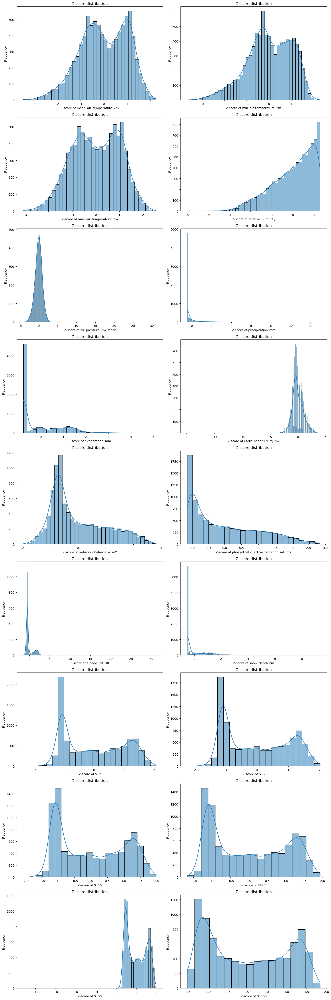

In [43]:
# Get the list of features from our dataset columns
features = dataset_normalized.columns.tolist()

# remove the month feature from the features list
features.remove('month')
# remove the day feature from the features list
features.remove('day')
# remove the ID from the features list
features.remove('ID')

# Define different Z-score thresholds for each feature
zscore_thresholds = {
    'mean_air_temperature_2m': (-4, 3),
    'min_air_temperature_2m': (-4, 3),
    'max_air_temperature_2m': (-4, 3),
    'relative_humidity': (-4, 2),
    'air_pressure_2m_mbar': (-5, 5),
    'precipitation_mm': (-1, 8),
    'evaporation_mm': (-1, 4),
    'earth_heat_flux_MJ_m2': (-5, 5),
    'ST2': (-2, 2.5),
    'ST5': (-2, 2.5),
    'ST10': (-2, 2.5),
    'ST20': (-2, 2.5),
    'ST50': (-2, 2.5),
    'radiation_balance_w_m2': (-2, 3),
    'phosynthetic_active_radiation_mE_m2': (-1.5, 3),
    'albedo_RR_GR': (-15, 5),
    'snow_depth_cm': (-1, 12),
    'ST100': (-2, 2.5)
}

# Plot histograms of Z-scores for all features
num_features = len(features)
num_cols = 2
num_rows = (num_features + num_cols - 1) // num_cols
plt.figure(figsize=(15, 5 * num_rows))
for i, feature in enumerate(features, start=1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(zscore_df[feature], kde=True)
    plt.title('Z-score distribution')
    plt.xlabel(f'Z-score of {feature}')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Identify outliers based on Z-score for all features using different thresholds
outliers_zscore_dict = {}
for feature in features:
    lower_threshold, upper_threshold = zscore_thresholds.get(feature)  
    if upper_threshold is None or lower_threshold is None:
        continue
    outliers_zscore = dataset_normalized[(dataset_normalized[feature]> upper_threshold) | (dataset_normalized[feature] < lower_threshold)]
    if not outliers_zscore.empty:
        outliers_zscore_dict[feature] = outliers_zscore[feature].tolist()

# Calculate IQR for all features
Q1 = dataset_normalized[features].quantile(0.25)
Q3 = dataset_normalized[features].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers based on IQR for all features
outliers_iqr_dict = {}
for feature in features:
    outliers_iqr = dataset_normalized[(dataset_normalized[feature] < Q1[feature] - 1.5 * IQR[feature]) | 
                                               (dataset_normalized[feature] > Q3[feature] + 1.5 * IQR[feature])]
    if not outliers_iqr.empty:
        outliers_iqr_dict[feature] = outliers_iqr[feature].tolist()


#### Remove the outliers for each feature and generate the filtered new dataset

### Compare the difference between the original dataset and the copied dataset

In [44]:
# Assuming 'ID' is the identifier column
id_column = 'ID'

# Find IDs in dataset but not in dataset_denormalized_original
ids_in_dataset_not_in_denormalized = set(dataset[id_column]) - set(dataset_copied[id_column])

# Find IDs in dataset_denormalized_original but not in dataset
ids_in_denormalized_not_in_dataset = set(dataset_copied[id_column]) - set(dataset[id_column])

# Extract rows with these IDs
rows_in_dataset_not_in_denormalized = dataset[dataset[id_column].isin(ids_in_dataset_not_in_denormalized)]
rows_in_denormalized_not_in_dataset = dataset_copied[dataset_copied[id_column].isin(ids_in_denormalized_not_in_dataset)]

print("Rows in dataset but not in dataset_denormalized_original:")
print(rows_in_dataset_not_in_denormalized)

print("Rows in dataset_denormalized_original but not in dataset:")
print(rows_in_denormalized_not_in_dataset)

Rows in dataset but not in dataset_denormalized_original:
        ID       date  mean_air_temperature_2m  min_air_temperature_2m  \
6729  6730 2018-06-04                     19.3                    12.4   
6775  6776 2018-07-20                     19.2                    13.9   
8555  8556 2023-06-05                     15.4                     9.3   

      max_air_temperature_2m  relative_humidity  air_pressure_2m_mbar  \
6729                    23.4               48.0                 997.9   
6775                    24.5               72.0                 999.6   
8555                    20.8               65.7                1007.7   

      precipitation_mm  evaporation_mm  earth_heat_flux_MJ_m2  \
6729               0.0            12.5                    0.8   
6775               0.0            15.8                    0.6   
8555               0.0            20.6                    1.0   

      radiation_balance_w_m2  phosynthetic_active_radiation_mE_m2  \
6729                  

### Generate and save the Normalized Dataset Outlier Filtered By Z-score thresholds

In [45]:
# Deifne the function to remove the outliers from the dataset
def remove_outliers(df, thresholds):
    """
    Removes outliers from a DataFrame based on z-score thresholds.
    
    Parameters:
        df (pd.DataFrame): The input DataFrame (already z-score normalized).
        thresholds (dict): A dictionary containing feature names as keys and (lower, upper) z-score thresholds as values.
    
    Returns:
        pd.DataFrame: DataFrame with outliers removed.
    """
    for feature, (lower, upper) in thresholds.items():
        df = df[(df[feature] >= lower) & (df[feature] <= upper)]
    
    return df

# The thresholds of the DataFrame normalized 'dataset_normalized' (already z-score normalized)
zscore_thresholds = {
    'mean_air_temperature_2m': (-4, 3),
    'min_air_temperature_2m': (-4, 3),
    'max_air_temperature_2m': (-4, 3),
    'relative_humidity': (-4, 2),
    'air_pressure_2m_mbar': (-5, 5),
    'precipitation_mm': (-1, 4),
    'evaporation_mm': (-1, 3),
    'earth_heat_flux_MJ_m2': (-5, 5),
    'ST2': (-2, 2.5),
    'ST5': (-2, 2.5),
    'ST10': (-2, 2.5),
    'ST20': (-2, 2.5),
    'ST50': (-2, 2.5),
    'radiation_balance_w_m2': (-2, 3),
    'phosynthetic_active_radiation_mE_m2': (-1.5, 3),
    'albedo_RR_GR': (-2.5, 2.5),
    'snow_depth_cm': (-1, 2),
    'ST100': (-2, 2.5)
}
# Remove the outliers and generate a new normalized filtered dataset without outliers
dataset_normalized_outlier_filtered = remove_outliers(dataset_normalized, zscore_thresholds)
dataset_normalized_outlier_filtered.to_csv('data/dataset_normalized_outlier_filtered.csv', index=False)

features = dataset_normalized_outlier_filtered.columns.tolist()
# Temporary reomve the ID from the features list
features.remove('ID')
# Generate denormalized filtered dataset equivalent to the normalized filtered
dataset_denormalized_outlier_filtered = (dataset_normalized_outlier_filtered[features] * std_original) + mean_original
dataset_denormalized_outlier_filtered['ID'] = dataset_normalized_outlier_filtered['ID']

In [46]:
dataset_normalized_outlier_filtered

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8848,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8849,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8850,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8851,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


### Use IsolationForest to identify outliers and inliers
#### If there are no outliers the outlier prediction should return all 1 and if there are outliers it will return -1.
#### Identify the outliers using the Isolation Forest from the normalized dataset for ST2, ST5, ST10, ST20, ST50 and ST100

In [47]:
print('============================================= ST2 Outliers ========================================')
# Reset the index of the original outlier filtered DataFrame
dataset_normalized_outlier_filtered = dataset_normalized_outlier_filtered.reset_index(drop=True)
# Drop the target variable and unnecessary columns from the dataset that are not considered as features for target ST5
ST2_X_train_no_target_normalized = dataset_normalized_outlier_filtered.drop(columns=['ST2','ST5','ST10','ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST2_isolation_forest_normalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST2_isolation_forest_normalized.fit(ST2_X_train_no_target_normalized)
# Predict outliers in your dataset
ST2_outlier_preds_normalized = ST2_isolation_forest_normalized.predict(ST2_X_train_no_target_normalized)
if -1 in ST2_outlier_preds_normalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST2_outlier_indices_normalized = np.where(ST2_outlier_preds_normalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST2_outliers_normalized = ST2_X_train_no_target_normalized.iloc[ST2_outlier_indices_normalized]
    ST2_clean_dataset_normalized = dataset_normalized_outlier_filtered.drop(ST2_outlier_indices_normalized)
    print('ST2 Outliers indices: ', len(ST2_outliers_normalized), ST2_outliers_normalized)
else:
    ST2_clean_dataset_normalized = dataset_normalized_outlier_filtered.copy()
    print("No outliers detected.")
ST2_IF_scores = ST2_isolation_forest_normalized.decision_function(ST2_X_train_no_target_normalized)
print("ST2 Scores: ", ST2_IF_scores)



print('============================================= ST5 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features for target ST5
ST5_X_train_no_target_normalized = dataset_normalized_outlier_filtered.drop(columns=['ST5','ST10','ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST5_isolation_forest_normalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST5_isolation_forest_normalized.fit(ST5_X_train_no_target_normalized)
# Predict outliers in your dataset
ST5_outlier_preds_normalized = ST5_isolation_forest_normalized.predict(ST5_X_train_no_target_normalized)
if -1 in ST5_outlier_preds_normalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST5_outlier_indices_normalized = np.where(ST5_outlier_preds_normalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST5_outliers_normalized = ST5_X_train_no_target_normalized.iloc[ST5_outlier_indices_normalized]
    ST5_clean_dataset_normalized = dataset_normalized_outlier_filtered.drop(ST5_outlier_indices_normalized)
    print('ST5 Outliers indices: ', len(ST5_outliers_normalized), ST5_outliers_normalized)
else:
    ST5_clean_dataset_normalized = dataset_normalized_outlier_filtered.copy()
    print("No outliers detected.")
ST5_IF_scores = ST5_isolation_forest_normalized.decision_function(ST5_X_train_no_target_normalized)
print("ST5 Scores: ", ST5_IF_scores)

print('============================================= ST10 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST10_X_train_no_target_normalized = dataset_normalized_outlier_filtered.drop(columns=['ST10','ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST10_isolation_forest_normalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST10_isolation_forest_normalized.fit(ST10_X_train_no_target_normalized)
# Predict outliers in your dataset
ST10_outlier_preds_normalized = ST10_isolation_forest_normalized.predict(ST10_X_train_no_target_normalized)
if -1 in ST10_outlier_preds_normalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST10_outlier_indices_normalized = np.where(ST10_outlier_preds_normalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST10_outliers_normalized = ST10_X_train_no_target_normalized.iloc[ST10_outlier_indices_normalized]
    ST10_clean_dataset_normalized = dataset_normalized_outlier_filtered.drop(ST10_outlier_indices_normalized)
    print('ST10 Outliers indices: ', len(ST10_outliers_normalized), ST10_outliers_normalized)
else:
    ST10_clean_dataset_normalized = dataset_normalized_outlier_filtered.copy()
    print("No outliers detected.")
    
ST10_IF_scores = ST10_isolation_forest_normalized.decision_function(ST10_X_train_no_target_normalized)
print("SST10 Scores: ", ST10_IF_scores)

print('============================================= ST20 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST20_X_train_no_target_normalized = dataset_normalized_outlier_filtered.drop(columns=['ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST20_isolation_forest_normalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST20_isolation_forest_normalized.fit(ST20_X_train_no_target_normalized)
# Predict outliers in your dataset
ST20_outlier_preds_normalized = ST20_isolation_forest_normalized.predict(ST20_X_train_no_target_normalized)
if -1 in ST20_outlier_preds_normalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST20_outlier_indices_normalized = np.where(ST20_outlier_preds_normalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST20_outliers_normalized = ST20_X_train_no_target_normalized.iloc[ST20_outlier_indices_normalized]
    ST20_clean_dataset_normalized = dataset_normalized_outlier_filtered.drop(ST20_outlier_indices_normalized)
    print('ST20 Outliers indices: ', len(ST20_outliers_normalized), ST20_outliers_normalized)
else:
    ST20_clean_dataset_normalized = dataset_normalized_outlier_filtered.copy()
    print("No outliers detected.")

ST20_IF_scores = ST20_isolation_forest_normalized.decision_function(ST20_X_train_no_target_normalized)
print("ST20 Scores: ", ST20_IF_scores)

print('============================================= ST50 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST50_X_train_no_target_normalized = dataset_normalized_outlier_filtered.drop(columns=['ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST50_isolation_forest_normalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST50_isolation_forest_normalized.fit(ST50_X_train_no_target_normalized)
# Predict outliers in your dataset
ST50_outlier_preds_normalized = ST50_isolation_forest_normalized.predict(ST50_X_train_no_target_normalized)
if -1 in ST50_outlier_preds_normalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST50_outlier_indices_normalized = np.where(ST50_outlier_preds_normalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST50_outliers_normalized = ST50_X_train_no_target_normalized.iloc[ST50_outlier_indices_normalized]
    ST50_clean_dataset_normalized = dataset_normalized_outlier_filtered.drop(ST50_outlier_indices_normalized)
    print('ST50 Outliers indices: ', len(ST50_outliers_normalized), ST50_outliers_normalized)
else:
    ST50_clean_dataset_normalized = dataset_normalized_outlier_filtered.copy()
    print("No outliers detected.")

ST50_IF_scores = ST50_isolation_forest_normalized.decision_function(ST50_X_train_no_target_normalized)
print("ST50 Scores: ", ST50_IF_scores)

print('============================================= ST100 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST100_X_train_no_target_normalized = dataset_normalized_outlier_filtered.drop(columns=['ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST100_isolation_forest_normalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST100_isolation_forest_normalized.fit(ST100_X_train_no_target_normalized)
# Predict outliers in your dataset
ST100_outlier_preds_normalized = ST100_isolation_forest_normalized.predict(ST100_X_train_no_target_normalized)
if -1 in ST100_outlier_preds_normalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST100_outlier_indices_normalized = np.where(ST100_outlier_preds_normalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST100_outliers_normalized = ST100_X_train_no_target_normalized.iloc[ST100_outlier_indices_normalized]
    ST100_clean_dataset_normalized = dataset_normalized_outlier_filtered.drop(ST100_outlier_indices_normalized)
    print('ST100 Outliers indices: ', len(ST100_outliers_normalized), ST100_outliers_normalized)
else:
    ST100_clean_dataset_normalized = dataset_normalized_outlier_filtered.copy()
    print("No outliers detected.")

ST100_IF_scores = ST100_isolation_forest_normalized.decision_function(ST100_X_train_no_target_normalized)
print("ST100 Scores: ", ST100_IF_scores)

============================================= ST2 Outliers ========================================
Outliers detected.
ST2 Outliers indices:  886       mean_air_temperature_2m  min_air_temperature_2m  max_air_temperature_2m  \
17                  -2.170664               -2.348836               -1.859000   
23                  -0.793827               -0.870510               -0.730361   
38                  -0.793827               -0.513673               -0.764562   
44                  -1.674506               -1.991999               -0.935568   
55                  -0.855846               -0.679347               -0.935568   
...                       ...                     ...                     ...   
8207                -1.848161               -1.788092               -1.801998   
8208                -1.798546               -1.991999               -1.619591   
8209                -2.071432               -2.132185               -2.087007   
8210                -2.220279               

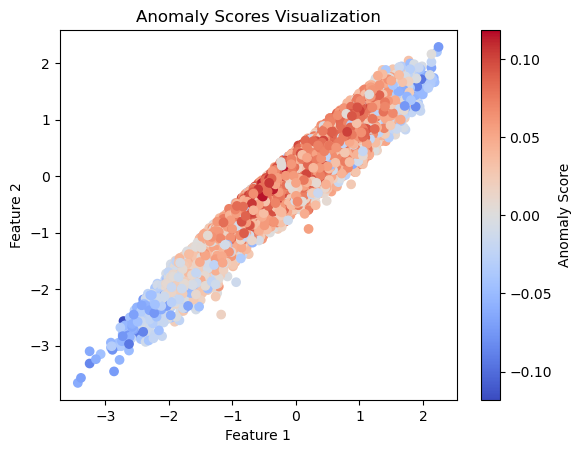

In [48]:
# Plot the results
plt.scatter(ST2_X_train_no_target_normalized.iloc[:, 0], ST2_X_train_no_target_normalized.iloc[:, 1], c=ST2_IF_scores, cmap='coolwarm')
plt.colorbar(label='Anomaly Score')
plt.title('Anomaly Scores Visualization')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

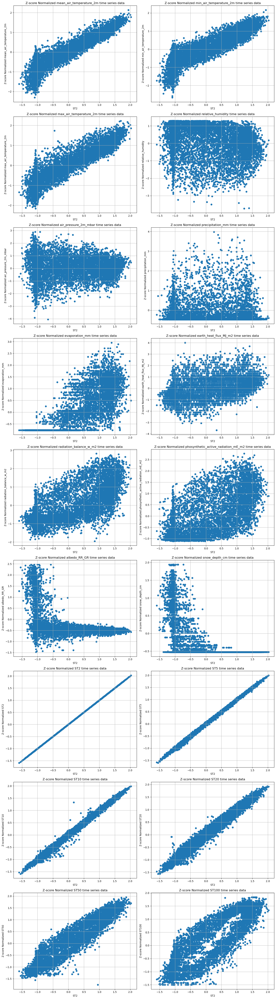

In [49]:
# Extract the features list from the dataset columns
ST2_features = ST2_clean_dataset_normalized.columns.tolist()
# Temporary reomve the ID from the features list
ST2_features.remove('ID')
# remove the month feature from the features list
ST2_features.remove('month')
# reomve the day feature from the features list
ST2_features.remove('day')
# Call the custom built scatter plot for multiple features
scatter_plot(ST2_features, ST2_clean_dataset_normalized, 'ST2')

In [50]:
ST2_clean_dataset_normalized

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8247,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8248,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8249,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8250,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


### Isolate outliers using Isolation Forest from the original denormalized dataset

In [51]:
print('============================================= ST2 Outliers ========================================')
# Reset the index of the original outlier filtered DataFrame
dataset_denormalized_outlier_filtered = dataset_denormalized_outlier_filtered.reset_index(drop=True)
# Drop the target variable and unnecessary columns from the dataset that are not considered as features for target ST5
ST2_X_train_no_target_denormalized = dataset_denormalized_outlier_filtered.drop(columns=['ST2','ST5','ST10','ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST2_isolation_forest_denormalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST2_isolation_forest_denormalized.fit(ST2_X_train_no_target_denormalized)
# Predict outliers in your dataset
ST2_outlier_preds_denormalized = ST2_isolation_forest_denormalized.predict(ST2_X_train_no_target_denormalized)
if -1 in ST2_outlier_preds_denormalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST2_outlier_indices_denormalized = np.where(ST2_outlier_preds_denormalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST2_outliers_denormalized = ST2_X_train_no_target_denormalized.iloc[ST2_outlier_indices_denormalized]
    ST2_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.drop(ST2_outlier_indices_denormalized)
    print('ST2 Outliers indices: ', len(ST2_outliers_denormalized), ST2_outliers_denormalized)
else:
    ST2_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.copy()
    print("No outliers detected.")
ST2_IF_scores = ST2_isolation_forest_denormalized.decision_function(ST2_X_train_no_target_denormalized)
print("ST2 Scores: ", ST2_IF_scores)



print('============================================= ST5 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features for target ST5
ST5_X_train_no_target_denormalized = dataset_denormalized_outlier_filtered.drop(columns=['ST5','ST10','ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST5_isolation_forest_denormalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST5_isolation_forest_denormalized.fit(ST5_X_train_no_target_denormalized)
# Predict outliers in your dataset
ST5_outlier_preds_denormalized = ST5_isolation_forest_denormalized.predict(ST5_X_train_no_target_denormalized)
if -1 in ST5_outlier_preds_denormalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST5_outlier_indices_denormalized = np.where(ST5_outlier_preds_denormalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST5_outliers_denormalized = ST5_X_train_no_target_denormalized.iloc[ST5_outlier_indices_denormalized]
    ST5_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.drop(ST5_outlier_indices_denormalized)
    print('ST5 Outliers indices: ', len(ST5_outliers_denormalized), ST5_outliers_denormalized)
else:
    ST5_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.copy()
    print("No outliers detected.")
ST5_IF_scores = ST5_isolation_forest_denormalized.decision_function(ST5_X_train_no_target_denormalized)
print("ST5 Scores: ", ST5_IF_scores)

print('============================================= ST10 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST10_X_train_no_target_denormalized = dataset_denormalized_outlier_filtered.drop(columns=['ST10','ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST10_isolation_forest_denormalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST10_isolation_forest_denormalized.fit(ST10_X_train_no_target_denormalized)
# Predict outliers in your dataset
ST10_outlier_preds_denormalized = ST10_isolation_forest_denormalized.predict(ST10_X_train_no_target_denormalized)
if -1 in ST10_outlier_preds_denormalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST10_outlier_indices_denormalized = np.where(ST10_outlier_preds_denormalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST10_outliers_denormalized = ST10_X_train_no_target_denormalized.iloc[ST10_outlier_indices_denormalized]
    ST10_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.drop(ST10_outlier_indices_denormalized)
    print('ST10 Outliers indices: ', len(ST10_outliers_denormalized), ST10_outliers_denormalized)
else:
    ST10_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.copy()
    print("No outliers detected.")
    
ST10_IF_scores = ST10_isolation_forest_denormalized.decision_function(ST10_X_train_no_target_denormalized)
print("SST10 Scores: ", ST10_IF_scores)

print('============================================= ST20 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST20_X_train_no_target_denormalized = dataset_denormalized_outlier_filtered.drop(columns=['ST20','ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST20_isolation_forest_denormalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST20_isolation_forest_denormalized.fit(ST20_X_train_no_target_denormalized)
# Predict outliers in your dataset
ST20_outlier_preds_denormalized = ST20_isolation_forest_denormalized.predict(ST20_X_train_no_target_denormalized)
if -1 in ST20_outlier_preds_denormalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST20_outlier_indices_denormalized = np.where(ST20_outlier_preds_denormalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST20_outliers_denormalized = ST20_X_train_no_target_denormalized.iloc[ST20_outlier_indices_denormalized]
    ST20_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.drop(ST20_outlier_indices_denormalized)
    print('ST20 Outliers indices: ', len(ST20_outliers_denormalized), ST20_outliers_denormalized)
else:
    ST20_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.copy()
    print("No outliers detected.")

ST20_IF_scores = ST20_isolation_forest_denormalized.decision_function(ST20_X_train_no_target_denormalized)
print("ST20 Scores: ", ST20_IF_scores)

print('============================================= ST50 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST50_X_train_no_target_denormalized = dataset_denormalized_outlier_filtered.drop(columns=['ST50','ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST50_isolation_forest_denormalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST50_isolation_forest_denormalized.fit(ST50_X_train_no_target_denormalized)
# Predict outliers in your dataset
ST50_outlier_preds_denormalized = ST50_isolation_forest_denormalized.predict(ST50_X_train_no_target_denormalized)
if -1 in ST50_outlier_preds_denormalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST50_outlier_indices_denormalized = np.where(ST50_outlier_preds_denormalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST50_outliers_denormalized = ST50_X_train_no_target_denormalized.iloc[ST50_outlier_indices_denormalized]
    ST50_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.drop(ST50_outlier_indices_denormalized)
    print('ST50 Outliers indices: ', len(ST50_outliers_denormalized), ST50_outliers_denormalized)
else:
    ST50_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.copy()
    print("No outliers detected.")

ST50_IF_scores = ST50_isolation_forest_denormalized.decision_function(ST50_X_train_no_target_denormalized)
print("ST50 Scores: ", ST50_IF_scores)

print('============================================= ST100 Outliers ========================================')
# Drop the target variable and unnecessary columns from the dataset that are not considered as features
ST100_X_train_no_target_denormalized = dataset_denormalized_outlier_filtered.drop(columns=['ST100', 'month', 'day','ID'])
# Instantiate the IsolationForest model
ST100_isolation_forest_denormalized = IsolationForest(random_state=42)
# Fit the IsolationForest model to your training dataset
ST100_isolation_forest_denormalized.fit(ST100_X_train_no_target_denormalized)
# Predict outliers in your dataset
ST100_outlier_preds_denormalized = ST100_isolation_forest_denormalized.predict(ST100_X_train_no_target_denormalized)
if -1 in ST100_outlier_preds_denormalized:
    print("Outliers detected.")
    # Get indices of outliers
    ST100_outlier_indices_denormalized = np.where(ST100_outlier_preds_denormalized == -1)[0]
    # Get the actual data points corresponding to outliers
    ST100_outliers_denormalized = ST100_X_train_no_target_denormalized.iloc[ST100_outlier_indices_denormalized]
    ST100_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.drop(ST100_outlier_indices_denormalized)
    print('ST100 Outliers indices: ', len(ST100_outliers_denormalized), ST100_outliers_denormalized)
else:
    ST100_clean_dataset_denormalized = dataset_denormalized_outlier_filtered.copy()
    print("No outliers detected.")

ST100_IF_scores = ST100_isolation_forest_denormalized.decision_function(ST100_X_train_no_target_denormalized)
print("ST100 Scores: ", ST100_IF_scores)

============================================= ST2 Outliers ========================================
Outliers detected.
ST2 Outliers indices:  886       mean_air_temperature_2m  min_air_temperature_2m  max_air_temperature_2m  \
17                      -11.0                   -16.1                    -6.0   
23                        0.1                    -4.5                     3.9   
38                        0.1                    -1.7                     3.6   
44                       -7.0                   -13.3                     2.1   
55                       -0.4                    -3.0                     2.1   
...                       ...                     ...                     ...   
8207                     -8.4                   -11.7                    -5.5   
8208                     -8.0                   -13.3                    -3.9   
8209                    -10.2                   -14.4                    -8.0   
8210                    -11.4               

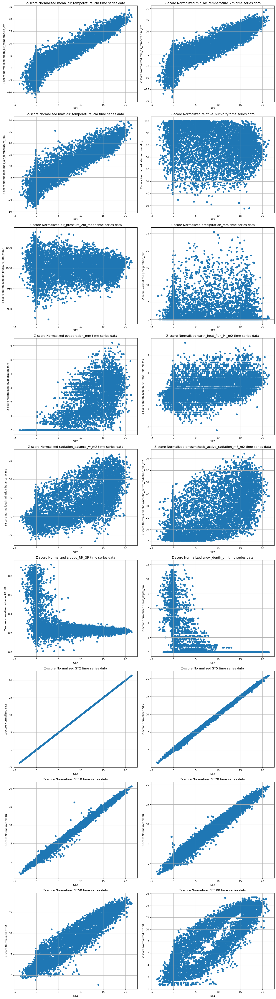

In [52]:
# Extract the features list from the dataset columns
ST2_features = ST2_clean_dataset_denormalized.columns.tolist()
# Temporary reomve the ID from the features list
ST2_features.remove('ID')
# remove the month feature from the features list
ST2_features.remove('month')
# reomve the day feature from the features list
ST2_features.remove('day')
# Call the custom built scatter plot for multiple features
scatter_plot(ST2_features, ST2_clean_dataset_denormalized, 'ST2')

### Outlier filtered denormalized dataset by Isolation Forest histogram distribution

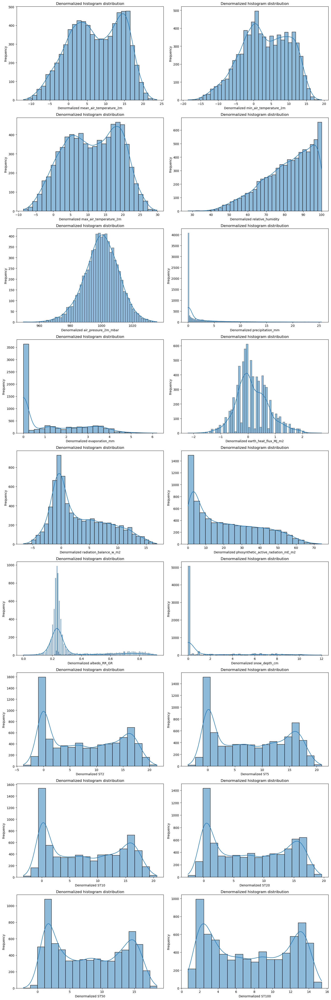

In [53]:
# Get the list of features from our dataset columns
ST2_features = ST2_clean_dataset_denormalized.columns.tolist()
# remove the month feature from the features list
ST2_features.remove('month')
# remove the day feature from the features list
ST2_features.remove('day')
# remove the ID from the features list
ST2_features.remove('ID')

# Plot histograms of Z-scores for all features
num_features = len(ST2_features)
num_cols = 2
num_rows = (num_features + num_cols - 1) // num_cols
plt.figure(figsize=(15, 5 * num_rows))
for i, feature in enumerate(ST2_features, start=1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(ST2_clean_dataset_denormalized[feature], kde=True)
    plt.title('Denormalized histogram distribution')
    plt.xlabel(f'Denormalized {feature}')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.savefig('images/isolation_forest_smoothed_histogram_of_parameters.png')
plt.show()

### Outlier filtered by Isolation Forest normalized dataset histogram distribution

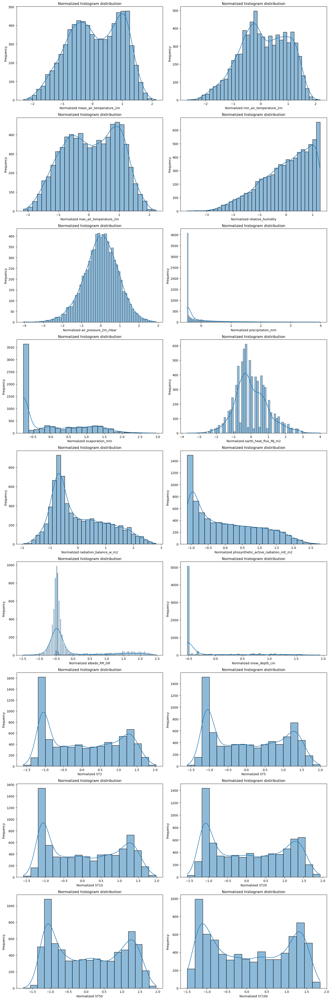

In [54]:
# Get the list of features from our dataset columns
ST2_features = ST2_clean_dataset_normalized.columns.tolist()
# remove the month feature from the features list
ST2_features.remove('month')
# remove the day feature from the features list
ST2_features.remove('day')
# remove the ID from the features list
ST2_features.remove('ID')

# Plot histograms of Z-scores for all features
num_features = len(ST2_features)
num_cols = 2
num_rows = (num_features + num_cols - 1) // num_cols
plt.figure(figsize=(15, 5 * num_rows))
for i, feature in enumerate(ST2_features, start=1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(ST2_clean_dataset_normalized[feature], kde=True)
    plt.title('Normalized histogram distribution')
    plt.xlabel(f'Normalized {feature}')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.savefig('images/isolation_forest_and_z_score_filtered_histogram_all_parameters.png')
plt.show()

In [55]:
ST2_clean_dataset_normalized

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8247,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8248,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8249,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8250,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


In [56]:
dataset_normalized_outlier_filtered

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8247,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8248,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8249,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8250,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


### Normalized Outlier filtered by Z-score thresholds histogram

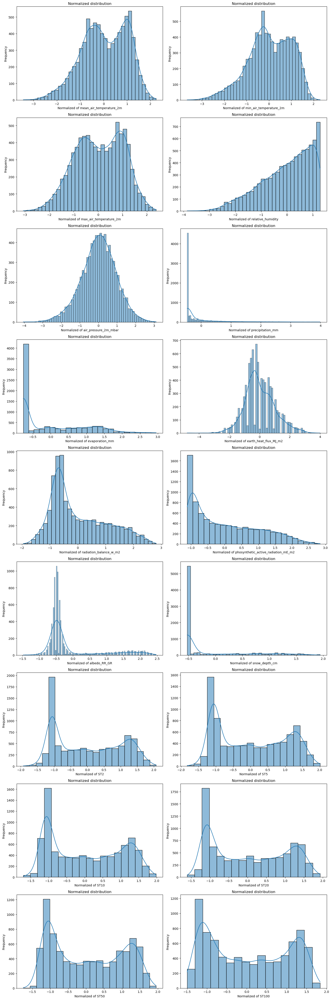

In [57]:
# Get the list of features from our dataset columns
features = dataset_normalized_outlier_filtered.columns.tolist()
# remove the month feature from the features list
features.remove('month')
# remove the day feature from the features list
features.remove('day')
# remove the ID from the features list
features.remove('ID')

# Plot histograms of Z-scores for all features
num_features = len(features)
num_cols = 2
num_rows = (num_features + num_cols - 1) // num_cols
plt.figure(figsize=(15, 5 * num_rows))
for i, feature in enumerate(features, start=1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(dataset_normalized_outlier_filtered[feature], kde=True)
    plt.title('Normalized distribution')
    plt.xlabel(f'Normalized of {feature}')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [58]:
dataset_copied

,ID,date,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,year,month,day
0,1,2000-01-01,-5.0,-7.6,-3.0,100.0,1001.5,2.635294,0.0,-0.3,...,4.666667,-0.2,-0.1,0.1,0.4,1.9,3.4,2000,1,1
1,2,2000-01-02,0.6,-5.0,4.0,88.6,997.7,2.334783,0.0,-0.2,...,6.444444,-0.1,-0.1,0.0,0.4,1.9,3.4,2000,1,2
2,3,2000-01-03,2.1,-1.1,4.6,88.6,991.5,8.800000,0.0,-0.1,...,6.500000,-0.1,-0.1,0.0,0.5,1.9,3.4,2000,1,3
3,4,2000-01-04,1.8,-3.3,4.4,67.3,987.0,2.100000,0.0,-0.1,...,6.437500,0.0,0.0,0.1,0.5,1.9,3.4,2000,1,4
4,5,2000-01-05,0.6,-3.6,4.4,98.2,993.3,1.200000,0.0,-0.2,...,8.187500,0.0,0.0,0.1,0.5,1.9,3.4,2000,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8848,8852,2024-03-28,5.2,2.4,7.9,90.0,976.7,7.600000,0.0,0.6,...,0.000000,1.6,1.3,1.0,0.9,1.2,2.0,2024,3,28
8849,8853,2024-03-29,5.9,4.7,7.4,93.6,978.3,2.600000,0.0,0.8,...,0.000000,2.9,2.6,2.1,1.7,1.5,2.1,2024,3,29
8850,8854,2024-03-30,5.9,4.0,7.4,94.4,990.1,2.000000,0.0,0.7,...,4.428571,3.5,3.3,2.8,2.5,1.9,2.2,2024,3,30
8851,8855,2024-03-31,6.2,2.4,8.0,93.6,988.1,2.900000,0.0,0.6,...,4.571429,4.2,4.1,3.6,3.1,2.4,2.3,2024,3,31


#### Redraw the scatter plot of the dataset filtered from outliers to see if the outliers are properly removed.

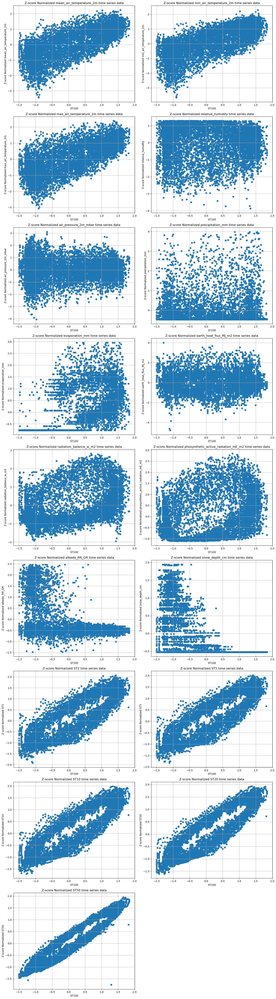

In [59]:
# Create the features list
features = dataset_normalized_outlier_filtered.columns.tolist()
# Remove the unncessary features day, month and ST100 from the plot
features.remove('day')
features.remove('month')
features.remove('ST100')
features.remove('ID')
# Call the scatter custom function created previously
scatter_plot(features, dataset_normalized_outlier_filtered, 'ST100')

### Now the data is filled for missing values and we have all numeric values, so we can start to design my model. We don't need any further data conversion as all my datatypes are numric but we don't need to have the time information in my final dataset so we should remove the date, year, month, day columns from my dataset.

In [60]:
dataset_normalized_outlier_filtered

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8247,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8248,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8249,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8250,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


In [61]:
dataset_normalized_outlier_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8252 entries, 0 to 8251
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   mean_air_temperature_2m              8252 non-null   float64
 1   min_air_temperature_2m               8252 non-null   float64
 2   max_air_temperature_2m               8252 non-null   float64
 3   relative_humidity                    8252 non-null   float64
 4   air_pressure_2m_mbar                 8252 non-null   float64
 5   precipitation_mm                     8252 non-null   float64
 6   evaporation_mm                       8252 non-null   float64
 7   earth_heat_flux_MJ_m2                8252 non-null   float64
 8   radiation_balance_w_m2               8252 non-null   float64
 9   phosynthetic_active_radiation_mE_m2  8252 non-null   float64
 10  albedo_RR_GR                         8252 non-null   float64
 11  snow_depth_cm                 

In [62]:
#### Let us check if our dataset is all numeric in addition to the info() method
for label, content in dataset_normalized_outlier_filtered.items():
    if not pd.api.types.is_numeric_dtype(content):
        print('Non-numeric column: ', label)

In [63]:
ST100_clean_dataset_normalized

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-1.426428,-1.265580,-1.516988,1.283979,0.134167,-0.005348,-0.768917,-0.706540,-0.634467,-1.058094,...,0.434843,-1.077009,-1.091238,-1.081004,-1.088684,-1.019184,-0.884845,-1.581592,-1.673516,1
1,-0.731807,-0.934231,-0.718961,0.493899,-0.173179,-0.057824,-0.768917,-0.549618,-1.058118,-1.034502,...,0.800315,-1.062649,-1.091238,-1.095956,-1.088684,-1.019184,-0.884845,-1.581592,-1.559902,2
2,-0.545748,-0.437208,-0.650559,0.493899,-0.674639,1.071144,-0.768917,-0.392696,-0.975009,-1.082210,...,0.811736,-1.062649,-1.091238,-1.095956,-1.072963,-1.019184,-0.884845,-1.581592,-1.446288,3
3,-0.582960,-0.717580,-0.673359,-0.982303,-1.038602,-0.098822,-0.768917,-0.392696,-1.589202,-0.988891,...,0.798887,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.332674,4
4,-0.731807,-0.755812,-0.673359,1.159230,-0.529054,-0.255982,-0.768917,-0.549618,-0.699332,-1.031356,...,1.158648,-1.048290,-1.076551,-1.081004,-1.072963,-1.019184,-0.884845,-1.581592,-1.219059,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8247,-0.161226,0.008839,-0.274346,0.590926,-1.871672,0.861598,-0.768917,0.705756,-0.518925,-0.420060,...,-0.524520,-0.818539,-0.885619,-0.946433,-1.010080,-1.144502,-1.202502,-1.004042,1.394069,8852
8248,-0.074398,0.301955,-0.331348,0.840425,-1.742263,-0.011511,-0.768917,1.019600,-0.551358,-0.638680,...,-0.524520,-0.631866,-0.694688,-0.781957,-0.884312,-1.090794,-1.179812,-1.004042,1.507683,8853
8249,-0.074398,0.212746,-0.331348,0.895870,-0.787872,-0.116284,-0.768917,0.862678,-0.486493,-0.630816,...,0.385896,-0.545709,-0.591879,-0.677290,-0.758545,-1.019184,-1.157123,-1.004042,1.621297,8854
8250,-0.037187,0.008839,-0.262945,0.840425,-0.949633,0.040875,-0.768917,0.705756,-0.606088,-0.695301,...,0.415264,-0.445193,-0.474382,-0.557671,-0.664219,-0.929672,-1.134433,-1.004042,1.734911,8855


# 2. Modelling and Prediction Stage
## 2.1. Shuffling and Spliting the dataset into Train, Validation and Test sets
### The soil temperature at 100cm is the target variable to be predicted
### Dataset Splitting For target ST100

In [64]:
# # Let us shuffle the entire dataset so that it is randomly arranged
# np.random.seed(42)
# dataset_shuffled = dataset_normalized_outlier_filtered.sample(frac=1)
# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_100cm ). Drop the ID as it is not a feature
# X = dataset_shuffled.drop(['ID','ST100'], axis=1)
# Y = dataset_shuffled["ST100"]
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST100_X_train, ST100_Y_train = X[:train_split], Y[:train_split]
# ST100_X_valid, ST100_Y_valid =X[train_split:valid_split], Y[train_split:valid_split]
# ST100_X_test, ST100_Y_test = X[valid_split:], Y[valid_split:]
# # Save the ST100_X_test data to csv for future use
# ST100_X_test.to_csv("data/ST100_X_test_data.csv", index=False)
# # # Split the feature and label datasets in to 80/20 training and test datasets respectively
# # ST100_X_train, ST100_X_test, ST100_Y_train, ST100_Y_test = train_test_split(X,Y, test_size=0.2)

### Dataset Splitting For target ST2

In [65]:
# Let us shuffle the entire dataset so that it is randomly arranged
np.random.seed(42)
dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_100cm ). Drop the ID as it is not a feature
X = dataset_shuffled.drop(['ID','ST2','ST5','ST10','ST20','ST50','ST100'], axis=1)
Y = dataset_shuffled["ST2"]
# Then split into train, validation and test sets
train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
valid_split = round(train_split + 0.15*len(dataset_shuffled))
ST100_X_train, ST100_Y_train = X[:train_split], Y[:train_split]
ST100_X_valid, ST100_Y_valid =X[train_split:valid_split], Y[train_split:valid_split]
ST100_X_test, ST100_Y_test = X[valid_split:], Y[valid_split:]
# Save the ST100_X_test data to csv for future use
ST100_X_test.to_csv("data/ST2_X_test_data.csv", index=False)
# # Split the feature and label datasets in to 80/20 training and test datasets respectively
# ST100_X_train, ST100_X_test, ST100_Y_train, ST100_Y_test = train_test_split(X,Y, test_size=0.2)

#### Let's build the evaluation metrics function

In [66]:
# Create evaluation metrics function that shows the metrics result of different metrics for a model
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, median_absolute_error, mean_absolute_percentage_error, max_error, explained_variance_score
def rmsle(Y_test, Y_preds):
    """
    Calculates the root mean squared log error between predictions and true labels
        
    Parameters:
        Y_test: A test dataset of the target label.
        Y_preds: The predicted values of the target label.
            
    Returns:
        float: the root mean squared log error of the model.
    """
    return np.sqrt(mean_squared_log_error(Y_test, Y_preds))

# Create function to evaluate model on few different levels
def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST', model_name='RF'):
    """
    Calculates and shows the different sklearn evaluation metrics
        
    Parameters:
        model: the model fitted.
        X_train: the input training set.
        X_valid: the input validation or test set.
        Y_train: the target training set.
        Y_valid: the target validation or test set.
            
    Returns:
        scores: the dictionary of the calculated sklearn metrics for train and valid sets.
    """
    
    train_preds = model.predict(X_train)
    val_preds = model.predict(X_valid)
    scores = {
              # "Training Set R^2 Score": r2_score(Y_train, train_preds),
              "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
              # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
              "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
              # "Training Set MSE": mean_squared_error(Y_train, train_preds),
              "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
              # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
              "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
              # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
              # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
              # "Training Set Max Error": max_error(Y_train, train_preds),
              "Validation Set Max Error": max_error(Y_valid, val_preds),
              # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
              "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
    # Convert the dictionary to a DataFrame
    df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
    # Export the DataFrame to an Excel file
    df.to_excel(f'data/{target}_{model_name}_scores.xlsx', index=False)
    return scores

In [67]:
dataset_denormalized_outlier_filtered

,mean_air_temperature_2m,min_air_temperature_2m,max_air_temperature_2m,relative_humidity,air_pressure_2m_mbar,precipitation_mm,evaporation_mm,earth_heat_flux_MJ_m2,radiation_balance_w_m2,phosynthetic_active_radiation_mE_m2,...,snow_depth_cm,ST2,ST5,ST10,ST20,ST50,ST100,month,day,ID
0,-5.0,-7.6,-3.0,100.0,1001.5,2.635294,0.0,-0.3,-0.12,1.17,...,4.666667,-2.000000e-01,-0.1,0.1,0.4,1.9,3.4,1.0,1.0,1
1,0.6,-5.0,4.0,88.6,997.7,2.334783,0.0,-0.2,-2.21,1.62,...,6.444444,-1.000000e-01,-0.1,0.0,0.4,1.9,3.4,1.0,2.0,2
2,2.1,-1.1,4.6,88.6,991.5,8.800000,0.0,-0.1,-1.80,0.71,...,6.500000,-1.000000e-01,-0.1,0.0,0.5,1.9,3.4,1.0,3.0,3
3,1.8,-3.3,4.4,67.3,987.0,2.100000,0.0,-0.1,-4.83,2.49,...,6.437500,-8.881784e-16,0.0,0.1,0.5,1.9,3.4,1.0,4.0,4
4,0.6,-3.6,4.4,98.2,993.3,1.200000,0.0,-0.2,-0.44,1.68,...,8.187500,-8.881784e-16,0.0,0.1,0.5,1.9,3.4,1.0,5.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8247,5.2,2.4,7.9,90.0,976.7,7.600000,0.0,0.6,0.45,13.34,...,0.000000,1.600000e+00,1.3,1.0,0.9,1.2,2.0,3.0,28.0,8852
8248,5.9,4.7,7.4,93.6,978.3,2.600000,0.0,0.8,0.29,9.17,...,0.000000,2.900000e+00,2.6,2.1,1.7,1.5,2.1,3.0,29.0,8853
8249,5.9,4.0,7.4,94.4,990.1,2.000000,0.0,0.7,0.61,9.32,...,4.428571,3.500000e+00,3.3,2.8,2.5,1.9,2.2,3.0,30.0,8854
8250,6.2,2.4,8.0,93.6,988.1,2.900000,0.0,0.6,0.02,8.09,...,4.571429,4.200000e+00,4.1,3.6,3.1,2.4,2.3,3.0,31.0,8855


## 2.2. Fitting the models

### i. RandomForestRegressor Model data.

In [68]:
%%time
# Let's try another model which is ensemble RandomForestRegressor
# Import the model
from sklearn.ensemble import RandomForestRegressor
# Create rando forest model
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)

# Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_rf_model = rf_model
ST50_rf_model = rf_model
ST20_rf_model = rf_model
ST10_rf_model = rf_model
ST5_rf_model = rf_model
ST2_rf_model = rf_model
# 
ST100_rf_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
# Access the OOB Score
oob_score = ST100_rf_model.oob_score_
print('Out of Bag Score: ', oob_score)
show_scores(ST100_rf_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'RF')

The Evaluation Metrics Results:
Out of Bag Score:  0.9788103502908164
CPU times: total: 8.45 s
Wall time: 1.84 s


{'Validation Set R^2 Score': 0.9817571783787368,
 'Validation Set MAE': 0.6743737480604317,
 'Validation Set MSE': 0.8888694470633737,
 'Validation Set Median Absolute Error': 0.4848913043478268,
 'Validation Set Max Error': 6.357000000000005,
 'Validation Set Explained Variance Score': 0.981770293357927}

### ii. HistGradientBoostingRegressor Model data.

In [69]:
from sklearn.ensemble import HistGradientBoostingRegressor
# Create rando forest model
gbr_model = HistGradientBoostingRegressor(random_state=42)

# Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_gbr_model = gbr_model
ST50_gbr_model = gbr_model
ST20_gbr_model = gbr_model
ST10_gbr_model = gbr_model
ST5_gbr_model = gbr_model
ST2_gbr_model = gbr_model
# 
ST100_gbr_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
# Show scores
show_scores(ST100_gbr_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'HGB')

The Evaluation Metrics Results:


{'Validation Set R^2 Score': 0.9811760996267952,
 'Validation Set MAE': 0.7094552812864989,
 'Validation Set MSE': 0.9171821258617313,
 'Validation Set Median Absolute Error': 0.5323342243998308,
 'Validation Set Max Error': 5.2540606877963825,
 'Validation Set Explained Variance Score': 0.9811986746212222}

### iii. Ridge Model

In [70]:
%%time
# Import the model
from sklearn.linear_model import Ridge
# Setup random seed
np.random.seed(42)
# Instantiate and fit the model (on training set)
rg_model = Ridge()
# Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_rg_model = rg_model
ST50_rg_model = rg_model
ST20_rg_model = rg_model
ST10_rg_model = rg_model
ST5_rg_model = rg_model
ST2_rg_model = rg_model
# Fit the ST100 model for soil temp at 100 cm
ST100_rg_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_rg_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'RR')

The Evaluation Metrics Results:
CPU times: total: 141 ms
Wall time: 29 ms


{'Validation Set R^2 Score': 0.91491841272035,
 'Validation Set MAE': 1.590666536480398,
 'Validation Set MSE': 4.14554420421394,
 'Validation Set Median Absolute Error': 1.3016163369953953,
 'Validation Set Max Error': 7.726316775551821,
 'Validation Set Explained Variance Score': 0.9150161859569269}

### iv. Lasso Model

In [71]:
%%time
# Let's check the Lasso model
# Import the model
from sklearn.linear_model import Lasso
# Set up a radom seed
np.random.seed(42)
# Create rando forest model
la_model = Lasso()
# Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_la_model = la_model
ST50_la_model = la_model
ST20_la_model = la_model
ST10_la_model = la_model
ST5_la_model = la_model
ST2_la_model = la_model

# Fit the ST100 model for soil temp at 100cm
ST100_la_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_la_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'LA')

The Evaluation Metrics Results:
CPU times: total: 375 ms
Wall time: 98.5 ms


{'Validation Set R^2 Score': 0.8858098809295423,
 'Validation Set MAE': 1.886100216118524,
 'Validation Set MSE': 5.563838210200618,
 'Validation Set Median Absolute Error': 1.653128488136741,
 'Validation Set Max Error': 8.471460301192936,
 'Validation Set Explained Variance Score': 0.8861721251598685}

### v. ElasticNet Model

In [72]:
%%time
# Let's check the ElasticNet model
# Import the model
from sklearn.linear_model import ElasticNet
# Set up a radom seed
np.random.seed(42)
# Create rando forest model
en_model = ElasticNet()
# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_en_model = en_model
ST50_en_model = en_model
ST20_en_model = en_model
ST10_en_model = en_model
ST5_en_model = en_model
ST2_en_model = en_model

# Fit the ST100 model for soil temp at 100cm
ST100_en_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_en_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'EN')

The Evaluation Metrics Results:
CPU times: total: 312 ms
Wall time: 85.5 ms


{'Validation Set R^2 Score': 0.8964347290948218,
 'Validation Set MAE': 1.7831914118881225,
 'Validation Set MSE': 5.046149493516765,
 'Validation Set Median Absolute Error': 1.5552065882135087,
 'Validation Set Max Error': 8.338860990062093,
 'Validation Set Explained Variance Score': 0.8967467870667083}

### vi. SVR with kernel 'linear' model

In [73]:
%%time
# Let's check the SVR with kernel linear model
# Import the model
from sklearn.svm import SVR
# Set up a radom seed
np.random.seed(42)
# Create rando forest model
svrl_model = SVR(kernel='linear')

# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_svrl_model = svrl_model
ST50_svrl_model = svrl_model
ST20_svrl_model = svrl_model
ST10_svrl_model = svrl_model
ST5_svrl_model = svrl_model
ST2_svrl_model = svrl_model

# Fit the ST100 model for soil temp at 100cm
ST100_svrl_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_svrl_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'SVR_L')

The Evaluation Metrics Results:
CPU times: total: 15.2 s
Wall time: 26.7 s


{'Validation Set R^2 Score': 0.9144243001032004,
 'Validation Set MAE': 1.5704391126322932,
 'Validation Set MSE': 4.169619515473954,
 'Validation Set Median Absolute Error': 1.2654933032918851,
 'Validation Set Max Error': 8.649917038750289,
 'Validation Set Explained Variance Score': 0.9144492682171095}

### vii. SVR with kernel 'rbf' model

In [74]:
%%time
# Let's check the SVR with kernel 'rbf' model
# Import the model
from sklearn.svm import SVR
# Set up a radom seed
np.random.seed(42)
# Create rando forest model
svrr_model = SVR(kernel='rbf')

# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_svrr_model = svrr_model
ST50_svrr_model = svrr_model
ST20_svrr_model = svrr_model
ST10_svrr_model = svrr_model
ST5_svrr_model = svrr_model
ST2_svrr_model = svrr_model

# Fit the ST100 model for soil temp at 100cm
ST100_svrr_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_svrr_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'SVR_R')

The Evaluation Metrics Results:
CPU times: total: 4.36 s
Wall time: 6.14 s


{'Validation Set R^2 Score': 0.596687840042269,
 'Validation Set MAE': 3.869777638008558,
 'Validation Set MSE': 19.651118892579447,
 'Validation Set Median Absolute Error': 3.7416437905387494,
 'Validation Set Max Error': 10.230030969656728,
 'Validation Set Explained Variance Score': 0.6078247303195156}

### viii. AdaBoostRegressor 'adaBr' model

In [75]:
%%time
# Let's check the SVR with kernel 'rbf' model
# Import the model
from sklearn.ensemble import AdaBoostRegressor
# Set up a radom seed
np.random.seed(42)

# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_adaBr_model = AdaBoostRegressor(random_state=42)
ST50_adaBr_model = AdaBoostRegressor(random_state=42)
ST20_adaBr_model = AdaBoostRegressor(random_state=42)
ST10_adaBr_model = AdaBoostRegressor(random_state=42)
ST5_adaBr_model = AdaBoostRegressor(random_state=42)
ST2_adaBr_model = AdaBoostRegressor(random_state=42)

# Fit the ST100 model for soil temp at 100cm
ST100_adaBr_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_adaBr_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'ADB')

The Evaluation Metrics Results:
CPU times: total: 406 ms
Wall time: 580 ms


{'Validation Set R^2 Score': 0.9526245795717407,
 'Validation Set MAE': 1.2006456258764424,
 'Validation Set MSE': 2.3083361025346494,
 'Validation Set Median Absolute Error': 1.0303136145604057,
 'Validation Set Max Error': 6.107733955519698,
 'Validation Set Explained Variance Score': 0.9527989212641333}

### iX. XGBoostRegressor 'XGBoost' model

In [76]:
%%time
# Let's check the SVR with kernel 'rbf' model
# Import the model
from xgboost import XGBRegressor
# Set up a radom seed
np.random.seed(42)

# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_XGB_model = XGBRegressor(objective='reg:squarederror',random_state=42)
ST50_XGB_model = XGBRegressor(objective='reg:squarederror',random_state=42)
ST20_XGB_model = XGBRegressor(objective='reg:squarederror',random_state=42)
ST10_XGB_model = XGBRegressor(objective='reg:squarederror',random_state=42)
ST5_XGB_model = XGBRegressor(objective='reg:squarederror',random_state=42)
ST2_XGB_model = XGBRegressor(objective='reg:squarederror',random_state=42)

# Fit the ST100 model for soil temp at 100cm
ST100_XGB_model.fit(ST100_X_train, ST100_Y_train)

# Show the scoring metrics for this model
print("The Evaluation Metrics Results:")
show_scores(ST100_XGB_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'XGB')

The Evaluation Metrics Results:
CPU times: total: 812 ms
Wall time: 1.01 s


{'Validation Set R^2 Score': 0.9814653438358713,
 'Validation Set MAE': 0.6976201768672766,
 'Validation Set MSE': 0.903088892614959,
 'Validation Set Median Absolute Error': 0.5433359146118155,
 'Validation Set Max Error': 7.6052271842956545,
 'Validation Set Explained Variance Score': 0.9814772754439648}

### X. CatBoostRegressor 'CatBoost' model

In [77]:
%%time
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error

# Initialize CatBoost Regressor
ST100_CB_model = CatBoostRegressor(
    iterations=1000,
    learning_rate=0.1,
    depth=6,
    loss_function='RMSE',
    verbose=100
)

# Fit the model
ST100_CB_model.fit(ST100_X_train, ST100_Y_train, eval_set=(ST100_X_valid, ST100_Y_valid), early_stopping_rounds=100)

# Make predictions
ST100_P_pred = ST100_CB_model.predict(ST100_X_test)
# Evaluate the model
show_scores(ST100_CB_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'CB')
# cat_mse = mean_squared_error(ST100_Y_test, ST100_P_pred)
# cat_mae = mean_absolute_error(ST100_Y_test, ST100_P_pred)
# print(f'Mean Squared Error: {cat_mse}')
# print(f'Mean Squared Error: {cat_mae}')

0:	learn: 6.2710513	test: 6.3521365	best: 6.3521365 (0)	total: 138ms	remaining: 2m 17s
100:	learn: 0.9772351	test: 1.0254439	best: 1.0254439 (100)	total: 394ms	remaining: 3.51s
200:	learn: 0.8265002	test: 0.9478612	best: 0.9478612 (200)	total: 682ms	remaining: 2.71s
300:	learn: 0.7354540	test: 0.9161847	best: 0.9161847 (300)	total: 972ms	remaining: 2.26s
400:	learn: 0.6676124	test: 0.8996761	best: 0.8996761 (400)	total: 1.26s	remaining: 1.89s
500:	learn: 0.6159013	test: 0.8892634	best: 0.8892634 (500)	total: 1.56s	remaining: 1.56s
600:	learn: 0.5716458	test: 0.8818440	best: 0.8818440 (600)	total: 1.85s	remaining: 1.23s
700:	learn: 0.5338588	test: 0.8772785	best: 0.8770815 (690)	total: 2.14s	remaining: 914ms
800:	learn: 0.4993752	test: 0.8731484	best: 0.8730446 (799)	total: 2.43s	remaining: 603ms
900:	learn: 0.4707041	test: 0.8682125	best: 0.8681838 (898)	total: 2.77s	remaining: 304ms
999:	learn: 0.4450593	test: 0.8673250	best: 0.8665969 (941)	total: 3.06s	remaining: 0us

bestTest = 0.8

{'Validation Set R^2 Score': 0.9845869599773306,
 'Validation Set MAE': 0.6516445929547475,
 'Validation Set MSE': 0.7509902057337052,
 'Validation Set Median Absolute Error': 0.502095126914881,
 'Validation Set Max Error': 5.286892578669686,
 'Validation Set Explained Variance Score': 0.9845958358949388}

### X. Neural Network model

In [78]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.optimizers import Adam
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler

# # Standardize the data
# scaler = StandardScaler()
# ST100_X_train = scaler.fit_transform(ST100_X_train)
# ST100_X_valid = scaler.transform(ST100_X_valid)

# # Define the neural network nn_model
# nn_model = Sequential()
# nn_model.add(Dense(64, input_dim=ST100_X_train.shape[1], activation='relu'))
# nn_model.add(Dense(32, activation='relu'))
# nn_model.add(Dense(1, activation='linear'))  # For regression

# # Compile the nn_model
# nn_model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])

# # Train the nn_model
# history = nn_model.fit(ST100_X_train, ST100_Y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# # Evaluate the nn_model
# mse, mae = nn_model.evaluate(ST100_X_valid, ST100_Y_valid, verbose=0)
# print(f"Mean Squared Error: {mse}")
# print(f"Mean Absolute Error: {mae}")

# # Make predictions
# Y_preds = nn_model.predict(ST100_X_test)
# show_scores(nn_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST2', 'NN')


Epoch 1/100


C:\MY FILES\SSIs\Master Thesis\BigAgriDataNotebookProject\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


145/145 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 52.2716 - mae: 5.2892 - val_loss: 3.3524 - val_mae: 1.3905
Epoch 2/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8018 - mae: 1.2723 - val_loss: 2.2245 - val_mae: 1.1218
Epoch 3/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1843 - mae: 1.1134 - val_loss: 2.0332 - val_mae: 1.0640
Epoch 4/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0024 - mae: 1.0680 - val_loss: 1.8985 - val_mae: 1.0281
Epoch 5/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9391 - mae: 1.0451 - val_loss: 1.8845 - val_mae: 1.0243
Epoch 6/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8651 - mae: 1.0297 - val_loss: 1.7339 - val_mae: 0.9879
Epoch 7/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8001 - mae: 1.0036 - val_loss: 1.6700 - val_mae: 0.9703
Epoch 8/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.7030 - mae: 0.9777 - val_loss: 1.7869 - val_mae: 1.0055
Epoch 9/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss

{'Validation Set R^2 Score': 0.9807448107453862,
 'Validation Set MAE': 0.7405693733158549,
 'Validation Set MSE': 0.938196392048261,
 'Validation Set Median Absolute Error': 0.5880277395248408,
 'Validation Set Max Error': 4.756159400939941,
 'Validation Set Explained Variance Score': 0.9817884696653602}

## 2.3. Hyperparameter Tuning with RandomizedSearchCV
### NB: This may take time. Turn it on when you need to run it.
#### To train a random forest, we need to specify the number of decision trees to use (the n_estimators parameter) and the maximum depth of each tree (the max_depth parameter). Other hyperparameters, such as the minimum number of samples required to split a node and the minimum number of samples required at a leaf node, can also be specified.

In [79]:
# %%time
# # Define the parameter grid to search
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': np.arange(2,20,2),
#     'min_samples_leaf': np.arange(1, 20, 2),
#     'max_features': [0.5, 1, 'sqrt', 'log2', None]
# }

# # Instantiate the model with the RandomizeSearchCV
# rsv_model = RandomizedSearchCV(RandomForestRegressor(n_jobs=-1, random_state=42), 
#                                  param_distributions=param_grid, n_iter=20,
#                                  cv=5, verbose=0)

# # Fit the RandomizedSearchCV model to the train data
# rsv_model.fit(ST100_X_train, ST100_Y_train)
# Find the best model paramters from the fitted model
# rsv_model.best_params_
# Evaluate the RandomizedSearch model
# show_scores(rsv_model)


## 2.4. Hyperparameter tuning using GridSearchCV
### NB: Run it when required. This may take time so be patient

In [80]:
# %%time
# # # Define the parameter grid to search
# # param_grid = {
# #     'n_estimators': [100, 200, 300],
# #     'max_depth': [None, 10, 20],
# #     'min_samples_split': [2, 5, 10],
# #     'min_samples_leaf': [1, 2, 4],
# #     'max_features': [1, 'sqrt', 'log2'],
# #     'bootstrap': [True, False]
# # }

# # # Perform Grid Search with cross-validation
# # gsc_model = GridSearchCV(RandomForestRegressor(n_jobs=-1, random_state=42), param_grid=param_grid, 
# #                            cv=5, n_jobs=-1, verbose=2)

# # # Fit the Grid Search to the data
# # gsc_model.fit(ST100_X_train, ST100_Y_train)

# # # Get the best parameters and best score
# # best_params = gsc_model.best_params_
# # best_score = gsc_model.best_score_

# # print("Best Parameters:", best_params)
# # print("Best Score:", best_score)
# %%time
# from sklearn.model_selection import GridSearchCV
# from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor, AdaBoostRegressor
# from xgboost import XGBRegressor
# from sklearn.metrics import mean_squared_error


# # Define parameter grids for each model
# param_grid_rf = {
#     'n_estimators': [100, 300],
#     'max_depth': [None, 20],
#     'min_samples_split': [2, 10],
#     'min_samples_leaf': [1, 2],
#     'max_features': [1, 'sqrt'],
#     'bootstrap': [True, False]
# }

# param_grid_hgb = {
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_iter': [100, 200, 300],
#     'max_leaf_nodes': [31, 41, 51]
# }

# param_grid_ada = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.01, 0.1, 1]
# }

# param_grid_xgb = {
#     'n_estimators': [50, 100, 200],
#     'max_depth': [3, 6, 9],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'subsample': [0.7, 0.8, 0.9]
# }

# # Initialize models
# rf = RandomForestRegressor(random_state=42)
# hgb = HistGradientBoostingRegressor(random_state=42)
# ada = AdaBoostRegressor(random_state=42)
# xgb = XGBRegressor(random_state=42, objective='reg:squarederror')

# # Initialize GridSearchCV for each model
# grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=5, n_jobs=-1, scoring='neg_mean_absolute_error')
# grid_search_hgb = GridSearchCV(estimator=hgb, param_grid=param_grid_hgb, cv=5, n_jobs=-1, scoring='neg_mean_absolute_error')
# grid_search_ada = GridSearchCV(estimator=ada, param_grid=param_grid_ada, cv=5, n_jobs=-1, scoring='neg_mean_absolute_error')
# grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, cv=5, n_jobs=-1, scoring='neg_mean_absolute_error')

# # Fit the models
# grid_search_rf.fit(ST100_X_train, ST100_Y_train)
# grid_search_hgb.fit(ST100_X_train, ST100_Y_train)
# grid_search_ada.fit(ST100_X_train, ST100_Y_train)
# grid_search_xgb.fit(ST100_X_train, ST100_Y_train)

# # Get the best parameters and scores
# print("Best parameters for RandomForestRegressor:", grid_search_rf.best_params_)
# print("Best score for RandomForestRegressor:", -grid_search_rf.best_score_)

# print("Best parameters for HistGradientBoostingRegressor:", grid_search_hgb.best_params_)
# print("Best score for HistGradientBoostingRegressor:", -grid_search_hgb.best_score_)

# print("Best parameters for AdaBoostRegressor:", grid_search_ada.best_params_)
# print("Best score for AdaBoostRegressor:", -grid_search_ada.best_score_)


# print("Best parameters for XGBRegressor:", grid_search_xgb.best_params_)
# print("Best score for XGBRegressor:", -grid_search_xgb.best_score_)


### Let's now train our model with the best hyperparameters estimated with the help of GridSearchCV

In [81]:
%%time
# The most ideal hyperparameters are
ST100_ideal_rf_model = RandomForestRegressor(
                                       n_estimators=300, 
                                       min_samples_leaf=1,
                                       min_samples_split=2,
                                       max_features='sqrt',
                                       max_depth=None,
                                       bootstrap=False,
                                       random_state=42)
# Fit the ideal model
ST100_ideal_rf_model.fit(ST100_X_train, ST100_Y_train)
# Show the scores of the trained ideal RF model
show_scores(ST100_ideal_rf_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid)

CPU times: total: 3.92 s
Wall time: 6.05 s


{'Validation Set R^2 Score': 0.9815932167355793,
 'Validation Set MAE': 0.6878748050676041,
 'Validation Set MSE': 0.8968583699459565,
 'Validation Set Median Absolute Error': 0.5122753623188322,
 'Validation Set Max Error': 6.287999999999992,
 'Validation Set Explained Variance Score': 0.981604889561848}

In [82]:
# Show the scores from the default RF model
show_scores(ST100_rf_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid)

C:\MY FILES\SSIs\Master Thesis\BigAgriDataNotebookProject\env\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\MY FILES\SSIs\Master Thesis\BigAgriDataNotebookProject\env\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


{'Validation Set R^2 Score': -0.3937151347124874,
 'Validation Set MAE': 6.501114459948576,
 'Validation Set MSE': 67.90785037945017,
 'Validation Set Median Absolute Error': 6.7017500000000005,
 'Validation Set Max Error': 19.316,
 'Validation Set Explained Variance Score': 0.44519626288013703}

## 2.5. Evaluating the model with cross-validation
#### The cross validation score will evaluate the model by taking K-number of folds or splits for the entire dataset. Let's take K = CV = 10 for this test as the dataset is not big enough. This helps us avoid lucky splits in case we consider only one random split pattern.
#### NB: This may take time be patient


In [83]:
%%time
np.random.seed(42)
cross_val_score_r2 = cross_val_score(ST100_ideal_rf_model, X, Y, cv=10)
cross_val_score_r2


KeyboardInterrupt



## 2.6. Predictions on the test set (ST2_X_test, ST2_Y_test)

In [84]:
# Read the test data from file
test_data = pd.read_csv("data/ST2_X_test_data.csv")
ST100_Y_preds = ST100_ideal_rf_model.predict(test_data)

C:\MY FILES\SSIs\Master Thesis\BigAgriDataNotebookProject\env\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(

KeyboardInterrupt



In [ ]:
ST100_Y_preds

In [ ]:
test_data

## Reverse the z-score normalized predicted values into unnormalized predicted original values
#### Step 1: Calculate the mean and standard deviation of each feature from the original dataset
#### Step 2: Reverse normalization for each feature in the predicted dataset
### Let's implement a generic function that reverses the z-score normalized data to unnormalized original data

In [ ]:
# Define the reverse normalization function
def reverse_normalization(original_dataset, feature, test_set_series, model_name=None):
    """
    Reverses the normalized pandas series(target variable) to its corresponding unnormalized pandas series (target variable).
    It may reverse pandas series with predictions or simple denormalization of a pandas series depending on the model_name passed.
    
    parameters:
        original_dataset: the original unnormalized dataset 
        feature: the name of the column to be reversed
        model_name (optional): the name of the model to be used for prediction
        test_set_series: the test data to be used for predicting the target
    returns:
        unnormalized_predicted_series: the unnormalized pandas series of the target variable
    """
    # Exract the target variable from the original dataset
    original_series = original_dataset[feature]
    # Calculate the mean dand std of the original target variable
    mean = original_series.mean()
    std = original_series.std()
    if model_name != None:    
        # Predict the target from the test data using the ideal model generated
        normalized_predicted = model_name.predict(test_set_series)
        # Convert normalized_predicted_data to a pandas series
        normalized_predicted_series = pd.Series(normalized_predicted)
        # Update the test_set_series if the model exists otherwise normalize the unpredicted original series
        test_set_series = normalized_predicted_series
    # Calculate the unnormalized predicted series from the normalized predicted series using the mean an std
    unnormalized_predicted_series = (test_set_series * std) + mean
    return unnormalized_predicted_series

### Generate the unnormalized target values from the predicted values

In [ ]:
# Intantiate the reverse normalization function
ST100_predicted_data = reverse_normalization(dataset_copied, 'ST100', ST100_X_test, ST100_ideal_rf_model)
ST100_predicted_data

### Sklearn Evaluation Functions
#### Some of the common evaluations functions are:
##### 1. r2_score
##### 2. mean_absolute_error
##### 3. mean_squared_error
##### 4. mean_absolute_percentage_error
##### 5. median_absolute_error
##### 6. max_error
##### 7. explained_variance_score
##### 8. OOB (out-of-bag) score is a performance metric for a machine learning model, specifically for ensemble models such as random forests. It is calculated using the samples that are not used in the training of the model, which is called out-of-bag samples. These samples are used to provide an unbiased estimate of the model’s performance, which is known as the OOB score.
##### 9. The validation score, on the other hand, is the performance of the model on a validation dataset. This dataset is different from the training dataset and is used to evaluate the model’s performance after it has been trained on the training dataset.
### Let's calculate the different metrics using the sklearn functions

In [ ]:
# Import the evaluation functions sklearn metrics module
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, median_absolute_error, max_error, explained_variance_score

np.random.seed(42)
# The soil temperature at 100cm (ST100) normalized predicted data 
ST100_normalized_predicted = ST100_ideal_rf_model.predict(ST100_X_test)

# To calculate the mean and std of the original dataset but filtered for outliers, we need to filter out the rows without outliers using their IDs
# # Merge the two dataframes on the 'ID' column
# merged_data = pd.merge(dataset_copied, dataset_normalized_outlier_filtered['ID'], on='ID', how='inner')
# # Create a new dataframe containing only the rows from dataset_copied with 'ID' values found in dataset_normalized_outlier_filtered
# data_unnormalized_outlier_filtered = dataset_copied[dataset_copied['ID'].isin(merged_data['ID'])]

# The soil temperature at 1000 cm (ST100) unnormalized predicted data
ST100_unnormalized_predicted= reverse_normalization(dataset_copied, 'ST100', ST100_X_test, ST100_ideal_rf_model)
# The soil temperature at 1000 cm (ST100) unnormalized original data
ST100_unnormalized_original = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test)

# Evaluation of the normalized target values 
r2 = r2_score(ST100_Y_test, ST100_normalized_predicted)
# OOB_rf_score = ST100_ideal_rf_model.oob_score_
mean_abs_err = mean_absolute_error(ST100_Y_test, ST100_normalized_predicted) # Mean absolute error
mean_sqr_err =mean_squared_error(ST100_Y_test, ST100_normalized_predicted) # Mean Square error
mean_abs_per_err = mean_absolute_percentage_error(ST100_Y_test, ST100_normalized_predicted) # Mean absolute percentage error
median_abs_err = median_absolute_error(ST100_Y_test, ST100_normalized_predicted)
max_err = max_error(ST100_Y_test, ST100_normalized_predicted)
var_exp_err = explained_variance_score(ST100_Y_test, ST100_normalized_predicted)
# Evaluation of the unnormalized target values 
r2_unorm = r2_score(ST100_unnormalized_original, ST100_unnormalized_predicted)
mean_abs_err_unorm = mean_absolute_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
mean_sqr_err_unorm = mean_squared_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
mean_abs_per_err_unorm = mean_absolute_percentage_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
median_abs_err_unorm = median_absolute_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
max_err_unorm = max_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
var_exp_err_unorm = explained_variance_score(ST100_unnormalized_original, ST100_unnormalized_predicted)

print("R^2 Score: Normalized: ", r2, "Denormalized: ", r2_unorm)
# print("Out-of-Bag Score: ", OOB_rf_score)
print("mean_absolute_error: Normalized: ",mean_abs_err, "Denormalized: ", mean_abs_err_unorm)
print("mean_squared_error: Normalized: ",mean_sqr_err, "Denormalized: ",mean_sqr_err_unorm)
print("mean_absolute_percentage_error: Normalized: ",mean_abs_per_err, "Denormalized: ",mean_abs_per_err_unorm)
print("median_abs_err: Normalized: ",median_abs_err, "Denormalized: ",median_abs_err_unorm)
print("max_err: Normalized: ",max_err, "Denormalized: ",max_err_unorm)
print("var_exp_err: Normalized: ",var_exp_err, "Denormalized: ",var_exp_err_unorm)

#### Check the columns of the training and test datasets for matching

In [ ]:
# Check if the columns of the trained dataset and test data match. If they don't match then the prediction won't work.
set(ST100_X_train.columns) - set(ST100_X_test.columns)
# If there is a difference in the columns, you need to manually adjust the missing columns

## 2.8. Feature Importance Analysis

In [ ]:
# Which features were most importance when predicting the target variable ST100 ( soil temperature at 100cm)
rf_model.feature_importances_

In [ ]:
# Let's make a function for plotting feature importance
def plot_features(columns, importances, file, title, n=20):
    df = (pd.DataFrame({"features": columns,
                        "feature_importances": importances})
          .sort_values("feature_importances", ascending=False)
          .reset_index(drop=True))
    # Plot the dataframe
    fig, ax = plt.subplots()
    bars = ax.barh(df['features'][:n], df['feature_importances'][:n])
    ax.set_title(f"{title}")
    ax.set_ylabel('Features')
    ax.set_xlabel('Feature Importance')
    ax.invert_yaxis()

    # Add annotations on top of the bars
    for bar, importance in zip(bars, df['feature_importances'][:n]):
        ax.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{importance*100:.5f}', 
                va='center', ha='left', fontsize=8, color='black')
    # Save the figure to a file (e.g., PNG, PDF, etc.)
    # Save the figure
    plt.tight_layout()
    plt.savefig(file)  # Save as PNG format
plot_features(ST100_X_train.columns, rf_model.feature_importances_, 'images/ST100_feature_analysis.png', 'ST100 Feature Importances Plot')

#### NOTE:The feature importance analysis for our best model shows that the soil temperature at 100cm can be predicted from the dataset of the month (9% importance) and the soil temperature at 50cm (90% feature importance) which enables us to predict the target value almost 99% from these values.

## 2.9. Backward Attribute Selection

#### To check if the important features from our dataset (month, ST50 and ST100) can be used to train our model, we need to do the same process we have done before with only these two features considered.

In [ ]:
# Generate the dataset of the two important columns and the target variable
# Initialize the random seed
np.random.seed(42)
selected_columns = ['month', 'ST50', 'ST100']
ST100_dataset_important_features = dataset_normalized_outlier_filtered[selected_columns]
# Split the dataset into train and validation set
# Let us shuffle the entire dataset so that it is randomly arranged
ST100_dataset_shuffled = ST100_dataset_important_features.sample(frac=1)
# Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_100cm )
ST100_X = ST100_dataset_shuffled.drop("ST100", axis=1)
ST100_Y = ST100_dataset_shuffled["ST100"]
# Then split into train, validation and test sets
train_split = round(0.7*len(ST100_dataset_shuffled)) # 70% for train set
valid_split = round(train_split + 0.15*len(ST100_dataset_shuffled))
ST100_X_train_3, ST100_Y_train_3 = ST100_X[:train_split], ST100_Y[:train_split]
ST100_X_valid_3, ST100_Y_valid_3 =ST100_X[train_split:valid_split], ST100_Y[train_split:valid_split]
ST100_X_test_3, ST100_Y_test_3 = ST100_X[valid_split:], ST100_Y[valid_split:]
# Save the ST100_X_test data to csv for future use
ST100_X_test_3.to_csv("data/optimized_test_data.csv", index=False)
print("ST100 Dataset with Important Features: \n")
ST100_dataset_important_features

In [ ]:
# Fit the RF regressor model
ST100_ideal_rf_model.fit(ST100_X_train_3, ST100_Y_train_3);

In [ ]:
# Show the scores
show_scores(ST100_ideal_rf_model, ST100_X_train_3, ST100_X_valid_3, ST100_Y_train_3, ST100_Y_valid_3)

In [ ]:
# Predict the target ST100 values from the test set
ST100_Y_test_preds = ST100_ideal_rf_model.predict(ST100_X_test_3)
ST100_Y_test_preds

## 2.9. Visualization of original and predicted ST100 values (Blue + Red = Purple)

In [ ]:
# Compare and Plot the predicted (ST100_Y_preds) and true (J100_ST100_Y_test) traget values
ST100_r2_score = r2_score(ST100_Y_test_3, ST100_Y_test_preds)
ST100_mae = mean_absolute_error( ST100_Y_test_3, ST100_Y_test_preds)
ST100_mse = mean_squared_error( ST100_Y_test_3, ST100_Y_test_preds)
# Convert numpy array to pandas Series 
ST100_Y_test_preds_series = pd.Series( ST100_Y_test_preds)
ST100_normalized_df = pd.DataFrame({'Normalized True Values': ST100_Y_test_3, 'Normalized Predicted Values': ST100_Y_test_preds_series})

# Create the denormalized ST100 dataframe by using the denormalized outlier filtered original dataset
ST100_denormalized_df = pd.DataFrame({'Original True Values': reverse_normalization(dataset_copied, 'ST100', ST100_Y_test_3), 'Original Predicted Values': reverse_normalization(dataset_copied, 'ST100', ST100_Y_test_preds_series)})
# Create a figure with two subplots in one row and two columns
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Scatter plot for true values
sns.scatterplot(data=ST100_normalized_df, x='Normalized True Values', y='Normalized Predicted Values', color='blue', label='Normalized True Values', alpha=0.5, ax=axes[0])

# Scatter plot for predicted values
sns.scatterplot(data=ST100_normalized_df, x='Normalized True Values', y='Normalized Predicted Values', color='red', label='Normalized Predicted Values', alpha=0.5, ax=axes[0])

# Scatter plot for denormalized true values
sns.scatterplot(data=ST100_denormalized_df, x='Original True Values', y='Original Predicted Values', color='blue', label='Original True Values', alpha=0.5, ax=axes[1])

# Scatter plot for denormalized predicted values
sns.scatterplot(data=ST100_denormalized_df, x='Original True Values', y='Original Predicted Values', color='red', label='Original Predicted Values', alpha=0.5, ax=axes[1])

# Set titles and labels for each subplot
axes[0].set_title('Soil Temperature(100cm) normalized predicted vs true Values')
axes[0].set_xlabel('True Values(Normalized)')
axes[0].set_ylabel('Predicted Values (Normalized)')
axes[0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)

axes[1].set_title('Soil Temperature(100cm) denormalized predicted vs true Values')
axes[1].set_xlabel('True Values (Celsius)')
axes[1].set_ylabel('Predicted Values (Celsius)')
# Move legend to the upper axis
axes[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)

# Add annotations on hover for each subplot
mplcursors.cursor(hover=True)

# Adjust layout
plt.tight_layout()
# Save the figure to a file (e.g., PNG, PDF, etc.)
plt.savefig('images/True_values_vs_predicted_values_ST100.png')  # Save as PNG format
plt.show()

#### Note: The above scatter plots show that the true values and predicted values almost overlap which means the error is very small and the colors are mixing up and become indistinguishable

In [ ]:
# Reverse the normalized ST50 values in the X test set
ST50_denormalized = reverse_normalization(dataset_copied, 'ST50', ST100_X_test_3['ST50'])
# Reverse the normalized ST100 values in the Y test set
ST100_Y_test_denormalized = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test_3)
# Reverse the normalized predicted ST100 values in the Y test set
ST100_Y_preds_denormalized = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test_preds_series)
# Make the original and predicted series to have the same index
ST100_Y_preds_denormalized.index = ST100_Y_test_denormalized.index
ST50_denormalized.index = ST100_Y_test_denormalized.index

# Create true and predicted values dataframe for saving
ST100_true_and_predicted_values = pd.DataFrame({'ST50 Value':ST50_denormalized,'ST100 True Value': ST100_Y_test_denormalized, 'ST100 Predicted Value': ST100_Y_preds_denormalized})
# Save the True and Predicted Values to csv for further comparison
ST100_true_and_predicted_values.to_csv('data/ ST100_Y_test_true_and_predicted_values.csv', index=False)
plt.figure(figsize=(12, 6)) 
plt.scatter(ST50_denormalized, ST100_Y_test_denormalized, color='blue', label='True Values') #plotting real points
plt.scatter(ST50_denormalized, ST100_Y_preds_denormalized , color='green', label='Predicted Values') #plotting for predicted points
   
plt.title("Soil Temperature (100cm) predicted and true values vs true values of soil temp (50cm)")
plt.xlabel('Soil Temp at 50cm (Celsius)')
plt.ylabel('Soil Temp at 100cm (Celsius)')
# Add legend
plt.legend(loc="lower right")
# Save the figure to a file (e.g., PNG, PDF, etc.)
plt.savefig('images/ST100_true_predicted_values_vs_ST50.png')  # Save as PNG format
plt.show()

In [ ]:
# Sort Y_test and Y_preds in ascending order and reset indices
ST100_Y_test_sorted = ST100_Y_test_denormalized.sort_values().reset_index(drop=True)
ST100_Y_preds_sorted = ST100_Y_preds_denormalized[ST100_Y_test_denormalized.index].sort_values().reset_index(drop=True)

# Calculate mean absolute error
ST100_mae = mean_absolute_error(ST100_Y_test_denormalized, ST100_Y_preds_denormalized)
# Calculate mean squared error
ST100_mse = mean_squared_error(ST100_Y_test_denormalized, ST100_Y_preds_denormalized)
# Calculate the R^2 score
ST100_r2_score = r2_score(ST100_Y_test_denormalized, ST100_Y_preds_denormalized)
# Plot the sorted values
plt.figure(figsize=(10, 6))
plt.plot(ST100_Y_test_sorted.index, ST100_Y_test_sorted, color='blue', label='Actual Values')
plt.plot(ST100_Y_preds_sorted.index, ST100_Y_preds_sorted, color='red', label='Predicted Values')
# Display the mean absolute error as text annotation
plt.text(0.4, 0.95, f'MAE: {ST100_mae:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
plt.text(0.6, 0.95, f'MSE: {ST100_mse:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
plt.text(0.8, 0.95, f'R^2 score: {ST100_r2_score:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
plt.xlabel('Index')
plt.ylabel('Soil Temperature at 100cm (°C)')
plt.title('Comparison of Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.savefig('images/ST100_true_predicted_values.png')  # Save as PNG format
plt.show()

### Note: The scatter plot above shows that as the ST50 temperature becomes more negative the ST100 prediction capacity becomes weaker because the model is not well trained with higher negative soil temperatures as our training dataset doesn't have enough higher negative temeperatures values.

In [ ]:
ST100_Y_preds_denormalized

In [ ]:
 ST100_Y_test_denormalized

In [ ]:
# # Reverse the normalized ST50 values in the X test set
# ST50_denormalized = reverse_normalization(dataset_copied, 'ST50', ST100_X_test['ST50'])
# X_grid = np.arange(min(ST50_denormalized),max( ST100_X_test),0.01)
# X_grid = X_grid.reshape(len(X_grid),1) 

# # Reverse the normalized ST100 values in the Y test set
# ST100_Y_test_denormalized = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test)
   
# plt.scatter(X, ST100_Y_test_denormalized, color='blue') #plotting real points
# plt.plot(X_grid, regressor.predict(X_grid),color='green') #plotting for predict points
   
# plt.title("Random Forest Regression Results")
# plt.xlabel('Position level')
# plt.ylabel('Salary')
# plt.show()

### Visualizing a Single Decision Tree from the Random Forest Model
##### NB: Be patient this may take time. Uncomment and run it to see how the decision tree works but it may be difficult to see the trees due to size

In [ ]:
# %%time
# from sklearn.tree import plot_tree
 
# # Let's take the ideal rf model trained
# # Let us pick on decision tree from the many estimators, e.g., the first tree (index 0)
# tree_to_plot = ST100_ideal_rf_model.estimators_[0]
 
# # Plot the decision tree
# plt.figure(figsize=(20, 10))
# plot_tree(tree_to_plot, feature_names=ST100_dataset_shuffled.columns.tolist(), filled=True, rounded=True, fontsize=10)
# plt.title("Decision Tree from Random Forest")
# plt.show()

### Define a function to calculate the minimum and maximum resolution of a dataset

In [ ]:
# Define a function that calculates the minimum resolution and maximum difference of a dataframe column
def calculate_resolution_for_column(df, column_name):
    # Extract the specified column
    column_values = df[column_name]

    # Find the minimum and maximum values
    min_value = column_values.min()
    max_value = column_values.max()

    # Sort the values
    sorted_values = column_values.sort_values().values

    # Calculate the differences between adjacent values
    differences = sorted_values[1:] - sorted_values[:-1]

    # Find the smallest non-zero difference
    min_resolution = min(differences[differences > 0], default=None)

    # Find the largest difference
    max_resolution = max(differences)

    return min_resolution, max_resolution
min_resolution, max_resolution = calculate_resolution_for_column(dataset_copied, 'ST100')
print('Minimum ST100 Resolution:', min_resolution, '\n Maximum Difference: ', max_resolution)

# 3. Prediction of the soil temperatures at different depths
## 3.1. Define a custom prediction function 
### The custom function can be adapted for all predicitons of soil temperatures at different soil depths

In [ ]:
# Let us first predict the soil temperature at 50cm from all other independent variables except the ST100 (soil temp at 100cm)
# Define X_train_2 outside of the function
X_train_2 = None  
X_test_2 = None 
Y_train_2 = None
Y_test_2 = None
def predict_feature(dataset_df, features_dropped, feature, model_type):
    new_dataset_normalized = dataset_df.drop(features_dropped, axis=1)
    X_f = new_dataset_normalized.drop(feature, axis=1)
    Y_f = new_dataset_normalized[feature]
    # Split the X and Y data in to train and test data
    X_train_2, X_test_2, Y_train_2, Y_test_2 = train_test_split(X_f, Y_f, test_size=0.15, train_size=0.7)
    model_type.fit(X_train_2, Y_train_2)
    scores = show_scores(model_type, X_train_2, X_test_2, Y_train_2, Y_test_2)
    print(scores)
    return X_train_2, X_test_2, Y_train_2, Y_test_2

## 3.2. Prediction of Soil temperature at 50cm 
#### Consider all other independent variables in the original dataset with the ST100 (soil temp at 100cm) dropped out
#### Use the original dataset with outliers to see the effect of the outliers on the modelling
#### NB: This may take time. Be Patient!

In [ ]:
%%time
# Instantiate the custom predict_feature function to predict the ST50 values
# Random Forest Regressor
print("Random Forest Metrics:")
ST50_X_train_2, ST50_X_test_2, ST50_Y_train_2, ST50_Y_test_2 = predict_feature(dataset_normalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_rf_model)
print('\n')
# Ridge Regressor
print("Ridge Regressor Metrics:")
predict_feature(dataset_normalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_rg_model)
print('\n')
# Lasso Regressor
print("Lasso Regressor Metrics:")
predict_feature(dataset_normalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_la_model)
print('\n')
# ElasticNet Regressor
print("ElasticNet Regressor Metrics:")
predict_feature(dataset_normalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_en_model)
print('\n')
# SVR linear Regressor
print("SVR linear Regressor Metrics:")
predict_feature(dataset_normalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_svrl_model)
print('\n')
# SVR rbf Regressor
print("SVR rbf Regressor Metrics:")
predict_feature(dataset_normalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_svrr_model)
print('\n')

## 3.3. Predictions of other soil temperatures (100cm, 50cm, 20cm, 10cm, 5cm, 2cm)
#### As the RandomForestRegressor is working good for the prediction let us consider RF to predict the soil temperatures.

In [ ]:
# Instantiate the custom predict_feature function to predict the ST2, ST5, ST10, ST20 values
# Random Forest Regressor ST100
print("Random Forest Metrics ST100:")
ST100_X_train_2, ST100_X_test_2, ST100_Y_train_2, ST100_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ID'], 'ST50', ST100_rf_model)
print('\n')
# Random Forest Regressor ST50
print("Random Forest Metrics ST50:")
ST50_X_train_2, ST50_X_test_2, ST50_Y_train_2, ST50_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_rf_model)
print('\n')
# Random Forest Regressor ST20
print("Random Forest Metrics ST20:")
ST20_X_train_2, ST20_X_test_2, ST20_Y_train_2, ST20_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ID'], 'ST20', ST20_rf_model)
print('\n')
# Random Forest Regressor ST10
print("Random Forest Metrics ST10:")
ST10_X_train_2, ST10_X_test_2, ST10_Y_train_2, ST10_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ID'], 'ST10', ST10_rf_model)
print('\n')
# Random Forest Regressor ST5
print("Random Forest Metrics ST5:")
ST5_X_train_2, ST5_X_test_2, ST5_Y_train_2, ST5_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ST10','ID'], 'ST5', ST5_rf_model)
print('\n')
# Random Forest Regressor ST2
print("Random Forest Metrics ST2:")
ST2_X_train_2, ST2_X_test_2, ST2_Y_train_2, ST2_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ST10','ST5','ID'], 'ST2', ST2_rf_model)
print('\n')

#### ST2 Feature Importance analysis

In [ ]:
# Feature parameter analysis for ST2
ST2_X_train_2, ST2_X_test_2, ST2_Y_train_2, ST2_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ST10','ST5','ID'], 'ST2', ST2_rf_model)
plot_features(ST2_X_train_2.columns, ST2_rf_model.feature_importances_, 'images/ST2_feature_analysis.png', 'ST2 Feature Importance Plot')

#### ST5 Feature Importance analysis

In [ ]:
# Feature parameter analysis for ST5
ST5_X_train_2, ST5_X_test_2, ST5_Y_train_2, ST5_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ST10','ID'], 'ST5', ST5_rf_model)
plot_features(ST5_X_train_2.columns, ST5_rf_model.feature_importances_, 'images/ST5_feature_analysis.png', 'ST5 Feature Importances Plot')

#### ST10 Feature Importance analysis

In [ ]:
# Feature parameter analysis for ST10
ST10_X_train_2, ST10_X_test_2, ST10_Y_train_2, ST10_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20', 'ID'], 'ST10', ST10_rf_model)
plot_features(ST10_X_train_2.columns, ST10_rf_model.feature_importances_, 'images/ST10_feature_analysis.png', 'ST10 Feature Importances Plot')

#### ST20 Feature Importance analysis

In [ ]:
# Feature parameter analysis for ST20
ST20_X_train_2, ST20_X_test_2, ST20_Y_train_2, ST20_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ID'], 'ST20', ST20_rf_model)
plot_features(ST20_X_train_2.columns, ST20_rf_model.feature_importances_, 'images/ST20_feature_analysis.png', 'ST20 Feature Importances Plot')

#### ST50 Feature Importance analysis

In [ ]:
# Feature parameter analysis for ST50
ST50_X_train_2, ST50_X_test_2, ST50_Y_train_2, ST50_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_rf_model)
plot_features(ST50_X_train_2.columns, ST50_rf_model.feature_importances_, 'images/ST50_feature_analysis.png', 'ST50 Feature Importances Plot')

#### Feature Importance Conclusion: From the Feature Importance Analysis, the prediction of the soil temperature at a certain depth depeneds majorly on the depth above it and the soil temperature at 2cm, depends on the mean air temperature (92%), evaporation (3%), month(2%), day, heat flux and snow depth (three of them combined less than 3%)
#### If we predict the soil temperature at 2cm from mean air temperature, evaporation, month, day, heat flux and snow depth, we can predict the other soil temperatures at different depths.

### Learning Curves
#### To check if the model is not overfitting, we can evaluate the learning curve for an increasing training data set size. The following chart shows how the training set and validation set MAE and MSE change with respect to change of training dataset size. 

In [ ]:
%%time
def plot_learning_curves(model, X_train, Y_train, X_valid, Y_valid, feature):
    train_errors_mae, val_errors_mae = [], []
    train_errors_mse, val_errors_mse = [], []
    
    # Use different sizes of training subsets
    subset_sizes = np.linspace(1, len(X_train), 5, dtype=int)
    
    for m in subset_sizes:
        model.fit(X_train[:m], Y_train[:m])
        Y_train_predict = model.predict(X_train[:m])
        Y_valid_predict = model.predict(X_valid)
        
        train_errors_mae.append(mean_absolute_error(Y_train[:m], Y_train_predict))
        val_errors_mae.append(mean_absolute_error(Y_valid, Y_valid_predict))
        
        train_errors_mse.append(mean_squared_error(Y_train[:m], Y_train_predict))
        val_errors_mse.append(mean_squared_error(Y_valid, Y_valid_predict))
        
    plt.figure(figsize=(12, 6))
    
    # Plot MAE learning curves
    plt.subplot(1, 2, 1)
    plt.plot(subset_sizes, train_errors_mae, "r-", label="Training MAE")
    plt.plot(subset_sizes, val_errors_mae, "b-", label="Validation MAE")
    plt.legend(loc="upper right")
    plt.xlabel(f"{feature} Training set size")
    plt.ylabel("MAE")
    plt.title("MAE Learning Curves")
    
    # Plot MSE learning curves
    plt.subplot(1, 2, 2)
    plt.plot(subset_sizes, train_errors_mse, "r-", label="Training MSE")
    plt.plot(subset_sizes, val_errors_mse, "b-", label="Validation MSE")
    plt.legend(loc="upper right")
    plt.xlabel(f"{feature} Training set size")
    plt.ylabel("MSE")
    plt.title("MSE Learning Curves")
    
    plt.show()

# Plot learning curves
plot_learning_curves(ST2_rf_model, ST2_X_train_2, ST2_Y_train_2, ST2_X_test_2, ST2_Y_test_2, "ST2")
plot_learning_curves(ST5_rf_model, ST5_X_train_2, ST5_Y_train_2, ST5_X_test_2, ST5_Y_test_2, "ST5")
plot_learning_curves(ST10_rf_model, ST10_X_train_2, ST10_Y_train_2, ST10_X_test_2, ST10_Y_test_2, "ST10")
plot_learning_curves(ST20_rf_model, ST20_X_train_2, ST20_Y_train_2, ST20_X_test_2, ST20_Y_test_2, "ST20")
plot_learning_curves(ST50_rf_model, ST50_X_train_2, ST50_Y_train_2, ST50_X_test_2, ST50_Y_test_2, "ST50")
plot_learning_curves(ST100_rf_model, ST100_X_train_2, ST100_Y_train_2, ST100_X_test_2, ST100_Y_test_2, "ST100")

### Learning Curve Results analysis
#### 1. MAE and MSE decreasing for validation Set: The decreasing trend of MAE and MSE for the validation set indicates that the model's performance improves as more data is provided for training. This suggests that the model is learning from the additional data and making more accurate predictions on unseen data.
#### 2. MAE and MSE Plateauing: Once a certain size of the training set is reached, both MAE and MSE plateau, indicating that providing more training data beyond this point does not significantly improve the model's performance on the validation set. This suggests that the model has learned as much as it can from the available data, and adding more data does not lead to substantial improvements
#### 3. Slow Slope of MSE for Training Set: The slow slope of MSE for the training set suggests that the model's performance on the training data is relatively stable even as more data is added. This indicates that the model is not suffering from high variance (overfitting) with respect to the training data.

### Advantages of Random Forest Regression
1. It is easy to use and less sensitive to the training data compared to the decision tree.
2. It is more accurate than the decision tree algorithm.
3. It is effective in handling large datasets that have many attributes.
4. It can handle missing data, outliers, and noisy features.
### Disadvantages of Random Forest Regression
1. The model can also be difficult to interpret.
2. This algorithm may require some domain expertise to choose the appropriate parameters like the number of decision trees, the maximum depth of each tree, and the number of features to consider at each split.
4. It is computationally expensive, especially for large datasets.
5. It may suffer from overfitting if the model is too complex or the number of decision trees is too high.
### The major issue of overfitting probability can be checked by
1. Splitting the dataset in to training, validation and test sets and the model performed well in all sets
2. Cross-validation performance of the model for different k-fold cross-validation helps us to see if the model is not overfitting and was checked that it is performing good.
3. Learning curves that show the model's performance (e.g., mean squared error or mean absolute error) on the training and validation sets as a function of the training set size. If the model's performance on the training set continues to improve while the performance on the validation set plateaus or worsens, it may be overfitting.
4. Feature Importance: Check the feature importances provided by the random forest model. If certain features have very high importance values while others have low or zero importance, it may indicate that the model is overfitting to those important feature.

# 4. Saving and loading a trained model

#### a. Using Pickle module

In [ ]:
# # Save the model you created to file
# pickle.dump(ST100_ideal_rf_model, open("models/model_Temperature_100cm.pkl", "wb"))

In [ ]:
# # Load the saved model
# loaded_pickle_model = pickle.load(open("models/model_Temperature_100cm.pkl", "rb"))

In [ ]:
# # Check the score
# loaded_pickle_model.score(ST100_X_test_3, ST100_Y_test_3)

In [ ]:
# # Check if the model loaded works
# pickle_Y_preds = loaded_pickle_model.predict(ST100_X_test_3)
# pickle_Y_preds

#### b. Using Joblib module
##### NB: Go for Joblib if the data used for modelling is large

In [ ]:
# Save model to file
dump(ST100_ideal_rf_model, filename="models/model_Temperature_100cm_joblib.joblib");

In [ ]:
# Import saved joblib model
loaded_joblib_model = load(filename="models/model_Temperature_100cm_joblib.joblib")

In [ ]:
# Check the score and prediction
loaded_joblib_model.score(ST100_X_test_3, ST100_Y_test_3)

In [ ]:
loaded_joblib_model.predict(ST100_X_test_3)

# 5. Forecast of Soil Temperature at different depths
### Let's check if it possible to use the RF model trained above to forecast the soil temperatures at different depths from the forecasted evaporation, data sources

### Let's bring all Code in one

In [ ]:
%%time
# Import Important modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
from sklearn.model_selection import train_test_split
from scipy import stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import mplcursors
import pickle
from joblib import dump, load
from sklearn.model_selection import cross_val_score
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from sklearn.tree import plot_tree
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, median_absolute_error, max_error, explained_variance_score

# Read CSV file
dataset = pd.read_csv("data/NMBUBigDatasetFinal.csv", low_memory=False)

# 1. Data Preprocessing stage =========================================

# Add a year, month and day columns by feature engineering to make manipulation of these easy
dataset['date'] = pd.to_datetime(dataset['date'])
dataset_copied = dataset.copy()
dataset_copied['year'] = dataset_copied['date'].dt.year
dataset_copied['month'] = dataset_copied['date'].dt.month
dataset_copied['day'] = dataset_copied['date'].dt.day

# Filter rows where 'evaporation_mm' is less than or equal to 10 
dataset_copied = dataset_copied[(dataset_copied['evaporation_mm'] <= 10) | (pd.isna(dataset_copied['evaporation_mm']))]

# Calculate the mean for evaporation_mm considering only non-NaN values for each day and month
mean_values = dataset_copied.groupby(['day', 'month'])['evaporation_mm'].apply(lambda x: x.dropna().mean()).reset_index(name='evaporation_mm_mean')

# Merge mean_values with the original DataFrame to fill missing values
dataset_copied = pd.merge(dataset_copied, mean_values, on=['day', 'month'], how='left')

# Fill missing values for evaporation_mm with the mean values calculated for the specific range of years
def fill_missing_evaporation(row):
    if pd.isna(row['evaporation_mm']):
        # Calculate the mean value for the specific range of years
        filtered_means = mean_values[(mean_values['day'] == row['day']) & (mean_values['month'] == row['month'])]
        mean_value = filtered_means['evaporation_mm_mean'].mean() if not filtered_means.empty else None
        return mean_value
    else:
        return row['evaporation_mm']

# Fill missing values for evaporation_mm with the mean values calculated for the specific range of years
dataset_copied['evaporation_mm'] = dataset_copied.apply(fill_missing_evaporation, axis=1)
# Drop auxiliary columns
dataset_copied.drop('evaporation_mm_mean', axis=1, inplace=True)
# Drop duplicates in case there are overlapping values from the merge
dataset_copied.drop_duplicates(inplace=True)

# Filter the dataframe to select rows where evaporation_mm is NaN
nan_evaporation = dataset_copied[dataset_copied['evaporation_mm'].isna()]
# Group by month and count NaN occurrenc
nan_evaporation_counts = nan_evaporation.groupby('month').size()

# Fill the missing evaporation_mm values by zero
dataset_copied['evaporation_mm'] = dataset_copied['evaporation_mm'].fillna(0.0)

# Merge the two dataframes one from MET Norway and the dataset_copied based on the 'date' column
snow_thickness = pd.read_csv('data/surface_snow_daily_2016_2024.csv')
snow_thickness['date'] = pd.to_datetime(snow_thickness['date'])
# Replace all values of snow_thickness['snow_depth_cm'] equal to -1 with 0 because -1 in MET Frost API indicates it is a very low or zero snow depth
snow_thickness.loc[snow_thickness['snow_depth_cm'] == -1, 'snow_depth_cm'] = 0
# Merge the two dataframes based on the 'date' column
merged_df = pd.merge(dataset_copied, snow_thickness, on='date', suffixes=('_copied', '_thickness'), how='left')
# Copy values from 'snow_depth_cm_thickness' to 'snow_depth_cm_copied' where 'snow_depth_cm_copied' is NaN
merged_df['snow_depth_cm_copied'] = merged_df['snow_depth_cm_copied'].fillna(merged_df['snow_depth_cm_thickness'])
# Drop the 'snow_depth_cm_thickness' column
merged_df.drop(['snow_depth_cm_thickness','index','elementId','sourceId'], axis=1, inplace=True)
# If needed, you can rename the 'snow_depth_cm_copied' column back to 'snow_depth_cm'
merged_df.rename(columns={'snow_depth_cm_copied': 'snow_depth_cm'}, inplace=True)
# Now, merged_df contains the updated snow depth values in the dataset_copied dataframe
# To overwrite the original dataset_copied with the updated values:
dataset_copied = merged_df.copy()

# Define a generic function that is used for filling missing values different columns
def fill_missing_values(row_data, dataset_passed, column_name):
    """
    Fill missing values for a specified column based on conditions.
    
    Parameters:
        row_data (pandas.Series): A single row_data of the DataFrame.
        dataset (pandas.DataFrame): The DataFrame containing the dataset.
        column_name (str): The name of the column to fill missing values for.
    
    Returns:
        float: The filled value for the specified column.
    """
    if pd.isna(row_data[column_name]):
        # Extract year and month from the current row_data
        year = row_data['year']
        month = row_data['month']
        
        # Check if there are any non-NaN values for the same month and year
        same_month_year = dataset_passed[(dataset_passed['year'] == year) & (dataset_passed['month'] == month)]
        valid_values = same_month_year.dropna(subset=[column_name])
        
        if not valid_values.empty:
            # Calculate the mean of non-NaN values for the same month and year
            mean_value = valid_values[column_name].mean()
        else:
            # Calculate the mean of non-NaN values for the same month in other years
            other_years = dataset_passed[(dataset_passed['month'] == month) & (dataset_passed['year'] != year)]
            other_years_valid_value = other_years.dropna(subset=[column_name])
            mean_value = other_years_valid_value[column_name].mean()
        
        return mean_value
    else:
        # If the value is not NaN, return the original value
        return row_data[column_name]

def fill_missing_by_monthly_mean(column_name, dataset_passed):
    dataset_passed[column_name] = dataset_passed.apply(lambda row_data: fill_missing_values(row_data, dataset_passed, column_name), axis=1)

# Fill the missing values for all features by the monthly mean of that specific year or mean value of that month across all other years if the month of that specific year is NaN
fill_missing_by_monthly_mean("evaporation_mm", dataset_copied)
fill_missing_by_monthly_mean("ST2", dataset_copied)
fill_missing_by_monthly_mean("ST5", dataset_copied)
fill_missing_by_monthly_mean("ST10", dataset_copied)
fill_missing_by_monthly_mean("ST20", dataset_copied)
fill_missing_by_monthly_mean("ST50", dataset_copied)
fill_missing_by_monthly_mean("ST100", dataset_copied)
fill_missing_by_monthly_mean("relative_humidity", dataset_copied)
fill_missing_by_monthly_mean("air_pressure_2m_mbar", dataset_copied)
fill_missing_by_monthly_mean("radiation_balance_w_m2", dataset_copied)
fill_missing_by_monthly_mean("albedo_RR_GR", dataset_copied)
fill_missing_by_monthly_mean("earth_heat_flux_MJ_m2", dataset_copied)
fill_missing_by_monthly_mean("precipitation_mm", dataset_copied)
fill_missing_by_monthly_mean("snow_depth_cm", dataset_copied)
fill_missing_by_monthly_mean("phosynthetic_active_radiation_mE_m2", dataset_copied)

# Extract the features list from the dataset columns
features = dataset_copied.columns.tolist()
# Temporary reomve the ID from the features list
features.remove('ID')
# reomve the date feature from the features list
features.remove('date')
# reomve the year feature from the features list
features.remove('year')

# Create a local copy of the dataset and drop the date and year features
local_dataset = dataset_copied.drop(['ID','date', 'year'], axis=1)
# Keep the original dataset's means of each feature for later use in denormalization
mean_original = local_dataset[features].mean()
# Keep the original dataset's standard deviationa of each feature for later use in denormalization
std_original = local_dataset[features].std()
# Calculate Z-score for all features
zscore_df = (local_dataset[features] - mean_original) / std_original
# Create a new DataFrame to store the normalized values
dataset_normalized = zscore_df.copy()
# copy the ID column from the original dataset to the dataset_normalized
dataset_normalized['ID'] = dataset_copied['ID']
# Save the normalized dataset to file
dataset_normalized.to_csv('data/dataset_normalized.csv', index=False)
dataset_copied.to_csv('data/dataset_unnormalized.csv', index=False)

# Get the list of features from our dataset columns
features = dataset_normalized.columns.tolist()
# remove the month feature from the features list
features.remove('month')
# remove the day feature from the features list
features.remove('day')
# remove the ID from the features list
features.remove('ID')
# The thresholds of the DataFrame normalized 'dataset_normalized' (already z-score normalized)
zscore_thresholds = {
    'mean_air_temperature_2m': (-4, 3),
    'min_air_temperature_2m': (-4, 3),
    'max_air_temperature_2m': (-4, 3),
    'relative_humidity': (-4, 2),
    'air_pressure_2m_mbar': (-5, 5),
    'precipitation_mm': (-1, 8),
    'evaporation_mm': (-1, 4),
    'earth_heat_flux_MJ_m2': (-5, 5),
    'ST2': (-2, 2.5),
    'ST5': (-2, 2.5),
    'ST10': (-2, 2.5),
    'ST20': (-2, 2.5),
    'ST50': (-2, 2.5),
    'radiation_balance_w_m2': (-2, 3),
    'phosynthetic_active_radiation_mE_m2': (-1.5, 3),
    'albedo_RR_GR': (-15, 5),
    'snow_depth_cm': (-1, 12),
    'ST100': (-2, 2.5)
}
# Identify outliers based on Z-score for all features using different thresholds
outliers_zscore_dict = {}
for feature in features:
    lower_threshold, upper_threshold = zscore_thresholds.get(feature)  
    if upper_threshold is None or lower_threshold is None:
        continue
    outliers_zscore = dataset_normalized[(dataset_normalized[feature]> upper_threshold) | (dataset_normalized[feature] < lower_threshold)]
    if not outliers_zscore.empty:
        outliers_zscore_dict[feature] = outliers_zscore[feature].tolist()

# Calculate IQR for all features
Q1 = dataset_normalized[features].quantile(0.25)
Q3 = dataset_normalized[features].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers based on IQR for all features
outliers_iqr_dict = {}
for feature in features:
    outliers_iqr = dataset_normalized[(dataset_normalized[feature] < Q1[feature] - 1.5 * IQR[feature]) | 
                                               (dataset_normalized[feature] > Q3[feature] + 1.5 * IQR[feature])]
    if not outliers_iqr.empty:
        outliers_iqr_dict[feature] = outliers_iqr[feature].tolist()

# Deifne the function to remove the outliers from the dataset
def remove_outliers(df, thresholds):
    """
    Removes outliers from a DataFrame based on z-score thresholds.
    
    Parameters:
        df (pd.DataFrame): The input DataFrame (already z-score normalized).
        thresholds (dict): A dictionary containing feature names as keys and (lower, upper) z-score thresholds as values.
    
    Returns:
        pd.DataFrame: DataFrame with outliers removed.
    """
    for feature, (lower, upper) in thresholds.items():
        df = df[(df[feature] >= lower) & (df[feature] <= upper)]
    
    return df


# Remove the outliers and generate a new normalized filtered dataset without outliers
dataset_normalized_outlier_filtered = remove_outliers(dataset_normalized, zscore_thresholds)
# Outliers removed denormalized dataset
# Extract the features list from the dataset columns
features = dataset_normalized_outlier_filtered.columns.tolist()
# Temporary reomve the ID from the features list
features.remove('ID')
# Using the original mean and std to covert back to the original scale
dataset_denormalized_outlier_filtered = (dataset_normalized_outlier_filtered[features] * std_original) + mean_original
dataset_denormalized_outlier_filtered['ID'] = dataset_normalized_outlier_filtered['ID']

# Round the dataframe values to 4 decimal points
dataset_normalized_outlier_filtered = dataset_normalized_outlier_filtered.round(6)
dataset_denormalized_outlier_filtered = dataset_denormalized_outlier_filtered.round(4)

# Save the outliers filtered normalized dataset in file
dataset_normalized_outlier_filtered.to_csv('data/dataset_normalized_outlier_filtered.csv', index=False)
# Save the outliers filtered denormalized dataset in file
dataset_denormalized_outlier_filtered.to_csv('data/dataset_denormalized_outlier_filtered.csv', index=False)

#### Let us check if our dataset is all numeric in addition to the info() method
for label, content in dataset_normalized_outlier_filtered.items():
    if not pd.api.types.is_numeric_dtype(content):
        print('Non-numeric column: ', label)

# 2. Modeling stage ============================================================

# Let us shuffle the entire dataset so that it is randomly arranged
np.random.seed(42)
dataset_shuffled = dataset_normalized_outlier_filtered.sample(frac=1)
# Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_100cm ). Drop the ID as it is not a feature
X = dataset_shuffled.drop(['ID','ST100'], axis=1)
Y = dataset_shuffled["ST100"]
# Then split into train, validation and test sets
train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
valid_split = round(train_split + 0.15*len(dataset_shuffled))
ST100_X_train, ST100_Y_train = X[:train_split], Y[:train_split]
ST100_X_valid, ST100_Y_valid =X[train_split:valid_split], Y[train_split:valid_split]
ST100_X_test, ST100_Y_test = X[valid_split:], Y[valid_split:]
# Save the ST100_X_test data to csv for future use
ST100_X_test.to_csv("data/ST100_X_test_data.csv", index=False)

# Create evaluation metrics function that shows the metrics result of different metrics for a model
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, median_absolute_error, mean_absolute_percentage_error, max_error, explained_variance_score
def rmsle(Y_test, Y_preds):
    """
    Calculates the root mean squared log error between predictions and true labels
        
    Parameters:
        Y_test: A test dataset of the target label.
        Y_preds: The predicted values of the target label.
            
    Returns:
        float: the root mean squared log error of the model.
    """
    return np.sqrt(mean_squared_log_error(Y_test, Y_preds))

# Create function to evaluate model on few different levels
def show_scores(model, X_train, X_valid, Y_train, Y_valid):
    """
    Calculates and shows the different sklearn evaluation metrics
        
    Parameters:
        model: the model fitted.
        X_train: the input training set.
        X_valid: the input validation or test set.
        Y_train: the target training set.
        Y_valid: the target validation or test set.
            
    Returns:
        scores: the dictionary of the calculated sklearn metrics for train and valid sets.
    """
    
    train_preds = model.predict(X_train)
    val_preds = model.predict(X_valid)
    scores = {"Training Set R^2 Score": r2_score(Y_train, train_preds),
              "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
              "Training Set MAE": mean_absolute_error(Y_train, train_preds),
              "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
              "Training Set MSE": mean_squared_error(Y_train, train_preds),
              "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
              "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
              "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
              # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
              # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
              "Training Set Max Error": max_error(Y_train, train_preds),
              "Validation Set Max Error": max_error(Y_valid, val_preds),
              "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
              "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
    return scores

# Fitting the models

# A. RandomForestRegressor
# Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST50_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST20_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST10_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST5_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST2_rf_model = RandomForestRegressor(n_estimators=300, 
                                     min_samples_leaf=1,
                                     min_samples_split=2,
                                     max_features='sqrt',
                                     max_depth=None,
                                     bootstrap=False,
                                     random_state=42)
ST100_rf_all_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST50_rf_all_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST20_rf_all_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST10_rf_all_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST5_rf_all_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
ST2_rf_all_model = RandomForestRegressor(n_estimators=300, 
                                     min_samples_leaf=1,
                                     min_samples_split=2,
                                     max_features='sqrt',
                                     max_depth=None,
                                     bootstrap=False,
                                     random_state=42)
# Fit the model for ST100 to start with
ST100_rf_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("====================Random Forest The Evaluation Metrics Results For ST100 Normalized =======================\n")
# Access the OOB Score
oob_score = ST100_rf_model.oob_score_
print('Out of Bag Score: ', oob_score)
print(show_scores(ST100_rf_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))
print("==================================================================================================\n")

# B. Ridge Regressor
# Setup random seed
np.random.seed(42)
# Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_rg_model = Ridge()
ST50_rg_model = Ridge()
ST20_rg_model = Ridge()
ST10_rg_model = Ridge()
ST5_rg_model = Ridge()
ST2_rg_model = Ridge()
# Fit the ST100 model for soil temp at 100 cm
ST100_rg_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("====================The Ridge Regressor Evaluation Metrics Results For ST100 Normalized =======================\n")
print(show_scores(ST100_rg_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))
print("====================================================================================================\n")


# B. Lasso Regressor
# Set up a radom seed
np.random.seed(42)
# Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_la_model = Lasso()
ST50_la_model = Lasso()
ST20_la_model = Lasso()
ST10_la_model = Lasso()
ST5_la_model = Lasso()
ST2_la_model = Lasso()
# Fit the ST100 model for soil temp at 100cm
ST100_la_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("====================The Lasso Regressor Evaluation Metrics Results For ST100 Normalized =======================\n")
print(show_scores(ST100_la_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))
print("====================================================================================================\n")

# Set up a radom seed
np.random.seed(42)
# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_en_model = ElasticNet()
ST50_en_model = ElasticNet()
ST20_en_model = ElasticNet()
ST10_en_model = ElasticNet()
ST5_en_model = ElasticNet()
ST2_en_model = ElasticNet()
# Fit the ST100 model for soil temp at 100cm
ST100_en_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("====================The ElasticNet Regressor Evaluation Metrics Results For ST100 Normalized =======================\n")
print(show_scores(ST100_en_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))
print("=========================================================================================================\n")

# Set up a radom seed
np.random.seed(42)
# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_svrl_model = SVR(kernel='linear')
ST50_svrl_model = SVR(kernel='linear')
ST20_svrl_model = SVR(kernel='linear')
ST10_svrl_model = SVR(kernel='linear')
ST5_svrl_model = SVR(kernel='linear')
ST2_svrl_model = SVR(kernel='linear')
# Fit the ST100 model for soil temp at 100cm
ST100_svrl_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("====================The SVR with linear model Evaluation Metrics Results For ST100 Normalized =======================\n")
print(show_scores(ST100_svrl_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))
print("==========================================================================================================\n")

# Set up a radom seed
np.random.seed(42)
# Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
ST100_svrr_model = SVR(kernel='rbf')
ST50_svrr_model = SVR(kernel='rbf')
ST20_svrr_model = SVR(kernel='rbf')
ST10_svrr_model = SVR(kernel='rbf')
ST5_svrr_model = SVR(kernel='rbf')
ST2_svrr_model = SVR(kernel='rbf')
# Fit the ST100 model for soil temp at 100cm
ST100_svrr_model.fit(ST100_X_train, ST100_Y_train)
# Show the scoring metrics for this model
print("====================The SVR with rfb model Evaluation Metrics Results For ST100 Normalized =======================\n")
print(show_scores(ST100_svrr_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))
print("=======================================================================================================\n")

# Hyperparameter tuning using GridSearchCV
# NB: Uncomment and run it when it is only required. It is resource intensive and time taking
# # Define the parameter grid to search
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4],
#     'max_features': [1, 'sqrt', 'log2'],
#     'bootstrap': [True, False]
# }

# # Perform Grid Search with cross-validation
# gsc_model = GridSearchCV(RandomForestRegressor(n_jobs=-1, random_state=42), param_grid=param_grid, 
#                            cv=5, n_jobs=-1, verbose=2)

# # Fit the Grid Search to the data
# gsc_model.fit(ST100_X_train, ST100_Y_train)

# # Get the best parameters and best score
# best_params = gsc_model.best_params_
# best_score = gsc_model.best_score_

# print("Best Parameters:", best_params)
# print("Best Score:", best_score)

# Fit for the most ideal hyperparameters tuned by the previous GridSearchCV
ST100_ideal_rf_model = RandomForestRegressor(n_estimators=300, 
                                       min_samples_leaf=1,
                                       min_samples_split=2,
                                       max_features='sqrt',
                                       max_depth=20,
                                       bootstrap=False,
                                       random_state=42)
# Fit the ideal model
ST100_ideal_rf_model.fit(ST100_X_train, ST100_Y_train)
# Show the scores of the trained ideal RF model
print('==============================The Hyperparameter tuned Random Forest Evaluation metrics results for ST100')
print(show_scores(ST100_ideal_rf_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid))

# Evaluating the model with cross-validation
np.random.seed(42)
cross_val_score_r2 = cross_val_score(ST100_ideal_rf_model, X, Y, cv=10)
print("=================The cross-val-scores are=================\n")
print(cross_val_score_r2)
print("==========================================================\n")

# Predict on the ST100 Test Set
# Read the test data from file
test_data = pd.read_csv("data/ST100_X_test_data.csv")
ST100_Y_preds = ST100_ideal_rf_model.predict(test_data)

# Define the reverse normalization function ( denormalizing function)
def reverse_normalization(original_dataset, feature, test_set_series, model_name=None):
    """
    Reverses the normalized pandas series(target variable) to its corresponding unnormalized pandas series (target variable).
    It may reverse pandas series with predictions or simple denormalization of a pandas series depending on the model_name passed.
    
    parameters:
        original_dataset: the original unnormalized dataset 
        feature: the name of the column to be reversed
        model_name (optional): the name of the model to be used for prediction
        test_set_series: the test data to be used for predicting the target
    returns:
        unnormalized_predicted_series: the unnormalized pandas series of the target variable
    """
    # Exract the target variable from the original dataset
    original_series = original_dataset[feature]
    # Calculate the mean dand std of the original target variable
    mean = original_series.mean()
    std = original_series.std()
    if model_name != None:    
        # Predict the target from the test data using the ideal model generated
        normalized_predicted = model_name.predict(test_set_series)
        # Convert normalized_predicted_data to a pandas series
        normalized_predicted_series = pd.Series(normalized_predicted)
        # Update the test_set_series if the model exists otherwise normalize the unpredicted original series
        test_set_series = normalized_predicted_series
    # Calculate the unnormalized predicted series from the normalized predicted series using the mean an std
    unnormalized_predicted_series = (test_set_series * std) + mean
    return unnormalized_predicted_series

# Generate the ST100 denormalized predicted values dataset by using the reverse normalization function
ST100_predicted_data = reverse_normalization(dataset_copied, 'ST100', ST100_X_test, ST100_ideal_rf_model)
print("============================ ST100 Denormalized Predicted Values====================\n")
print(ST100_predicted_data)
print("====================================================================================\n")

# Sklearn Evaluation Functions

# The soil temperature at 100cm (ST100) normalized predicted data 
ST100_normalized_predicted = ST100_ideal_rf_model.predict(ST100_X_test)
# The soil temperature at 1000 cm (ST100) unnormalized predicted data
ST100_unnormalized_predicted= reverse_normalization(dataset_copied, 'ST100', ST100_X_test, ST100_ideal_rf_model)
# The soil temperature at 1000 cm (ST100) unnormalized original data
ST100_unnormalized_original = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test)

# Evaluation of the normalized target values 
r2 = r2_score(ST100_Y_test, ST100_normalized_predicted)
# OOB_rf_score = ST100_ideal_rf_model.oob_score_
mean_abs_err = mean_absolute_error(ST100_Y_test, ST100_normalized_predicted) # Mean absolute error
mean_sqr_err =mean_squared_error(ST100_Y_test, ST100_normalized_predicted) # Mean Square error
mean_abs_per_err = mean_absolute_percentage_error(ST100_Y_test, ST100_normalized_predicted) # Mean absolute percentage error
median_abs_err = median_absolute_error(ST100_Y_test, ST100_normalized_predicted)
max_err = max_error(ST100_Y_test, ST100_normalized_predicted)
var_exp_err = explained_variance_score(ST100_Y_test, ST100_normalized_predicted)
# Evaluation of the unnormalized target values 
r2_unorm = r2_score(ST100_unnormalized_original, ST100_unnormalized_predicted)
mean_abs_err_unorm = mean_absolute_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
mean_sqr_err_unorm = mean_squared_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
mean_abs_per_err_unorm = mean_absolute_percentage_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
median_abs_err_unorm = median_absolute_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
max_err_unorm = max_error(ST100_unnormalized_original, ST100_unnormalized_predicted)
var_exp_err_unorm = explained_variance_score(ST100_unnormalized_original, ST100_unnormalized_predicted)

print("============================ ST100 Normalized and Denormalized Evaluation Metrics Scores=================\n")
print("R^2 Score: Normalized: ", r2, "Denormalized: ", r2_unorm)
# print("Out-of-Bag Score: ", OOB_rf_score)
print("mean_absolute_error: Normalized: ",mean_abs_err, "Denormalized: ", mean_abs_err_unorm)
print("mean_squared_error: Normalized: ",mean_sqr_err, "Denormalized: ",mean_sqr_err_unorm)
print("mean_absolute_percentage_error: Normalized: ",mean_abs_per_err, "Denormalized: ",mean_abs_per_err_unorm)
print("median_abs_err: Normalized: ",median_abs_err, "Denormalized: ",median_abs_err_unorm)
print("max_err: Normalized: ",max_err, "Denormalized: ",max_err_unorm)
print("var_exp_err: Normalized: ",var_exp_err, "Denormalized: ",var_exp_err_unorm)
print("=========================================================================================================\n")


# Feature Importance Analysis
print("=============ST100 RF Models Feature Importances=======================================\n")
print(ST100_rf_model.feature_importances_)
print("=======================================================================================\n")

# Let's make a function for plotting feature importance
def plot_features(columns, importances, file, title, n=20):
    df = (pd.DataFrame({"features": columns,
                        "feature_importances": importances})
          .sort_values("feature_importances", ascending=False)
          .reset_index(drop=True))
    # Plot the dataframe
    fig, ax = plt.subplots()
    bars = ax.barh(df['features'][:n], df['feature_importances'][:n])
    ax.set_title(f"{title}")
    ax.set_ylabel('Features')
    ax.set_xlabel('Feature Importance')
    ax.invert_yaxis()

    # Add annotations on top of the bars
    for bar, importance in zip(bars, df['feature_importances'][:n]):
        ax.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{importance:.5f}', 
                va='center', ha='left', fontsize=8, color='black')
    # Save the figure to a file (e.g., PNG, PDF, etc.)
    # Save the figure
    plt.tight_layout()
    plt.savefig(file)  # Save as PNG format
# Plot the feature importances of ST100. The same can be done to the other target variables     
plot_features(ST100_X_train.columns, ST100_rf_model.feature_importances_, 'images/ST100_feature_analysis.png', 'ST100 Feature Importances')

# Backward Attribute Selection
# Generate the dataset of the two important columns and the target variable
# Initialize the random seed
np.random.seed(42)
selected_columns = ['month', 'ST50', 'ST100']
ST100_dataset_important_features = dataset_normalized_outlier_filtered[selected_columns]
# Split the dataset into train and validation set
# Let us shuffle the entire dataset so that it is randomly arranged
ST100_dataset_shuffled = ST100_dataset_important_features.sample(frac=1)
# Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_100cm )
ST100_X = ST100_dataset_shuffled.drop("ST100", axis=1)
ST100_Y = ST100_dataset_shuffled["ST100"]
# Then split into train, validation and test sets
train_split = round(0.7*len(ST100_dataset_shuffled)) # 70% for train set
valid_split = round(train_split + 0.15*len(ST100_dataset_shuffled))
ST100_X_train_3, ST100_Y_train_3 = ST100_X[:train_split], ST100_Y[:train_split]
ST100_X_valid_3, ST100_Y_valid_3 =ST100_X[train_split:valid_split], ST100_Y[train_split:valid_split]
ST100_X_test_3, ST100_Y_test_3 = ST100_X[valid_split:], ST100_Y[valid_split:]
# Save the ST100_X_test data to csv for future use
ST100_X_test_3.to_csv("data/ST100_optimized_X_test_data.csv", index=False)
# Fit the RF regressor model
ST100_rf_model.fit(ST100_X_train_3, ST100_Y_train_3);
# Show scores for ST100
print("==============ST100 evalutation metrics scores for train and validation sets with two normalized features ==============\n")
print(show_scores(ST100_rf_model, ST100_X_train_3, ST100_X_valid_3, ST100_Y_train_3, ST100_Y_valid_3))
print("===========================================================================================\n")
# Predict the target ST100 values from the test set
ST100_Y_test_preds = ST100_rf_model.predict(ST100_X_test_3)
print("============== ST100 Predicted values for test set with two features ==============\n")
print(ST100_Y_test_preds)
print("============== ST100 Actual values for test set with two features =================\n")
print(ST100_Y_test_3)
print("===========================================================================================\n")

# Visualization of original and predicted ST100 values

# Reverse the normalized ST50 values in the X test set
ST50_denormalized = reverse_normalization(dataset_copied, 'ST50', ST100_X_test_3['ST50'])
# Reverse the normalized ST100 values in the Y test set
ST100_Y_test_denormalized = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test_3)
# Convert numpy array to pandas series
ST100_Y_test_preds_series = pd.Series( ST100_Y_test_preds)
# Reverse the normalized predicted ST100 values in the Y test set
ST100_Y_preds_denormalized = reverse_normalization(dataset_copied, 'ST100', ST100_Y_test_preds_series)
# Make the original and predicted series to have the same index
ST100_Y_preds_denormalized.index = ST100_Y_test_denormalized.index
ST50_denormalized.index = ST100_Y_test_denormalized.index
# Create true and predicted values dataframe for saving
ST100_true_and_predicted_values = pd.DataFrame({'ST50 Value':ST50_denormalized,'ST100 True Value': ST100_Y_test_denormalized, 'ST100 Predicted Value': ST100_Y_preds_denormalized})
# Save the True and Predicted Values to csv for further comparison
ST100_true_and_predicted_values.to_csv('data/ ST100_Y_test_true_and_predicted_values.csv', index=False)

# Sort Y_test and Y_preds in ascending order and reset indices
ST100_Y_test_sorted = ST100_Y_test_denormalized.sort_values().reset_index(drop=True)
ST100_Y_preds_sorted = ST100_Y_preds_denormalized[ST100_Y_test_denormalized.index].sort_values().reset_index(drop=True)

# Calculate mean absolute error
ST100_mae = mean_absolute_error(ST100_Y_test_denormalized, ST100_Y_preds_denormalized)
# Calculate mean squared error
ST100_mse = mean_squared_error(ST100_Y_test_denormalized, ST100_Y_preds_denormalized)
# Calculate the R^2 score
ST100_r2_score = r2_score(ST100_Y_test_denormalized, ST100_Y_preds_denormalized)
# Plot the sorted values
plt.figure(figsize=(10, 6))
plt.plot(ST100_Y_test_sorted.index, ST100_Y_test_sorted, color='blue', label='Actual Values')
plt.plot(ST100_Y_preds_sorted.index, ST100_Y_preds_sorted, color='red', label='Predicted Values')
# Display the mean absolute error as text annotation
plt.text(0.4, 0.95, f'MAE: {ST100_mae:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
plt.text(0.6, 0.95, f'MSE: {ST100_mse:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
plt.text(0.8, 0.95, f'R^2 score: {ST100_r2_score:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
plt.xlabel('Index')
plt.ylabel('Soil Temperature at 100cm (°C)')
plt.title('Comparison of Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

# Prediction of the soil temperatures at different depths

# Let us first predict the soil temperature at 50cm from all other independent variables except the ST100 (soil temp at 100cm)
# Define X_train_2 outside of the function to mean two datasets (train and test)
X_train_2 = None  
X_test_2 = None 
Y_train_2 = None
Y_test_2 = None
def predict_feature(dataset_df, features_dropped, target, model_type):
    new_dataset_normalized = dataset_df.drop(features_dropped, axis=1)
    X_f = new_dataset_normalized.drop(target, axis=1)
    Y_f = new_dataset_normalized[target]
    # Split the X and Y data in to train and test data
    X_train_2, X_valid_2, Y_train_2, Y_valid_2 = train_test_split(X_f, Y_f, test_size=0.15, train_size=0.7)
    model_type.fit(X_train_2, Y_train_2)
    scores = show_scores(model_type, X_train_2, X_valid_2, Y_train_2, Y_valid_2)
    print(scores)
    return X_train_2, X_valid_2, Y_train_2, Y_valid_2

# First let's check with all features considered for each target variable
# Instantiate the custom predict_feature function to predict the ST2, ST5, ST10, ST20 values
# Random Forest Regressor ST100 with all features considered
print("================================= Random Forest Metrics ST100 with all denormalized features considered ==============================\n")
ST100_X_train_2_all, ST100_X_test_2_all, ST100_Y_train_2_all, ST100_Y_test_2_all = predict_feature(dataset_denormalized_outlier_filtered, ['ID'], 'ST100', ST100_rf_all_model)
print('===========================================================================================\n')
# Random Forest Regressor ST50 with all features considered
print("================================= Random Forest Metrics ST50 with all denormalized features considered ==============================\n")
ST50_X_train_2_all, ST50_X_test_2_all, ST50_Y_train_2_all, ST50_Y_test_2_all = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ID'], 'ST50', ST50_rf_all_model)
print('===========================================================================================\n')
# Random Forest Regressor ST20 with all features considered
print("================================= Random Forest Metrics ST20 with all denormalized features considered ==============================\n")
ST20_X_train_2_all, ST20_X_test_2_all, ST20_Y_train_2_all, ST20_Y_test_2_all = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ID'], 'ST20', ST20_rf_all_model)
print('===========================================================================================\n')
# Random Forest Regressor ST10 with all features considered
print("================================= Random Forest Metrics ST10 with all denormalized features considered ==============================\n")
ST10_X_train_2_all, ST10_X_test_2_all, ST10_Y_train_2_all, ST10_Y_test_2_all = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ID'], 'ST10', ST10_rf_all_model)
print('===========================================================================================\n')
# Random Forest Regressor ST5 with all features considered
print("================================= Random Forest Metrics ST5 with all denormalized features considered ==============================\n")
ST5_X_train_2_all, ST5_X_test_2_all, ST5_Y_train_2_all, ST5_Y_test_2_all = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ST10','ID'], 'ST5', ST5_rf_all_model)
print('===========================================================================================\n')
# Random Forest Regressor ST2 with all features considered
print("================================= Random Forest Metrics ST2 with all denormalized features considered ==============================\n")
ST2_X_train_2_all, ST2_X_test_2_all, ST2_Y_train_2_all, ST2_Y_test_2_all = predict_feature(dataset_denormalized_outlier_filtered, ['ST100','ST50','ST20','ST10','ST5','ID'], 'ST2', ST2_rf_all_model)
print('===========================================================================================\n')

# Analysis are prediction error with respect to each feature using Partial Dependence Plots (PDPs), Individual Conditional Expectation (ICE) Plots, Residual Analysis
# ST2 Partial Dependence Plot (PDP)
print('====================================================== ST2 Partial Dependence Plot For Prediction with all denormalized features considered')
fig, ax = plt.subplots(figsize=(12, 8))
# Get feature names
ST2_feature_names = ST2_X_train_2_all.columns.tolist()
# Create PartialDependenceDisplay object for all features
display = PartialDependenceDisplay.from_estimator(ST2_rf_all_model, ST2_X_train_2_all, features=ST2_feature_names, ax=ax)
# Plot partial dependence for all features
display.plot()
# Adjust vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)  # Adjust the value as needed
# Show the plots
plt.show()


# ST2 Individual Conditional Expectation (ICE) Plot
print('======================== ST2 Individual Conditional Expectation Plot For Prediction with all denormalized features considered ===============================')
fig, ax = plt.subplots(figsize=(12, 8))
# Create PartialDependenceDisplay object for all features
display = PartialDependenceDisplay.from_estimator(ST2_rf_all_model, ST2_X_train_2_all, features=ST2_feature_names, ax=ax,kind='individual')
# Plot partial dependence for all features
display.plot()
# Adjust vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)  # Adjust the value as needed
# Show the plots
plt.show()

# Residual Analysis
print('========================= ST2 Residual Analysis Plot For Prediction with all denormalized features considered ==============================')
ST2_residuals = ST2_Y_test_2_all - ST2_rf_all_model.predict(ST2_X_test_2_all)
plt.scatter(ST2_Y_test_2_all, ST2_residuals)
plt.xlabel('Actual')
plt.ylabel('Residuals')
plt.title('ST2 Residuals Analysis Plot')
plt.show()

# # Decision Tree Analysis
# print('========================= ST2 Decison Tree Visualition Plot For Prediction with all denormalized features considered ==============================')
# plt.figure(figsize=(20,10))
# ST2_feature_names = ST2_X_train_2_all.columns
# plot_tree(ST2_rf_all_model.estimators_[0], feature_names=ST2_feature_names, filled=True)
# plt.title('ST2 Decision Tree Visualization Plot')
# plt.show()

# Feature Importance analysis for ST2, ST5, ST10, ST50, ST50 and ST100 with only important features
# Feature parameter analysis for ST2
plot_features(ST2_X_train_2_all.columns, ST2_rf_all_model.feature_importances_, 'images/ST2_feature_analysis.png', 'ST2 Feature Importances')

# Feature parameter analysis for ST5
plot_features(ST5_X_train_2_all.columns, ST5_rf_all_model.feature_importances_, 'images/ST5_feature_analysis.png', 'ST5 Feature Importances')

# Feature parameter analysis for ST10
plot_features(ST10_X_train_2_all.columns, ST10_rf_all_model.feature_importances_, 'images/ST10_feature_analysis.png', 'ST10 Feature Importances')

# Feature parameter analysis for ST20
plot_features(ST20_X_train_2_all.columns, ST20_rf_all_model.feature_importances_, 'images/ST20_feature_analysis.png', 'ST20 Feature Importances')

# Feature parameter analysis for ST50
plot_features(ST50_X_train_2_all.columns, ST50_rf_all_model.feature_importances_, 'images/ST50_feature_analysis.png', 'ST50 Feature Importances')

# Feature parameter analysis for ST100
plot_features(ST100_X_train_2_all.columns, ST100_rf_all_model.feature_importances_, 'images/ST100_feature_analysis.png', 'ST100 Feature Importances')

# Second let's check with only important features considered for each target variable
# Instantiate the custom predict_feature function to predict the ST2, ST5, ST10, ST20 values
# Random Forest Regressor ST100 with only important features considered
print("================================= Random Forest Metrics ST100 with only important denormalized features considered ==============================\n")
ST100_X_train_2, ST100_X_test_2, ST100_Y_train_2, ST100_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                                   ['ID', 'mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','evaporation_mm','earth_heat_flux_MJ_m2','ST2','ST5','ST10','ST20', 'radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','snow_depth_cm','day'], 
                                                                                   'ST100', 
                                                                                   ST100_rf_model)
print('===========================================================================================\n')
# Random Forest Regressor ST50 with only important features considered
print("================================= Random Forest Metrics ST50 with only important denormalized features considered ==============================\n")
ST50_X_train_2, ST50_X_test_2, ST50_Y_train_2, ST50_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                               ['ID', 'mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','evaporation_mm','earth_heat_flux_MJ_m2','ST2','ST5','ST10','ST100','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','snow_depth_cm','day'],  
                                                                               'ST50', 
                                                                               ST50_rf_model)
print('===========================================================================================\n')
# Random Forest Regressor ST20 with only important features considered
print("================================= Random Forest Metrics ST20 with only important denormalized features considered ==============================\n")
ST20_X_train_2, ST20_X_test_2, ST20_Y_train_2, ST20_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                               ['ID', 'mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','evaporation_mm','earth_heat_flux_MJ_m2','ST2','ST5','ST50','ST100','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','snow_depth_cm','day', 'month'],   
                                                                               'ST20', 
                                                                               ST20_rf_model)
print('===========================================================================================\n')
# Random Forest Regressor ST10 with only important features considered
print("================================= Random Forest Metrics ST10 with only important denormalized features considered ==============================\n")
ST10_X_train_2, ST10_X_test_2, ST10_Y_train_2, ST10_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                               ['ID', 'mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','evaporation_mm','earth_heat_flux_MJ_m2','ST2','ST20','ST50','ST100','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','snow_depth_cm','day', 'month'],   
                                                                               'ST10', 
                                                                               ST10_rf_model)
print('===========================================================================================\n')
# Random Forest Regressor ST5with only important features considered
print("================================= Random Forest Metrics ST5 with only important denormalized features considered ==============================\n")
ST5_X_train_2, ST5_X_test_2, ST5_Y_train_2, ST5_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                           ['ID', 'mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','evaporation_mm','earth_heat_flux_MJ_m2','ST10','ST20','ST50','ST100','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','snow_depth_cm','day', 'month'],    
                                                                           'ST5', 
                                                                           ST5_rf_model)
print('===========================================================================================\n')
# Random Forest Regressor ST2 with only important features considered
print("================================= Random Forest Metrics ST2 with only important denormalized features considered ==============================\n")
ST2_X_train_2, ST2_X_test_2, ST2_Y_train_2, ST2_Y_test_2 = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                           ['ID', 'min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','ST5','ST10','ST20','ST50','ST100','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR'],     
                                                                           'ST2', 
                                                                           ST2_rf_model)
print('===========================================================================================\n')



# Using Joblib module save the trained models to file for future use 
dump(ST100_rf_model, filename="models/trained_model_temperature_100cm_joblib.joblib")
dump(ST50_rf_model, filename="models/trained_model_temperature_50cm_joblib.joblib")
dump(ST20_rf_model, filename="models/trained_model_temperature_20cm_joblib.joblib")
dump(ST10_rf_model, filename="models/trained_model_temperature_10cm_joblib.joblib")
dump(ST5_rf_model, filename="models/trained_model_temperature_5cm_joblib.joblib")
dump(ST2_rf_model, filename="models/trained_model_temperature_2cm_joblib.joblib")

# We can load the save models using load function
loaded_joblib_model = load(filename="models/trained_model_temperature_100cm_joblib.joblib")
loaded_joblib_model.score(ST100_X_test_2, ST100_Y_test_2)
loaded_joblib_model.predict(ST100_X_test_2)

### RF GridSearchCV results
### Fitting 5 folds for each of 486 candidates, totalling 2430 fits
### Best Parameters: {'bootstrap': False, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
### Best Score: 0.9947150605219992
### CPU times: user 54.7 s, sys: 7.19 s, total: 1min 1s
### Wall time: 1h 17min 25s
### GridSearchCV results for other models
Best parameters for HistGradientBoostingRegressor: {'learning_rate': 0.1, 'max_iter': 300, 'max_leaf_nodes': 41}
Best score for HistGradientBoostingRegressor: 0.7037423868138698
Best parameters for AdaBoostRegressor: {'learning_rate': 0.1, 'n_estimators': 100}
Best score for AdaBoostRegressor: 1.1447703421723503
Best parameters for XGBRegressor: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200, 'subsample': 0.8}
Best score for XGBRegressor: 0.7048773147810861
Best parameters for CatBoostRegressor: {'depth': 6, 'iterations': 500, 'l2_leaf_reg': 3, 'learning_rate': 0.1}
Best score for CatBoostRegressor: 0.7017612120888386
CPU times: user 41 s, sys: 5.28 s, total: 46.3 s
Wall time: 42min 44smin 8s

### Predictions of Evaporation, Radiation Balance, Albedo and Goethermal Heat Flux as targets with respect to other features

In [ ]:
dataset_denormalized_outlier_filtered[dataset_denormalized_outlier_filtered['albedo_RR_GR'] < 0]['albedo_RR_GR']

In [ ]:
# Random Forest Regressor Evaporation with only important features considered
evaporation_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
radiation_balance_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
albedo_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
heat_flux_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)

# Metrics and Feature importance analysis for evaporation
print("================================= Random Forest Metrics For Evaporation with all features except soil temperatures considered ==============================\n")
Evaporation_X_train, Evaporation_X_test, Evaporation_Y_train, Evaporation_Y_test = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                           ['ID', 'ST2', 'ST5', 'ST10', 'ST20', 'ST50', 'ST100'],    
                                                                           'evaporation_mm', 
                                                                           evaporation_rf_model)
print('===========================================================================================\n')
plot_features(Evaporation_X_train.columns, evaporation_rf_model.feature_importances_, 'images/Evaporation_feature_analysis.png', 'Evaporation Feature Importances')

# Metrics and Feature importance analysis for radiation balance
print("================================= Random Forest Metrics For radiation balance with all features except soil temperatures considered ==============================\n")
Radiation_balance_X_train, Radiation_balance_X_test, Radiation_balance_Y_train, Radiation_balance_Y_test = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                           ['ID', 'ST2', 'ST5', 'ST10', 'ST20', 'ST50', 'ST100'],    
                                                                           'radiation_balance_w_m2', 
                                                                           radiation_balance_rf_model)
print('===========================================================================================\n')
plot_features(Radiation_balance_X_train.columns, radiation_balance_rf_model.feature_importances_, 'images/Radiation_balance_feature_analysis.png', 'Radiation Balance Feature Importances')

# Metrics and Feature importance analysis for albedo
print("================================= Random Forest Metrics For Albedo with all features except soil temperatures considered ==============================\n")
albedo_X_train, albedo_X_test, albedo_Y_train, albedo_Y_test = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                           ['ID', 'ST2', 'ST5', 'ST10', 'ST20', 'ST50', 'ST100'],    
                                                                           'albedo_RR_GR', 
                                                                           albedo_rf_model)
print('===========================================================================================\n')
plot_features(albedo_X_train.columns, albedo_rf_model.feature_importances_, 'images/Albedo_feature_analysis.png', 'Albedo Feature Importances')

# Metrics and Feature importance analysis for albedo
print("================================= Random Forest Metrics For Heat Flux with all features except soil temperatures considered ==============================\n")
Heat_flux_X_train, Heat_flux_X_test, Heat_flux_Y_train, Heat_flux_Y_test = predict_feature(dataset_denormalized_outlier_filtered, 
                                                                           ['ID', 'ST2', 'ST5', 'ST10', 'ST20', 'ST50', 'ST100'],    
                                                                           'earth_heat_flux_MJ_m2', 
                                                                           heat_flux_rf_model)
print('===========================================================================================\n')
# Feature importance analysis for Evaporation
plot_features(Heat_flux_X_train.columns, heat_flux_rf_model.feature_importances_, 'images/Heat_flux_feature_analysis.png', 'Heat Flux Feature Importances')

dataset_denormalized_outlier_filtered

# 7. Soil Temperature Forecast From MET Norway Weather Forecast Data

In [ ]:
import requests as requests
import json as json
import pandas as pd
from datetime import datetime
import math
import openmeteo_requests
import requests_cache
from retry_requests import retry

# Initialize the expires and last_modified variables 
expire_time = None
last_modified = None
latitude = 59.6603 # in degrees
longitude = 10.7817 # in degrees
altitude = 93 # in meters
# Now let us fetch the meteorological forecast data from MET Norway
request_url = f'https://api.met.no/weatherapi/locationforecast/2.0/complete?lat={latitude}&lon={longitude}&altitude={altitude}'
# Email address to include as User-Agent ID
user_agent = '259646@usn.no'
# Define headers with User-Agent
headers = {'User-Agent': user_agent, 'If-Modified-Since':last_modified}
# Send HTTP GET request with headers
response = requests.get(request_url, headers=headers)

# Extract the month and day
current_datetime = datetime.now()
current_month = current_datetime.strftime("%B")  # Full month name
current_day = current_datetime.strftime("%d") 

# Check the response status code
if response.status_code == 200:
     # Save the expires and last_modified variables to avoid frequency request to the server
    expires_header = response.headers.get('expires')
    last_modified_header = response.headers.get('last-modified')

    # Convert expires and last_modified to RFC 1123 format
    expire_time = datetime.strptime(expires_header, '%a, %d %b %Y %H:%M:%S GMT').strftime('%a, %d %b %Y %H:%M:%S GMT')
    last_modified = datetime.strptime(last_modified_header, '%a, %d %b %Y %H:%M:%S GMT').strftime('%a, %d %b %Y %H:%M:%S GMT')
    weather_data = response.json()
else:
    # Request failed, print error message
    weather_data = {}
    print(f"Error: {response.status_code}")

# Extract relevant information
rows = []
for entry in weather_data['properties']['timeseries']:
    instant_details = entry['data']['instant']['details']
    next_6_hours_details = entry['data'].get('next_6_hours', {}).get('details', None)
    row = {
        'time': entry['time'],
        'instant_air_temperature': instant_details['air_temperature'],
        'instant_air_pressure_at_sea_level': instant_details['air_pressure_at_sea_level'],
        'instant_relative_humidity': instant_details['relative_humidity'],
        'next_6_hours_air_temperature_max': next_6_hours_details['air_temperature_max'] if next_6_hours_details else None,
        'next_6_hours_air_temperature_min': next_6_hours_details['air_temperature_min'] if next_6_hours_details else None,
        'next_6_hours_precipitation_amount': next_6_hours_details['precipitation_amount'] if next_6_hours_details else None
    }
    rows.append(row)

# Create DataFrame
MET_weather_df = pd.DataFrame(rows)
# Save to file
MET_weather_df.to_csv(f'data/{current_month}_{current_day}_MET_weather_forecast_14_days.csv')

MET_weather_df['time'] = pd.to_datetime(MET_weather_df['time'])
# Add snow depth with zero values for testing during the summer season as there is no snow but should be automated for all seasons not part of the weather forecast
MET_weather_df['snow_depth_cm'] = 0.0
# # Convert "time" column to datetime object
# MET_weather_df['MET_time'] = pd.to_datetime(MET_weather_df['time'])
# # Extract date from datetime object
# MET_weather_df['date'] = MET_weather_df['time'].dt.date
# # Check if each date has 24 hours
# complete_dates = MET_weather_df['date'].value_counts()[MET_weather_df['date'].value_counts() == 24].index.tolist()
# # Filter rows with complete dates
# MET_weather_df = MET_weather_df[MET_weather_df['date'].isin(complete_dates)]
# # Drop the 'date' column
# MET_weather_df = MET_weather_df.drop(columns=['date'])

# Group DataFrame by date
grouped_df = MET_weather_df.groupby(MET_weather_df['time'].dt.date)

# Calculate daily mean, min, max
MET_daily_stats = grouped_df.agg(
    mean_air_temperature_2m=('instant_air_temperature', 'mean'),
    min_air_temperature_2m=('next_6_hours_air_temperature_min', 'min'),
    max_air_temperature_2m=('next_6_hours_air_temperature_max', 'max'),
    relative_humidity=('instant_relative_humidity', 'mean'),
    air_pressure_2m_mbar=('instant_air_pressure_at_sea_level', 'mean'),
    precipitation_mm=('next_6_hours_precipitation_amount', 'mean'),    
    snow_depth_cm=('snow_depth_cm', 'mean')
)

# Option 2: Fetch weather data from Open Meteo API
# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = 3600)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

# Make sure all required weather variables are listed here
# The order of variables in hourly or daily is important to assign them correctly below
url = "https://api.open-meteo.com/v1/metno"
params = {
	"latitude": 59.6602,
	"longitude": 10.7817,
	"hourly": ["temperature_2m", "relative_humidity_2m", "precipitation", "rain", "snowfall"],
	"timezone": "auto",
	"past_hours": 24,
	"forecast_hours": 24
}
responses = openmeteo.weather_api(url, params=params)

# Process first location. Add a for-loop for multiple locations or weather models
response = responses[0]
print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation {response.Elevation()} m asl")
print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# Process hourly data. The order of variables needs to be the same as requested.
hourly = response.Hourly()
hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()
hourly_relative_humidity_2m = hourly.Variables(1).ValuesAsNumpy()
hourly_precipitation = hourly.Variables(2).ValuesAsNumpy()
hourly_rain = hourly.Variables(3).ValuesAsNumpy()
hourly_snowfall = hourly.Variables(4).ValuesAsNumpy()

hourly_data = {"date": pd.date_range(
	start = pd.to_datetime(hourly.Time(), unit = "s", utc = True),
	end = pd.to_datetime(hourly.TimeEnd(), unit = "s", utc = True),
	freq = pd.Timedelta(seconds = hourly.Interval()),
	inclusive = "left"
)}
hourly_data["temperature_2m"] = hourly_temperature_2m
hourly_data["relative_humidity_2m"] = hourly_relative_humidity_2m
hourly_data["precipitation"] = hourly_precipitation
hourly_data["rain"] = hourly_rain
hourly_data["snowfall"] = hourly_snowfall

open_meteo_hourly_df = pd.DataFrame(data = hourly_data)
open_meteo_hourly_df .to_csv(f'data/{current_month}_{current_day}_Meteo_weather_forecast_2_days.csv')

# Create function to evaluate model on few different levels
def predict_and_score(model, X_train, X_valid, Y_train, Y_valid):
    """
    Calculates and shows the different sklearn evaluation metrics
        
    Parameters:
        model: the model fitted.
        X_train: the input training set.
        X_valid: the input validation or test set.
        Y_train: the target training set.
        Y_valid: the target validation or test set.
            
    Returns:
        scores: the dictionary of the calculated sklearn metrics for train and valid sets.
    """
    
    train_preds = model.predict(X_train)
    val_preds = model.predict(X_valid)
    scores = {"Training Set R^2 Score": r2_score(Y_train, train_preds),
              "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
              "Training Set MAE": mean_absolute_error(Y_train, train_preds),
              "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
              "Training Set MSE": mean_squared_error(Y_train, train_preds),
              "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
              "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
              "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
              # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
              # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
              "Training Set Max Error": max_error(Y_train, train_preds),
              "Validation Set Max Error": max_error(Y_valid, val_preds),
              "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
              "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
    return scores

def fit_model(dataset_df, features_dropped, target, model_type):
    X_f = dataset_df.drop(features_dropped, axis=1)
    Y_f = dataset_df[target]
    # Split the X and Y data in to train and test data
    X_train_2, X_valid_2, Y_train_2, Y_valid_2 = train_test_split(X_f, Y_f, test_size=0.2)
    model_type.fit(X_train_2, Y_train_2)
    scores = predict_and_score(model_type, X_train_2, X_valid_2, Y_train_2, Y_valid_2)
    print(scores)
    return X_train_2, X_valid_2, Y_train_2, Y_valid_2
    
def calculate_pressure(P0, T, altitude):
    # Constants
    g = 9.80665  # Acceleration due to gravity (m/s^2)
    M = 0.0289644  # Molar mass of Earth's air (kg/mol)
    R = 8.31432  # Universal gas constant (J/(mol*K))    
    # Calculate pressure
    pressure = P0 * math.exp((-g * M * altitude) / (R * (T + 273.15)))
    return pressure

# Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
def predict_and_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
   # Predict the test set which is forecast data
   ST_Y_test_preds = model.predict(ST_X_test)
   # Changes the predicted array values to pandas series
   ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
   # Convert the Series to a DataFrame
   ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
   ST_Y_test_preds_df.index =  ST_X_test.index
   # Predict the validation set
   ST_Y_validation_preds = model.predict(ST_X_validation)
   # Change validation predictions to pandas series
   ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
   # Make the original and predicted series to have the same index
   ST_Y_validation_preds_series.index =ST_Y_validation.index
   # Sort Y_valid and Y_valid_preds in ascending order and reset indices
   ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
   ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
   # Calculate mean absolute error
   ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
   # Calculate mean squared error
   ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
   # Calculate the R^2 score
   ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
   # Plot the sorted values
   plt.figure(figsize=(10, 6))
   plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
   plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
   # Display the mean absolute error as text annotation
   plt.text(0.4, 0.95, f'MAE: {ST_mae:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
   plt.text(0.6, 0.95, f'MSE: {ST_mse:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
   plt.text(0.8, 0.95, f'R^2 score: {ST_r2_score:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
   plt.xlabel('Index')
   plt.ylabel(f'Soil Temperature at {name}(°C)')
   plt.title(f'Comparison of {name} Actual vs Predicted Values')
   plt.legend()
   plt.grid(True)
   plt.show()
   return ST_Y_test_preds_df

# ============================ Fit the soil temperature at 2cm from the forecast weather data ===================================== 
# calculate the air_pressure at certain altitude from the sea level air pressure forecast fetched from MET Norway
MET_daily_stats['air_pressure_2m_mbar'] = MET_daily_stats.apply(lambda row: calculate_pressure(row['air_pressure_2m_mbar'], row['mean_air_temperature_2m'], altitude), axis=1)
# Convert index to datetime
MET_daily_stats.index = pd.to_datetime(MET_daily_stats.index)
# Extract month and day from the index
MET_daily_stats['month'] = MET_daily_stats.index.month
MET_daily_stats['day'] = MET_daily_stats.index.day
# Create test set for soil temperature at 2cm as ST_X_test
ST2_X_test = MET_daily_stats
# # Normalize
# ST2_X_test_norm = (ST2_X_test - mean_original['ST2'])/std_original['ST2']

# Initialize ST2 RF regressor
ST2_rf_regressor = RandomForestRegressor(n_estimators=300, 
                                       min_samples_leaf=1,
                                       min_samples_split=2,
                                       max_features='sqrt',
                                       max_depth=20,
                                       bootstrap=False,
                                       random_state=42)

print("================================= Random Forest Metrics ST2 with weather data selected features for forecast testing ==============================\n")
ST2_X_training, ST2_X_validation, ST2_Y_training, ST2_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ST20','ST10','ST5','ST2','ID'], 
                                                                                           'ST2', 
                                                                                           ST2_rf_regressor)
print('===========================================================================================\n')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST2_Y_test_preds_df = predict_and_plot(ST2_rf_regressor, ST2_X_test, ST2_X_validation, ST2_Y_validation, 'ST2')
# Merge the Original DataFrame with the new predicted dataframe
ST2_forecast_df = pd.concat([ST2_X_test, ST2_Y_test_preds_df], axis=1)
# ======================= Fit the soil temperature at 5cm from the predictions at 2cm ================================
# Copy the ST2 predicted values as test data input for ST5
ST5_features = ['ST2', 'month']
ST5_X_test = ST2_forecast_df[ST5_features]
ST5_X_test.index = ST2_forecast_df.index
# ST5_X_test_reshaped = ST5_X_test.values.reshape(-1, 1)
# Initialize the RF regressor
ST5_rf_regressor = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# Fit and predict the validation set
print("================================= Random Forest Metrics ST5 with ST2 as a feature for forecast testing ==============================\n")
ST5_X_training, ST5_X_validation, ST5_Y_training, ST5_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST20','ST10','ST5','ID'], 
                                                                                           'ST5', 
                                                                                           ST5_rf_regressor)
print('===========================================================================================\n')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST5_Y_test_preds_df = predict_and_plot(ST5_rf_regressor, ST5_X_test, ST5_X_validation, ST5_Y_validation, 'ST5')
# Merge the previous DataFrame with the new predicted dataframe
ST5_forecast_df = pd.concat([ST2_forecast_df, ST5_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 10cm from the predictions at 5cm ================================
# Copy the ST5 predicted values as test data input for ST10
ST10_features = ['ST5', 'month']
ST10_X_test = ST5_forecast_df[ST10_features]
ST10_X_test.index = ST5_forecast_df.index
# ST10_X_test_reshaped = ST10_X_test.values.reshape(-1, 1)
# Initialize the RF regressor
ST10_rf_regressor = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# Fit and predict the validation set
print("================================= Random Forest Metrics ST10 with ST2 as a feature for forecast testing ==============================\n")
ST10_X_training, ST10_X_validation, ST10_Y_training, ST10_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST20','ST10','ST2','ID'], 
                                                                                           'ST10', 
                                                                                           ST10_rf_regressor)
print('===========================================================================================\n')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST10_Y_test_preds_df = predict_and_plot(ST10_rf_regressor, ST10_X_test, ST10_X_validation, ST10_Y_validation, 'ST10')
# Merge the previous DataFrame with the new predicted dataframe
ST10_forecast_df = pd.concat([ST5_forecast_df, ST10_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 20cm from the predictions at 10cm and month ================================
# Copy the ST10 predicted values as test data input for ST20
ST20_features = ['ST10', 'month']
ST20_X_test = ST10_forecast_df[ST20_features]
ST20_X_test.index = ST10_forecast_df.index
# Initialize the RF regressor
ST20_rf_regressor = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# Fit and predict the validation set
print("================================= Random Forest Metrics ST20 with ST2 as a feature for forecast testing ==============================\n")
ST20_X_training, ST20_X_validation, ST20_Y_training, ST20_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST20','ST5','ST2','ID'], 
                                                                                           'ST20', 
                                                                                           ST20_rf_regressor)
print('===========================================================================================\n')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST20_Y_test_preds_df = predict_and_plot(ST20_rf_regressor, ST20_X_test, ST20_X_validation, ST20_Y_validation, 'ST20')
# Merge the previous DataFrame with the new predicted dataframe
ST20_forecast_df = pd.concat([ST10_forecast_df, ST20_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 50cm from the predictions at 20cm and month ================================
# Copy the ST20 predicted values as test data input for ST50
ST50_features = ['ST20', 'month']
ST50_X_test = ST20_forecast_df[ST50_features]
ST50_X_test.index = ST20_forecast_df.index
# Initialize the RF regressor
ST50_rf_regressor = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# Fit and predict the validation set
print("================================= Random Forest Metrics ST50 with ST2 as a feature for forecast testing ==============================\n")
ST50_X_training, ST50_X_validation, ST50_Y_training, ST50_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST10','ST5','ST2','ID'], 
                                                                                           'ST50', 
                                                                                           ST50_rf_regressor)
print('===========================================================================================\n')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST50_Y_test_preds_df = predict_and_plot(ST50_rf_regressor, ST50_X_test, ST50_X_validation, ST50_Y_validation, 'ST50')
# Merge the previous DataFrame with the new predicted dataframe
ST50_forecast_df = pd.concat([ST20_forecast_df, ST50_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 100cm from the predictions at 50cm and month ================================
# Copy the ST50 predicted values as test data input for ST100
ST100_features = ['ST50', 'month']
ST100_X_test = ST50_forecast_df[ST100_features]
ST100_X_test.index = ST50_forecast_df.index
# Initialize the RF regressor
ST100_rf_regressor = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# Fit and predict the validation set
print("================================= Random Forest Metrics ST100 with ST2 as a feature for forecast testing ==============================\n")
ST100_X_training, ST100_X_validation, ST100_Y_training, ST100_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST20','ST10','ST5','ST2','ID'], 
                                                                                           'ST100', 
                                                                                           ST100_rf_regressor)
print('===========================================================================================\n')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST100_Y_test_preds_df = predict_and_plot(ST100_rf_regressor, ST100_X_test, ST100_X_validation, ST100_Y_validation, 'ST100')
# Merge the previous DataFrame with the new predicted dataframe
ST100_forecast_df = pd.concat([ST50_forecast_df, ST100_Y_test_preds_df], axis=1)

# Merge the Original DataFrame with the predicted Series DataFrames
ST_forecast_df = ST100_forecast_df.copy()

# Save the merged DataFrame to an Excel file
ST_forecast_df.to_excel(f'data/{current_month}_{current_day}_Soil_temperature_forecast_10_days.xlsx', index=True)
ST_forecast_df

In [ ]:
ST2_X_training

In [ ]:
ST5_X_validation

## Observations
#### The soil temperature forecast was compared with the real-time soil temperature on NMBU BIOKLIM website and the forecast is a good approximation.
#### The following reasons may be the cause for the deviation:
##### 1. The MET Norway weather forecast has little error
##### 2. Weather forecast by its nature is prone to unpredictable factors and the initial weather forecast may not be accurate.
##### 3. The NMBU BIOKLIM real-time data is not verified and there might be some error on the display
##### 4. The ML prediction algorithm has a mean absolute error of 0.72 for the ST2 prediction which requires an improvement to make it close to the resolution of temperature measurements (0.1 celsius) by NMBU soil temeprature sensors.

# 8. Optimization of the Soil Temperature Prediction 
### a. One option to optimize the prediction algorithm is using stacking regressors with only important features considered for each target

In [ ]:
%%time
import requests as requests
import json as json
import pandas as pd
from datetime import datetime
import math
import numpy as np
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV
from sklearn.metrics import PredictionErrorDisplay
from sklearn.model_selection import cross_val_predict, cross_validate
import time
import openmeteo_requests
import requests_cache
from retry_requests import retry

# Initialize the expires and last_modified variables 
expire_time = None
last_modified = None
latitude = 59.6603 # in degrees
longitude = 10.7817 # in degrees
altitude = 93 # in meters

# Extract the month and day
current_datetime = datetime.now()
# Extract date and time information at once
formatted_date = current_datetime.strftime("%Y-%m-%d")
formatted_time = current_datetime.strftime("%H-%M-%S")

# Now let us fetch the meteorological forecast data from MET Norway
request_url = f'https://api.met.no/weatherapi/locationforecast/2.0/complete?lat={latitude}&lon={longitude}&altitude={altitude}'
# Email address to include as User-Agent ID
user_agent = '259646@usn.no'
# Define headers with User-Agent
headers = {'User-Agent': user_agent, 'If-Modified-Since':last_modified}
# Send HTTP GET request with headers
response = requests.get(request_url, headers=headers)

# Check the response status code
if response.status_code == 200:
     # Save the expires and last_modified variables to avoid frequency request to the server
    expires_header = response.headers.get('expires')
    last_modified_header = response.headers.get('last-modified')

    # Convert expires and last_modified to RFC 1123 format
    expire_time = datetime.strptime(expires_header, '%a, %d %b %Y %H:%M:%S GMT').strftime('%a, %d %b %Y %H:%M:%S GMT')
    last_modified = datetime.strptime(last_modified_header, '%a, %d %b %Y %H:%M:%S GMT').strftime('%a, %d %b %Y %H:%M:%S GMT')
    weather_data = response.json()
else:
    # Request failed, print error message
    weather_data = {}
    print(f"Error: {response.status_code}")

# Extract relevant information
rows = []
for entry in weather_data['properties']['timeseries']:
    instant_details = entry['data']['instant']['details']
    next_6_hours_details = entry['data'].get('next_6_hours', {}).get('details', None)
    row = {
        'time': entry['time'],
        'instant_air_temperature': instant_details['air_temperature'],
        'instant_air_pressure_at_sea_level': instant_details['air_pressure_at_sea_level'],
        'instant_relative_humidity': instant_details['relative_humidity'],
        'next_6_hours_air_temperature_max': next_6_hours_details['air_temperature_max'] if next_6_hours_details else None,
        'next_6_hours_air_temperature_min': next_6_hours_details['air_temperature_min'] if next_6_hours_details else None,
        'next_6_hours_precipitation_amount': next_6_hours_details['precipitation_amount'] if next_6_hours_details else None
    }
    rows.append(row)

# Create DataFrame
MET_weather_df = pd.DataFrame(rows)
# Save to file
MET_weather_df.to_csv(f'data/{formatted_date}-{formatted_time}_MET_weather_forecast_10_days.csv')

MET_weather_df['time'] = pd.to_datetime(MET_weather_df['time'])
# Add snow depth with zero values for testing during the summer season as there is no snow but should be automated for all seasons not part of the weather forecast
MET_weather_df['snow_depth_cm'] = 0.0
# # Convert "time" column to datetime object
# MET_weather_df['time'] = pd.to_datetime(MET_weather_df['time'])
# # Extract date from datetime object
# MET_weather_df['date'] = MET_weather_df['time'].dt.date
# # Check if each date has 24 hours
# complete_dates = MET_weather_df['date'].value_counts()[MET_weather_df['date'].value_counts() == 24].index.tolist()
# # Filter rows with complete dates
# MET_weather_df = MET_weather_df[MET_weather_df['date'].isin(complete_dates)]
# # Drop the 'date' column
# MET_weather_df = MET_weather_df.drop(columns=['date'])

# Group DataFrame by date
grouped_df = MET_weather_df.groupby(MET_weather_df['time'].dt.date)

# Calculate daily mean, min, max
MET_daily_stats = grouped_df.agg(
    mean_air_temperature_2m=('instant_air_temperature', 'mean'),
    min_air_temperature_2m=('next_6_hours_air_temperature_min', 'min'),
    max_air_temperature_2m=('next_6_hours_air_temperature_max', 'max'),
    relative_humidity=('instant_relative_humidity', 'mean'),
    air_pressure_2m_mbar=('instant_air_pressure_at_sea_level', 'mean'),
    precipitation_mm=('next_6_hours_precipitation_amount', 'mean'),    
    snow_depth_cm=('snow_depth_cm', 'mean')
)

# Option 2: Fetch weather data from Open Meteo API
# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = 3600)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

# Make sure all required weather variables are listed here
# The order of variables in hourly or daily is important to assign them correctly below
url = "https://api.open-meteo.com/v1/metno"
params = {
	"latitude": 59.6602,
	"longitude": 10.7817,
	"hourly": ["temperature_2m", "relative_humidity_2m", "precipitation", "rain", "snowfall"],
	"timezone": "auto",
	"past_hours": 24,
	"forecast_hours": 24
}
responses = openmeteo.weather_api(url, params=params)

# Process first location. Add a for-loop for multiple locations or weather models
response = responses[0]
print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation {response.Elevation()} m asl")
print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# Process hourly data. The order of variables needs to be the same as requested.
hourly = response.Hourly()
hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()
hourly_relative_humidity_2m = hourly.Variables(1).ValuesAsNumpy()
hourly_precipitation = hourly.Variables(2).ValuesAsNumpy()
hourly_rain = hourly.Variables(3).ValuesAsNumpy()
hourly_snowfall = hourly.Variables(4).ValuesAsNumpy()

hourly_data = {"date": pd.date_range(
	start = pd.to_datetime(hourly.Time(), unit = "s", utc = True),
	end = pd.to_datetime(hourly.TimeEnd(), unit = "s", utc = True),
	freq = pd.Timedelta(seconds = hourly.Interval()),
	inclusive = "left"
)}
hourly_data["temperature_2m"] = hourly_temperature_2m
hourly_data["relative_humidity_2m"] = hourly_relative_humidity_2m
hourly_data["precipitation"] = hourly_precipitation
hourly_data["rain"] = hourly_rain
hourly_data["snowfall"] = hourly_snowfall

open_meteo_hourly_df = pd.DataFrame(data = hourly_data)
open_meteo_hourly_df .to_csv(f'data/{formatted_date}_{formatted_time}_Meteo_weather_forecast_2_days.csv')

# Create function to evaluate model on few different levels
def predict_and_score(model, X_train, X_valid, Y_train, Y_valid):
    """
    Calculates and shows the different sklearn evaluation metrics
        
    Parameters:
        model: the model fitted.
        X_train: the input training set.
        X_valid: the input validation or test set.
        Y_train: the target training set.
        Y_valid: the target validation or test set.
            
    Returns:
        scores: the dictionary of the calculated sklearn metrics for train and valid sets.
    """
    
    train_preds = cross_val_predict(model, X_train, Y_train, cv=5)
    val_preds = model.predict(X_valid)
    scores = {"Training Set R^2 Score": r2_score(Y_train, train_preds),
              "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
              "Training Set MAE": mean_absolute_error(Y_train, train_preds),
              "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
              "Training Set MSE": mean_squared_error(Y_train, train_preds),
              "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
              "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
              "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
              # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
              # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
              "Training Set Max Error": max_error(Y_train, train_preds),
              "Validation Set Max Error": max_error(Y_valid, val_preds),
              "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
              "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
    return scores

def fit_model(dataset_df, features_dropped, target, model_type):
    X_f = dataset_df.drop(features_dropped, axis=1)
    Y_f = dataset_df[target]
    # Split the X and Y data in to train and test data
    X_train_2, X_valid_2, Y_train_2, Y_valid_2 = train_test_split(X_f, Y_f, test_size=0.15)
    model_type.fit(X_train_2, Y_train_2)
    scores = predict_and_score(model_type, X_train_2, X_valid_2, Y_train_2, Y_valid_2)
    print(scores)
    return X_train_2, X_valid_2, Y_train_2, Y_valid_2
    
def calculate_pressure(P0, T, altitude):
    # Constants
    g = 9.80665  # Acceleration due to gravity (m/s^2)
    M = 0.0289644  # Molar mass of Earth's air (kg/mol)
    R = 8.31432  # Universal gas constant (J/(mol*K))    
    # Calculate pressure
    pressure = P0 * math.exp((-g * M * altitude) / (R * (T + 273.15)))
    return pressure
# calculate the air_pressure at certain altitude from the sea level air pressure forecast fetched from MET Norway
MET_daily_stats['air_pressure_2m_mbar'] = MET_daily_stats.apply(lambda row: calculate_pressure(row['air_pressure_2m_mbar'], row['mean_air_temperature_2m'], altitude), axis=1)
# Convert index to datetime
MET_daily_stats.index = pd.to_datetime(MET_daily_stats.index)
# Extract month and day from the index
MET_daily_stats['month'] = MET_daily_stats.index.month
MET_daily_stats['day'] = MET_daily_stats.index.day
# Create test set for soil temperature at 2cm as ST_X_test
ST2_X_test = MET_daily_stats

# Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
   # Predict the test set which is forecast data
   ST_Y_test_preds = model.predict(ST_X_test)
   # Changes the predicted array values to pandas series
   ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
   # Convert the Series to a DataFrame
   ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
   ST_Y_test_preds_df.index =  ST_X_test.index
   # Predict the validation set
   ST_Y_validation_preds = model.predict(ST_X_validation)
   # Change validation predictions to pandas series
   ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
   # Make the original and predicted series to have the same index
   ST_Y_validation_preds_series.index =ST_Y_validation.index
   # Sort Y_valid and Y_valid_preds in ascending order and reset indices
   ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
   ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
   # Calculate mean absolute error
   ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
   # Calculate mean squared error
   ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
   # Calculate the R^2 score
   ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
   # Plot the sorted values
   plt.figure(figsize=(10, 6))
   plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
   plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
   # Display the mean absolute error as text annotation
   plt.text(0.4, 0.95, f'MAE: {ST_mae:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
   plt.text(0.6, 0.95, f'MSE: {ST_mse:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
   plt.text(0.8, 0.95, f'R^2 score: {ST_r2_score:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
   plt.xlabel('Index')
   plt.ylabel(f'Soil Temperature at {name}(°C)')
   plt.title(f'Comparison of {name} Actual vs Predicted Values')
   plt.legend()
   plt.grid(True)
   plt.show()
   return ST_Y_test_preds_df

def plot_stacking_models(estimators_array, X_train, Y_train, target):
    # Measure and plot the results
    fig, axs = plt.subplots(2, 2, figsize=(9, 7))
    axs = np.ravel(axs)
    
    for ax, (name, est) in zip(axs, estimators_array):
        scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}
    
        start_time = time.time()
        scores = cross_validate(est, X_train, Y_train, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
        elapsed_time = time.time() - start_time
    
        y_pred = cross_val_predict(est, X_train, Y_train, n_jobs=-1, verbose=0)
        scores = {
            key: (
                f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
                f"{np.std(scores[f'test_{value}']):.4f}"
            )
            for key, value in scorers.items()
        }
    
        display = PredictionErrorDisplay.from_predictions(
            y_true=Y_train,
            y_pred=y_pred,
            kind="actual_vs_predicted",
            ax=ax,
            scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
            line_kwargs={"color": "tab:red"},
        )
        ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
        # Set custom x-label and y-label
        ax.set_xlabel(f"Soil Temperature Forecast at {target} (0^C)")
        ax.set_ylabel(f"Actual Soil Temperature at {target} (0^C)")
        for name, score in scores.items():
            ax.plot([], [], " ", label=f"{name}: {score}")
        ax.legend(loc="upper left")
    
    plt.suptitle("Comparison between single predictor versus stacked predictors")
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.savefig(f'images/{target}_stacking_regressors_forecast_vs_actual_values.png')  # Save as PNG format
    plt.show()

global_estimators = []
# ============================ Fit the soil temperature at 2cm from the forecast weather data ===================================== 
def initialize_stacking_regressor():
    # Stack of predictors on a single data set
    rf_regressor = RandomForestRegressor(n_estimators=300, 
                                           min_samples_leaf=1,
                                           min_samples_split=2,
                                           max_features='sqrt',
                                           max_depth=20,
                                           bootstrap=False,
                                           random_state=42)
    lasso_regressor = LassoCV()
    gbdt_regresssor = HistGradientBoostingRegressor(random_state=42)
    # Define the estimators to be used in the stacking regressor
    local_estimators = [
        ("Random Forest", rf_regressor),
        ("Lasso", lasso_regressor),
        ("Gradient Boosting", gbdt_regresssor),
    ]
    
    # Initialize the stacking regressor
    stackingRegressorModel = StackingRegressor(estimators=local_estimators, final_estimator=RidgeCV())
    # Append to estimators
    global_estimators.extend(local_estimators)
    global_estimators.append(("Stacking Regressor", stackingRegressorModel))
    return stackingRegressorModel

# Initialize the Stacking regressor
ST2_stacking_regressor = initialize_stacking_regressor()
ST2_X_test.to_excel('models/test_data/ST2_X_test.xlsx')

# Fit and predict the validation set
print("================================= Stacking Regressor Metrics ST2 with weather data selected features for forecast testing ==============================\n")
ST2_X_training, ST2_X_validation, ST2_Y_training, ST2_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ST20','ST10','ST5','ST2','ID'], 
                                                                                           'ST2', 
                                                                                           ST2_stacking_regressor)
print('===========================================================================================\n')

# The stacked models evaluation plots
plot_stacking_models(global_estimators, ST2_X_training, ST2_Y_training, 'ST2')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST2_Y_test_preds_df = predict_plot(ST2_stacking_regressor, ST2_X_test, ST2_X_validation, ST2_Y_validation, 'ST2')
dump(ST2_stacking_regressor, filename="models/soil_temps/ST2.joblib");

# Merge the Original DataFrame with the new predicted dataframe
ST2_forecast_df = pd.concat([ST2_X_test, ST2_Y_test_preds_df], axis=1)
# ======================= Fit the soil temperature at 5cm from the predictions at 2cm ================================
# Copy the ST2 predicted values as test data input for ST5
ST5_features = ['ST2', 'month']
ST5_X_test = ST2_forecast_df[ST5_features]
ST5_X_test.index = ST2_forecast_df.index

# Initialize the Stacking regressor
global_estimators = []
ST5_stacking_regressor= initialize_stacking_regressor()
ST5_X_test.to_excel('models/test_data/ST5_X_test.xlsx')
# Fit and predict the validation set
print("================================= Stacking Regressor Metrics ST5 with ST2 as a feature for forecast testing ==============================\n")
ST5_X_training, ST5_X_validation, ST5_Y_training, ST5_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST20','ST10','ST5','ID'], 
                                                                                           'ST5', 
                                                                                           ST5_stacking_regressor)
print('===========================================================================================\n')

# The stacked models evaluation plots
plot_stacking_models(global_estimators, ST5_X_training, ST5_Y_training, 'ST5')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST5_Y_test_preds_df = predict_plot(ST5_stacking_regressor, ST5_X_test, ST5_X_validation, ST5_Y_validation, 'ST5')
dump(ST5_stacking_regressor, filename="models/soil_temps/ST5.joblib");
# Merge the previous DataFrame with the new predicted dataframe
ST5_forecast_df = pd.concat([ST2_forecast_df, ST5_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 10cm from the predictions at 5cm ================================
# Copy the ST5 predicted values as test data input for ST10
ST10_features = ['ST5', 'month']
ST10_X_test = ST5_forecast_df[ST10_features]
ST10_X_test.index = ST5_forecast_df.index

# Initialize the Stacking regressor
global_estimators = []
ST10_stacking_regressor = initialize_stacking_regressor()
ST10_X_test.to_excel('models/test_data/ST10_X_test.xlsx')
# Fit and predict the validation set
print("================================= Stacking Regressor Metrics ST10 with ST5 as a feature for forecast testing ==============================\n")
ST10_X_training, ST10_X_validation, ST10_Y_training, ST10_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST20','ST10','ST2','ID'], 
                                                                                           'ST10', 
                                                                                           ST10_stacking_regressor)
print('===========================================================================================\n')

# The stacked model evaluation plots
plot_stacking_models(global_estimators, ST10_X_training, ST10_Y_training, 'ST10')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST10_Y_test_preds_df = predict_plot(ST10_stacking_regressor, ST10_X_test, ST10_X_validation, ST10_Y_validation, 'ST10')
dump(ST10_stacking_regressor, filename="models/soil_temps/ST10.joblib");
# Merge the previous DataFrame with the new predicted dataframe
ST10_forecast_df = pd.concat([ST5_forecast_df, ST10_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 20cm from the predictions at 10cm and month ================================
# Copy the ST10 predicted values as test data input for ST20
ST20_features = ['ST10', 'month']
ST20_X_test = ST10_forecast_df[ST20_features]
ST20_X_test.index = ST10_forecast_df.index

# Initialize the Stacking regressor
global_estimators = []
ST20_stacking_regressor = initialize_stacking_regressor()
ST20_X_test.to_excel('models/test_data/ST20_X_test.xlsx')
# Fit and predict the validation set
print("================================= Stacking Regressor Metrics ST20 with ST10 as a feature for forecast testing ==============================\n")
ST20_X_training, ST20_X_validation, ST20_Y_training, ST20_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST20','ST5','ST2','ID'], 
                                                                                           'ST20', 
                                                                                           ST20_stacking_regressor)
print('===========================================================================================\n')

# The stacked model evaluation plots
plot_stacking_models(global_estimators, ST20_X_training, ST20_Y_training, 'ST20')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST20_Y_test_preds_df = predict_plot(ST20_stacking_regressor, ST20_X_test, ST20_X_validation, ST20_Y_validation, 'ST20')
dump(ST20_stacking_regressor, filename="models/soil_temps/ST20.joblib");
# Merge the previous DataFrame with the new predicted dataframe
ST20_forecast_df = pd.concat([ST10_forecast_df, ST20_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 50cm from the predictions at 20cm and month ================================
# Copy the ST20 predicted values as test data input for ST50
ST50_features = ['ST20', 'month']
ST50_X_test = ST20_forecast_df[ST50_features]
ST50_X_test.index = ST20_forecast_df.index

# Initialize the Stacking regressor
global_estimators = []
ST50_stacking_regressor = initialize_stacking_regressor()
ST50_X_test.to_excel('models/test_data/ST50_X_test.xlsx')
# Fit and predict the validation set
print("================================= Stacking Regressor Metrics ST50 with ST20 as a feature for forecast testing ==============================\n")
ST50_X_training, ST50_X_validation, ST50_Y_training, ST50_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST50','ST10','ST5','ST2','ID'], 
                                                                                           'ST50', 
                                                                                           ST50_stacking_regressor)
print('===========================================================================================\n')

# The stacked model evaluation plots
plot_stacking_models(global_estimators, ST50_X_training, ST50_Y_training, 'ST50')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST50_Y_test_preds_df = predict_plot(ST50_stacking_regressor, ST50_X_test, ST50_X_validation, ST50_Y_validation, 'ST50')
dump(ST50_stacking_regressor, filename="models/soil_temps/ST50.joblib");
# Merge the previous DataFrame with the new predicted dataframe
ST50_forecast_df = pd.concat([ST20_forecast_df, ST50_Y_test_preds_df], axis=1)

# ======================= Fit the soil temperature at 100cm from the predictions at 50cm and month ================================
# Copy the ST50 predicted values as test data input for ST100
ST100_features = ['ST50', 'month']
ST100_X_test = ST50_forecast_df[ST100_features]
ST100_X_test.index = ST50_forecast_df.index

# Initialize the Stacking regressor
global_estimators = []
ST100_stacking_regressor = initialize_stacking_regressor()
ST100_X_test.to_excel('models/test_data/ST100_X_test.xlsx')
# Fit and predict the validation set
print("================================= Stacking Regressor Metrics ST100 with ST50 as a feature for forecast testing ==============================\n")
ST100_X_training, ST100_X_validation, ST100_Y_training, ST100_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
                                                                                           ['mean_air_temperature_2m','min_air_temperature_2m','max_air_temperature_2m','relative_humidity','air_pressure_2m_mbar','precipitation_mm','earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','snow_depth_cm','day','ST100','ST20','ST10','ST5','ST2','ID'], 
                                                                                           'ST100', 
                                                                                           ST100_stacking_regressor)
print('===========================================================================================\n')

# The stacked model evaluation plots
plot_stacking_models(global_estimators, ST100_X_training, ST100_Y_training, 'ST100')
# Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
ST100_Y_test_preds_df = predict_plot(ST100_stacking_regressor, ST100_X_test, ST100_X_validation, ST100_Y_validation, 'ST100')
dump(ST100_stacking_regressor, filename="models/soil_temps/ST100.joblib");
# Merge the previous DataFrame with the new predicted dataframe
ST100_forecast_df = pd.concat([ST50_forecast_df, ST100_Y_test_preds_df], axis=1)

# Merge the Original DataFrame with the predicted Series DataFrames
ST_forecast_df = ST100_forecast_df.copy()

# Save the merged DataFrame to an Excel file
ST_forecast_df.to_excel(f'data/{formatted_date}-{formatted_time}_Soil_temperature_forecast_10_days.xlsx', index=True)
ST_forecast_df

In [ ]:
dataset_denormalized_outlier_filtered

### b. Second option to optimize the prediction algorithm is using stacking regressors with only all features considered for each target

In [ ]:
# %%time
# import requests as requests
# import json as json
# import pandas as pd
# from datetime import datetime
# import math
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# import time
# import openmeteo_requests
# import requests_cache
# from retry_requests import retry

# # Initialize the expires and last_modified variables 
# expire_time = None
# last_modified = None
# latitude = 59.6603 # in degrees
# longitude = 10.7817 # in degrees
# altitude = 93 # in meters

# # Extract the month and day
# current_datetime = datetime.now()
# # Extract date and time information at once
# formatted_date = current_datetime.strftime("%Y-%m-%d")
# formatted_time = current_datetime.strftime("%H-%M-%S")

# # Now let us fetch the meteorological forecast data from MET Norway
# request_url = f'https://api.met.no/weatherapi/locationforecast/2.0/complete?lat={latitude}&lon={longitude}&altitude={altitude}'
# # Email address to include as User-Agent ID
# user_agent = '259646@usn.no'
# # Define headers with User-Agent
# headers = {'User-Agent': user_agent, 'If-Modified-Since':last_modified}
# # Send HTTP GET request with headers
# response = requests.get(request_url, headers=headers)

# # Check the response status code
# if response.status_code == 200:
#      # Save the expires and last_modified variables to avoid frequency request to the server
#     expires_header = response.headers.get('expires')
#     last_modified_header = response.headers.get('last-modified')

#     # Convert expires and last_modified to RFC 1123 format
#     expire_time = datetime.strptime(expires_header, '%a, %d %b %Y %H:%M:%S GMT').strftime('%a, %d %b %Y %H:%M:%S GMT')
#     last_modified = datetime.strptime(last_modified_header, '%a, %d %b %Y %H:%M:%S GMT').strftime('%a, %d %b %Y %H:%M:%S GMT')
#     weather_data = response.json()
# else:
#     # Request failed, print error message
#     weather_data = {}
#     print(f"Error: {response.status_code}")

# # Extract relevant information
# rows = []
# for entry in weather_data['properties']['timeseries']:
#     instant_details = entry['data']['instant']['details']
#     next_6_hours_details = entry['data'].get('next_6_hours', {}).get('details', None)
#     row = {
#         'time': entry['time'],
#         'instant_air_temperature': instant_details['air_temperature'],
#         'instant_air_pressure_at_sea_level': instant_details['air_pressure_at_sea_level'],
#         'instant_relative_humidity': instant_details['relative_humidity'],
#         'next_6_hours_air_temperature_max': next_6_hours_details['air_temperature_max'] if next_6_hours_details else None,
#         'next_6_hours_air_temperature_min': next_6_hours_details['air_temperature_min'] if next_6_hours_details else None,
#         'next_6_hours_precipitation_amount': next_6_hours_details['precipitation_amount'] if next_6_hours_details else None
#     }
#     rows.append(row)

# # Create DataFrame
# MET_weather_df = pd.DataFrame(rows)
# # Save to file
# MET_weather_df.to_csv(f'data/{formatted_date}-{formatted_time}_MET_weather_forecast_10_days.csv')

# MET_weather_df['time'] = pd.to_datetime(MET_weather_df['time'])
# # Add snow depth with zero values for testing during the summer season as there is no snow but should be automated for all seasons not part of the weather forecast
# MET_weather_df['snow_depth_cm'] = 0.0
# # # Convert "time" column to datetime object
# # MET_weather_df['time'] = pd.to_datetime(MET_weather_df['time'])
# # # Extract date from datetime object
# # MET_weather_df['date'] = MET_weather_df['time'].dt.date
# # # Check if each date has 24 hours
# # complete_dates = MET_weather_df['date'].value_counts()[MET_weather_df['date'].value_counts() == 24].index.tolist()
# # # Filter rows with complete dates
# # MET_weather_df = MET_weather_df[MET_weather_df['date'].isin(complete_dates)]
# # # Drop the 'date' column
# # MET_weather_df = MET_weather_df.drop(columns=['date'])

# # Group DataFrame by date
# grouped_df = MET_weather_df.groupby(MET_weather_df['time'].dt.date)

# # Calculate daily mean, min, max
# MET_daily_stats = grouped_df.agg(
#     mean_air_temperature_2m=('instant_air_temperature', 'mean'),
#     min_air_temperature_2m=('next_6_hours_air_temperature_min', 'min'),
#     max_air_temperature_2m=('next_6_hours_air_temperature_max', 'max'),
#     relative_humidity=('instant_relative_humidity', 'mean'),
#     air_pressure_2m_mbar=('instant_air_pressure_at_sea_level', 'mean'),
#     precipitation_mm=('next_6_hours_precipitation_amount', 'mean'),    
#     snow_depth_cm=('snow_depth_cm', 'mean')
# )

# # Option 2: Fetch weather data from Open Meteo API
# # Setup the Open-Meteo API client with cache and retry on error
# cache_session = requests_cache.CachedSession('.cache', expire_after = 3600)
# retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
# openmeteo = openmeteo_requests.Client(session = retry_session)

# # Make sure all required weather variables are listed here
# # The order of variables in hourly or daily is important to assign them correctly below
# url = "https://api.open-meteo.com/v1/metno"
# params = {
# 	"latitude": 59.6602,
# 	"longitude": 10.7817,
# 	"hourly": ["temperature_2m", "relative_humidity_2m", "precipitation", "rain", "snowfall"],
# 	"timezone": "auto",
# 	"past_hours": 24,
# 	"forecast_hours": 24
# }
# responses = openmeteo.weather_api(url, params=params)

# # Process first location. Add a for-loop for multiple locations or weather models
# response = responses[0]
# print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
# print(f"Elevation {response.Elevation()} m asl")
# print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
# print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# # Process hourly data. The order of variables needs to be the same as requested.
# hourly = response.Hourly()
# hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()
# hourly_relative_humidity_2m = hourly.Variables(1).ValuesAsNumpy()
# hourly_precipitation = hourly.Variables(2).ValuesAsNumpy()
# hourly_rain = hourly.Variables(3).ValuesAsNumpy()
# hourly_snowfall = hourly.Variables(4).ValuesAsNumpy()

# hourly_data = {"date": pd.date_range(
# 	start = pd.to_datetime(hourly.Time(), unit = "s", utc = True),
# 	end = pd.to_datetime(hourly.TimeEnd(), unit = "s", utc = True),
# 	freq = pd.Timedelta(seconds = hourly.Interval()),
# 	inclusive = "left"
# )}
# hourly_data["temperature_2m"] = hourly_temperature_2m
# hourly_data["relative_humidity_2m"] = hourly_relative_humidity_2m
# hourly_data["precipitation"] = hourly_precipitation
# hourly_data["rain"] = hourly_rain
# hourly_data["snowfall"] = hourly_snowfall

# open_meteo_hourly_df = pd.DataFrame(data = hourly_data)
# open_meteo_hourly_df .to_csv(f'data/{formatted_date}_{formatted_time}_Meteo_weather_forecast_2_days.csv')

# # Create function to evaluate model on few different levels
# def predict_and_score(model, X_train, X_valid, Y_train, Y_valid):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = cross_val_predict(model, X_train, Y_train, cv=5)
#     val_preds = model.predict(X_valid)
#     scores = {"Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     return scores

# def fit_model(dataset_df, features_dropped, target, model_type):
#     X_f = dataset_df.drop(features_dropped, axis=1)
#     Y_f = dataset_df[target]
#     # Split the X and Y data in to train and test data
#     X_train_2, X_valid_2, Y_train_2, Y_valid_2 = train_test_split(X_f, Y_f, test_size=0.15)
#     model_type.fit(X_train_2, Y_train_2)
#     scores = predict_and_score(model_type, X_train_2, X_valid_2, Y_train_2, Y_valid_2)
#     print(scores)
#     return X_train_2, X_valid_2, Y_train_2, Y_valid_2
    
# def calculate_pressure(P0, T, altitude):
#     # Constants
#     g = 9.80665  # Acceleration due to gravity (m/s^2)
#     M = 0.0289644  # Molar mass of Earth's air (kg/mol)
#     R = 8.31432  # Universal gas constant (J/(mol*K))    
#     # Calculate pressure
#     pressure = P0 * math.exp((-g * M * altitude) / (R * (T + 273.15)))
#     return pressure
# # calculate the air_pressure at certain altitude from the sea level air pressure forecast fetched from MET Norway
# MET_daily_stats['air_pressure_2m_mbar'] = MET_daily_stats.apply(lambda row: calculate_pressure(row['air_pressure_2m_mbar'], row['mean_air_temperature_2m'], altitude), axis=1)
# # Convert index to datetime
# MET_daily_stats.index = pd.to_datetime(MET_daily_stats.index)
# # Extract month and day from the index
# MET_daily_stats['month'] = MET_daily_stats.index.month
# MET_daily_stats['day'] = MET_daily_stats.index.day
# # Create test set for soil temperature at 2cm as ST_X_test
# ST2_X_test = MET_daily_stats

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#    # Predict the test set which is forecast data
#    ST_Y_test_preds = model.predict(ST_X_test)
#    # Changes the predicted array values to pandas series
#    ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#    # Convert the Series to a DataFrame
#    ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#    ST_Y_test_preds_df.index =  ST_X_test.index
#    # Predict the validation set
#    ST_Y_validation_preds = model.predict(ST_X_validation)
#    # Change validation predictions to pandas series
#    ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#    # Make the original and predicted series to have the same index
#    ST_Y_validation_preds_series.index =ST_Y_validation.index
#    # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#    ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#    ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#    # Calculate mean absolute error
#    ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#    # Calculate mean squared error
#    ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#    # Calculate the R^2 score
#    ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#    # Plot the sorted values
#    plt.figure(figsize=(10, 6))
#    plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#    plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#    # Display the mean absolute error as text annotation
#    plt.text(0.4, 0.95, f'MAE: {ST_mae:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#    plt.text(0.6, 0.95, f'MSE: {ST_mse:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#    plt.text(0.8, 0.95, f'R^2 score: {ST_r2_score:.2f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#    plt.xlabel('Index')
#    plt.ylabel(f'Soil Temperature at {name}(°C)')
#    plt.title(f'Comparison of {name} Actual vs Predicted Values')
#    plt.legend()
#    plt.grid(True)
#    plt.show()
#    return ST_Y_test_preds_df

# def plot_stacking_models(estimators_array, X_train, Y_train, target):
#     # Measure and plot the results
#     fig, axs = plt.subplots(2, 2, figsize=(9, 7))
#     axs = np.ravel(axs)
    
#     for ax, (name, est) in zip(axs, estimators_array):
#         scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}
    
#         start_time = time.time()
#         scores = cross_validate(est, X_train, Y_train, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#         elapsed_time = time.time() - start_time
    
#         y_pred = cross_val_predict(est, X_train, Y_train, n_jobs=-1, verbose=0)
#         scores = {
#             key: (
#                 f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#                 f"{np.std(scores[f'test_{value}']):.4f}"
#             )
#             for key, value in scorers.items()
#         }
    
#         display = PredictionErrorDisplay.from_predictions(
#             y_true=Y_train,
#             y_pred=y_pred,
#             kind="actual_vs_predicted",
#             ax=ax,
#             scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#             line_kwargs={"color": "tab:red"},
#         )
#         ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#         # Set custom x-label and y-label
#         ax.set_xlabel(f"Soil Temperature Forecast at {target} (0^C)")
#         ax.set_ylabel(f"Actual Soil Temperature at {target} (0^C)")
#         for name, score in scores.items():
#             # if(name=='MSE'):
#             #     score = score/std
#             ax.plot([], [], " ", label=f"{name}: {score}")
#         ax.legend(loc="upper left")
    
#     plt.suptitle("Comparison between single predictor versus stacked predictors")
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.9)
#     plt.savefig(f'images/{target}_stacking_regressors_forecast_vs_actual_values.png')  # Save as PNG format
#     plt.show()

# global_estimators = []
# # ============================ Fit the soil temperature at 2cm from the forecast weather data ===================================== 
# def initialize_stacking_regressor():
#     # Stack of predictors on a single data set
#     rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                            min_samples_leaf=1,
#                                            min_samples_split=2,
#                                            max_features='sqrt',
#                                            max_depth=None,
#                                            bootstrap=False,
#                                            random_state=42)
#     lasso_regressor = LassoCV()
#     gbdt_regresssor = HistGradientBoostingRegressor(random_state=42)
#     # Define the estimators to be used in the stacking regressor
#     local_estimators = [
#         ("Random Forest", rf_regressor),
#         ("Lasso", lasso_regressor),
#         ("Gradient Boosting", gbdt_regresssor),
#     ]
    
#     # Initialize the stacking regressor
#     stackingRegressorModel = StackingRegressor(estimators=local_estimators, final_estimator=RidgeCV())
#     # Append to estimators
#     global_estimators.extend(local_estimators)
#     global_estimators.append(("Stacking Regressor", stackingRegressorModel))
#     return stackingRegressorModel

# # Initialize the Stacking regressor
# ST2_stacking_regressor = initialize_stacking_regressor()
# ST2_X_test.to_excel('models/test_data/ST2_X_test_all.xlsx')

# # Fit and predict the validation set
# print("================================= Stacking Regressor Metrics ST2 with weather data selected features for forecast testing ==============================\n")
# ST2_X_training, ST2_X_validation, ST2_Y_training, ST2_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
#                                                                                            ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ST20','ST10','ST5','ST2','ID'], 
#                                                                                            'ST2', 
#                                                                                            ST2_stacking_regressor)
# print('===========================================================================================\n')
# # Make sure the columns in the X data are ordered
# ST2_X_columns = ST2_X_training.columns
# ST2_X_validation = ST2_X_validation[ST2_X_columns]
# ST2_X_test = ST2_X_test[ST2_X_columns]
# # The stacked models evaluation plots
# plot_stacking_models(global_estimators, ST2_X_training, ST2_Y_training, 'ST2')
# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST2_Y_test_preds_df = predict_plot(ST2_stacking_regressor, ST2_X_test, ST2_X_validation, ST2_Y_validation, 'ST2')
# dump(ST2_stacking_regressor, filename="models/soil_temps/ST2_all.joblib");

# # Merge the Original DataFrame with the new predicted dataframe
# ST2_forecast_df = pd.concat([ST2_X_test, ST2_Y_test_preds_df], axis=1)
# # ======================= Fit the soil temperature at 5cm from the predictions at 2cm ================================
# # Copy the ST2 predicted values as test data input for ST5
# # ST5_features = ['ST2', 'month']
# ST5_X_test = ST2_forecast_df.copy()
# ST5_X_test.index = ST2_forecast_df.index

# # Initialize the Stacking regressor
# global_estimators = []
# ST5_stacking_regressor= initialize_stacking_regressor()
# ST5_X_test.to_excel('models/test_data/ST5_X_test_all.xlsx')
# # Fit and predict the validation set
# print("================================= Stacking Regressor Metrics ST5 with ST2 as a feature for forecast testing ==============================\n")
# ST5_X_training, ST5_X_validation, ST5_Y_training, ST5_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
#                                                                                            ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ST20','ST10','ST5','ID'], 
#                                                                                            'ST5', 
#                                                                                            ST5_stacking_regressor)
# print('===========================================================================================\n')
# # Make sure the columns in the X data are ordered
# ST5_X_columns = ST5_X_training.columns
# ST5_X_validation = ST5_X_validation[ST5_X_columns]
# ST5_X_test = ST5_X_test[ST5_X_columns]
# # The stacked models evaluation plots
# plot_stacking_models(global_estimators, ST5_X_training, ST5_Y_training, 'ST5')
# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST5_Y_test_preds_df = predict_plot(ST5_stacking_regressor, ST5_X_test, ST5_X_validation, ST5_Y_validation, 'ST5')
# dump(ST5_stacking_regressor, filename="models/soil_temps/ST5_all.joblib");
# # Merge the previous DataFrame with the new predicted dataframe
# ST5_forecast_df = pd.concat([ST2_forecast_df, ST5_Y_test_preds_df], axis=1)

# # ======================= Fit the soil temperature at 10cm from the predictions at 5cm ================================
# # Copy the ST5 predicted values as test data input for ST10
# # ST10_features = ['ST5', 'month']
# ST10_X_test = ST5_forecast_df.copy()
# ST10_X_test.index = ST5_forecast_df.index

# # Initialize the Stacking regressor
# global_estimators = []
# ST10_stacking_regressor = initialize_stacking_regressor()
# ST10_X_test.to_excel('models/test_data/ST10_X_test_all.xlsx')
# # Fit and predict the validation set
# print("================================= Stacking Regressor Metrics ST10 with ST5 as a feature for forecast testing ==============================\n")
# ST10_X_training, ST10_X_validation, ST10_Y_training, ST10_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
#                                                                                            ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ST20','ST10','ID'], 
#                                                                                            'ST10', 
#                                                                                            ST10_stacking_regressor)
# print('===========================================================================================\n')
# # Make sure the columns in the X data are ordered
# ST10_X_columns = ST10_X_training.columns
# ST10_X_validation = ST10_X_validation[ST10_X_columns]
# ST10_X_test = ST10_X_test[ST10_X_columns]
# # The stacked model evaluation plots
# plot_stacking_models(global_estimators, ST10_X_training, ST10_Y_training, 'ST10')
# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST10_Y_test_preds_df = predict_plot(ST10_stacking_regressor, ST10_X_test, ST10_X_validation, ST10_Y_validation, 'ST10')
# dump(ST10_stacking_regressor, filename="models/soil_temps/ST10_all.joblib");
# # Merge the previous DataFrame with the new predicted dataframe
# ST10_forecast_df = pd.concat([ST5_forecast_df, ST10_Y_test_preds_df], axis=1)

# # ======================= Fit the soil temperature at 20cm from the predictions at 10cm and month ==============================
# # Copy the ST10 predicted values as test data input for ST20
# # ST20_features = ['ST10', 'month']
# ST20_X_test = ST10_forecast_df.copy()
# ST20_X_test.index = ST10_forecast_df.index

# # Initialize the Stacking regressor
# global_estimators = []
# ST20_stacking_regressor = initialize_stacking_regressor()
# ST20_X_test.to_excel('models/test_data/ST20_X_test_all.xlsx')
# # Fit and predict the validation set
# print("================================= Stacking Regressor Metrics ST20 with ST10 as a feature for forecast testing ==============================\n")
# ST20_X_training, ST20_X_validation, ST20_Y_training, ST20_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
#                                                                                            ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ST20','ID'], 
#                                                                                            'ST20', 
#                                                                                            ST20_stacking_regressor)
# print('===========================================================================================\n')
# # Make sure the columns in the X data are ordered
# ST20_X_columns = ST20_X_training.columns
# ST20_X_validation = ST20_X_validation[ST20_X_columns]
# ST20_X_test = ST20_X_test[ST20_X_columns]
# # The stacked model evaluation plots
# plot_stacking_models(global_estimators, ST20_X_training, ST20_Y_training, 'ST20')
# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST20_Y_test_preds_df = predict_plot(ST20_stacking_regressor, ST20_X_test, ST20_X_validation, ST20_Y_validation, 'ST20')
# dump(ST20_stacking_regressor, filename="models/soil_temps/ST20_all.joblib");
# # Merge the previous DataFrame with the new predicted dataframe
# ST20_forecast_df = pd.concat([ST10_forecast_df, ST20_Y_test_preds_df], axis=1)

# # ======================= Fit the soil temperature at 50cm from the predictions at 20cm and month ================================
# # Copy the ST20 predicted values as test data input for ST50
# # ST50_features = ['ST20', 'month']
# ST50_X_test = ST20_forecast_df.copy()
# ST50_X_test.index = ST20_forecast_df.index

# # Initialize the Stacking regressor
# global_estimators = []
# ST50_stacking_regressor = initialize_stacking_regressor()
# ST50_X_test.to_excel('models/test_data/ST50_X_test_all.xlsx')
# # Fit and predict the validation set
# print("================================= Stacking Regressor Metrics ST50 with ST20 as a feature for forecast testing ==============================\n")
# ST50_X_training, ST50_X_validation, ST50_Y_training, ST50_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
#                                                                                            ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ST50','ID'], 
#                                                                                            'ST50', 
#                                                                                            ST50_stacking_regressor)
# print('===========================================================================================\n')
# # Make sure the columns in the X data are ordered
# ST50_X_columns = ST50_X_training.columns
# ST50_X_validation = ST50_X_validation[ST50_X_columns]
# ST50_X_test = ST50_X_test[ST50_X_columns]
# # The stacked model evaluation plots
# plot_stacking_models(global_estimators, ST50_X_training, ST50_Y_training, 'ST50')
# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST50_Y_test_preds_df = predict_plot(ST50_stacking_regressor, ST50_X_test, ST50_X_validation, ST50_Y_validation, 'ST50')
# dump(ST50_stacking_regressor, filename="models/soil_temps/ST50_all.joblib");
# # Merge the previous DataFrame with the new predicted dataframe
# ST50_forecast_df = pd.concat([ST20_forecast_df, ST50_Y_test_preds_df], axis=1)

# # ======================= Fit the soil temperature at 100cm from the predictions at 50cm and month ================================
# # Copy the ST50 predicted values as test data input for ST100
# # ST100_features = ['ST50', 'month']
# ST100_X_test = ST50_forecast_df.copy()
# ST100_X_test.index = ST50_forecast_df.index

# # Initialize the Stacking regressor
# global_estimators = []
# ST100_stacking_regressor = initialize_stacking_regressor()
# ST100_X_test.to_excel('models/test_data/ST100_X_test_all.xlsx')
# # Fit and predict the validation set
# print("================================= Stacking Regressor Metrics ST100 with ST50 as a feature for forecast testing ==============================\n")
# ST100_X_training, ST100_X_validation, ST100_Y_training, ST100_Y_validation = fit_model(dataset_denormalized_outlier_filtered, 
#                                                                                            ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','evaporation_mm','ST100','ID'], 
#                                                                                            'ST100', 
#                                                                                            ST100_stacking_regressor)
# print('===========================================================================================\n')

# # Make sure the columns in the X data are ordered
# ST100_X_columns = ST100_X_training.columns
# ST100_X_validation = ST100_X_validation[ST100_X_columns]
# ST100_X_test = ST100_X_test[ST100_X_columns]
# # The stacked model evaluation plots
# plot_stacking_models(global_estimators, ST100_X_training, ST100_Y_training, 'ST100')
# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST100_Y_test_preds_df = predict_plot(ST100_stacking_regressor, ST100_X_test, ST100_X_validation, ST100_Y_validation, 'ST100')
# dump(ST100_stacking_regressor, filename="models/soil_temps/ST100_all.joblib");
# # Merge the previous DataFrame with the new predicted dataframe
# ST100_forecast_df = pd.concat([ST50_forecast_df, ST100_Y_test_preds_df], axis=1)

# # Merge the Original DataFrame with the predicted Series DataFrames
# ST_forecast_df = ST100_forecast_df.copy()

# # Save the merged DataFrame to an Excel file
# ST_forecast_df.to_excel(f'data/{formatted_date}-{formatted_time}_Soil_temperature_forecast_10_days.xlsx', index=True)
# ST_forecast_df

In [ ]:
ST2_rf_regressor.feature_importances_

In [ ]:
ST5_X_validation

### Apply GridSearchCV Hyperparameter tuning when required

In [ ]:
# %%time
# # Define the parameter grid to search
# param_grid = {
#     'n_estimators': [100, 200, 300, 400],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10, 20],
#     'min_samples_leaf': [1, 2, 4, 6],
#     'max_features': [0.3, 1, 'sqrt', 'log2'],
#     'bootstrap': [True, False]
# }

# # Perform Grid Search with cross-validation
# gsc_model = GridSearchCV(RandomForestRegressor(n_jobs=-1, random_state=42), param_grid=param_grid, 
#                            cv=5, n_jobs=-1, verbose=2)

# # Fit the Grid Search to the data
# gsc_model.fit(ST2_X_training, ST2_Y_training)

# # Get the best parameters and best score
# best_params = gsc_model.best_params_
# best_score = gsc_model.best_score_

# print("Best Parameters:", best_params)
# print("Best Score:", best_score)

# 7. Combine Predictors using stacking 
### A. Stacking Regressor for Soil temperature at 2cm

In [ ]:
# %%time
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# from catboost import CatBoostRegressor
# from xgboost import XGBRegressor
# import time

# np.random.seed(42)
  
# # Create function to evaluate model on few different levels
# def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST2', model_name='RF'):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = model.predict(X_train)
#     val_preds = model.predict(X_valid)
#     scores = {
#               # "Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               # "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               # "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     # Convert the dictionary to a DataFrame
#     df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
#     # Export the DataFrame to an Excel file
#     df.to_excel(f'data/results/{target}_{model_name}_scores.xlsx', index=False)
#     return scores

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#     # Predict the test set which is forecast data
#     ST_Y_test_preds = model.predict(ST_X_test)
#     # Changes the predicted array values to pandas series
#     ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#     # Convert the Series to a DataFrame
#     ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#     ST_Y_test_preds_df.index =  ST_X_test.index
#     # Predict the validation set
#     ST_Y_validation_preds = model.predict(ST_X_validation)
#     # Change validation predictions to pandas series
#     ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#     # Make the original and predicted series to have the same index
#     ST_Y_validation_preds_series.index =ST_Y_validation.index
#     # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#     ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#     ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#     # Calculate mean absolute error
#     ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate mean squared error
#     ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate the R^2 score
#     ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#     # Plot the sorted values
#     plt.figure(figsize=(10, 6))
#     plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#     plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#     # Display the mean absolute error as text annotation
#     plt.text(0.4, 0.95, f'MAE: {ST_mae:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.6, 0.95, f'MSE: {ST_mse:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.8, 0.95, f'R^2: {ST_r2_score:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.xlabel('Index')
#     plt.ylabel(f'Soil Temperature at 2 cm (°C)')
#     plt.title(f'Comparison of {name} Actual vs Predicted Values')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'data/results/{name}_predicted_vs_actual_values_line_plot.png')  # Save as PNG format
#     plt.show()
#     return ST_Y_test_preds_df
    
# # Let us shuffle the entire dataset so that it is randomly arranged
# # dataset_shuffled = ST2_clean_dataset_denormalized.sample(frac=1)
# dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# # Split the dataset into features and target
# many_features_dropped = ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','ST100','ST50','ST20','ST10','ST5','ST2','ID']
# soil_features_dropped = ['ST100','ST50','ST20','ST10','ST5','ST2','ID']
# # ST2_X = dataset_shuffled.drop(many_features_dropped, axis=1)
# ST2_X = dataset_shuffled.drop(soil_features_dropped, axis=1)
# ST2_Y = dataset_shuffled['ST2']

# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_2cm ).
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST2_X_train, ST2_Y_train = ST2_X[:train_split], ST2_Y[:train_split]
# ST2_X_valid, ST2_Y_valid =ST2_X[train_split:valid_split], ST2_Y[train_split:valid_split]
# ST2_X_test, ST2_Y_test = ST2_X[valid_split:], ST2_Y[valid_split:]

# # A. CatBoostRegressor (CB)
# # Create CB model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_cb_model_stack = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# # Fit the model for ST2 to start with
# ST2_cb_model_stack.fit(ST2_X_train, ST2_Y_train, eval_set=(ST2_X_valid, ST2_Y_valid), early_stopping_rounds=100)
# # Show the scoring metrics for this model
# print("====================CatBoost The Evaluation Metrics Results For ST2 Denormalized =======================\n")

# print(show_scores(ST2_cb_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid, 'ST2', 'CB'))
# print("==================================================================================================\n")

# # B. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_rf_model_stack = RandomForestRegressor(random_state=42)
# # Fit the model for ST2 to start with
# ST2_rf_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST2 Denormalized =======================\n")

# print(show_scores(ST2_rf_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'RF'))
# print("==================================================================================================\n")

# # C. Histogram Based Gradient Boosting Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_gbr_model_stack = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# # Fit the ST2 model for soil temp at 100 cm
# ST2_gbr_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The Histogram-Based Gradient Boosting Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_gbr_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'HGB'))
# print("====================================================================================================\n")

# # D. XGBoost Regressor
# # Setup random seed
# np.random.seed(42)
# # Create XGBoost for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_xgb_model_stack = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# # Fit the ST2 model for soil temp at 100 cm
# ST2_xgb_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The XGBoost Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_xgb_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'XGB'))
# print("====================================================================================================\n")


# # E. AdaBoostRegressor 
# # Setup random seed
# np.random.seed(42)
# # Create AdaBoost Regressor for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_adb_model_stack = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)
# # Fit the ST2 model for soil temp at 100 cm
# ST2_adb_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The AdaBoost Regressor Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_adb_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'ADB'))
# print("====================================================================================================\n")


# # F. Ridge Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_rg_model_stack = Ridge(random_state=42)
# # Fit the ST2 model for soil temp at 100 cm
# ST2_rg_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The Ridge Regressor Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_rg_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'RR'))
# print("====================================================================================================\n")


# # G. Lasso Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_la_model_stack = Lasso(random_state=42)
# # Fit the ST2 model for soil temp at 100cm
# ST2_la_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The Lasso Regressor Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_la_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'LA'))
# print("====================================================================================================\n")

# # H. ElasticNet Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_en_model_stack = ElasticNet(random_state=42)
# # Fit the ST2 model for soil temp at 100cm
# ST2_en_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The ElasticNet Regressor Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_en_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'EN'))
# print("=========================================================================================================\n")

# # I. SVR-L Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-L model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_svrl_model_stack = SVR(kernel='linear')
# # Fit the ST2 model for soil temp at 100cm
# ST2_svrl_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with linear model Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_svrl_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'SVR-L'))
# print("==========================================================================================================\n")

# # J. SVR-R Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-R model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST2_svrr_model_stack = SVR(kernel='rbf')
# # Fit the ST2 model for soil temp at 100cm
# ST2_svrr_model_stack.fit(ST2_X_train, ST2_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with rfb model Evaluation Metrics Results For ST2 Denormalized =======================\n")
# print(show_scores(ST2_svrr_model_stack, ST2_X_train, ST2_X_valid, ST2_Y_train, ST2_Y_valid,'ST2', 'SVR-R'))
# print("=======================================================================================================\n")


# # Stack of predictors on a single data set
# rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# gbdt_regresssor = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# cb_regressor = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# adb_regressor = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)

# estimators = [
#     ("Random Forest", rf_regressor),
#     ("Cat Boost", cb_regressor),
#     ("HistGradient Boost", gbdt_regresssor),
#     ("XG Boost", xgb_model)
# ]
# ST2_stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# # Measure and plot the results
# fig, axs = plt.subplots(3, 2, figsize=(10, 10))
# axs = np.ravel(axs)

# for ax, (name, est) in zip(axs, estimators + [("Stacking Regressor", ST2_stacking_regressor)]):
#     scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}

#     start_time = time.time()
#     scores = cross_validate(est, ST2_X, ST2_Y, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#     elapsed_time = time.time() - start_time

#     y_pred = cross_val_predict(est, ST2_X, ST2_Y, n_jobs=-1, verbose=0)
#     scores = {
#         key: (
#             f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#             f"{np.std(scores[f'test_{value}']):.4f}"
#         )
#         for key, value in scorers.items()
#     }

#     display = PredictionErrorDisplay.from_predictions(
#         y_true=ST2_Y,
#         y_pred=y_pred,
#         kind="actual_vs_predicted",
#         ax=ax,
#         scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#         line_kwargs={"color": "tab:red"},
#     )
#     ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#     # Set custom x-label and y-label
#     ax.set_xlabel("Predicted Soil Temperature at 2cm (0^C)")
#     ax.set_ylabel("Actual Soil Temperature at 2cm (0^C)")
#     for name, score in scores.items():
#         ax.plot([], [], " ", label=f"{name}: {score}")
#     ax.legend(loc="best", fontsize='small')

# # Hide any unused subplots
# for i in range(len(estimators)+1, len(axs)):
#     fig.delaxes(axs[i])

# plt.suptitle("Soil Temp at 2cm Single predictor versus Stacked predictor")
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.savefig('data/results/ST2_stacking_regressors_predicted_actual_values.png')  # Save as PNG format
# plt.show()

# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST2_stacking_regressor.fit(ST2_X_train, ST2_Y_train)
# ST2_Y_test_preds_df = predict_plot(ST2_stacking_regressor, ST2_X_test, ST2_X_valid, ST2_Y_valid, 'ST2')

In [ ]:
# # Assuming feature_names is a list of your feature names
# feature_names = ST2_X_train.columns.tolist()

# estimators = [
#     ("Random Forest", ST2_rf_model_stack),
#     ("Cat Boost", ST2_cb_model_stack),
#     ("XG Boost", ST2_xgb_model_stack)
# ]

# # Initialize an array to store aggregated feature importances
# num_features = ST2_X_train.shape[1]
# feature_importances = np.zeros(num_features, dtype=np.float64)

# # Aggregate feature importances from base models
# count = 0
# for name, model in estimators:
#     if hasattr(model, 'feature_importances_'):
#         importances = np.array(model.feature_importances_, dtype=np.float64)
#         feature_importances += importances
#         count += 1
#     else:
#         print(f"{name} does not have feature_importances_ attribute")

# # Normalize the aggregated feature importances
# if count > 0:
#     feature_importances /= count

# # Convert feature importances to percentages
# feature_importances_percentage = 100 * (feature_importances / feature_importances.sum())

# # Sort the feature importances in descending order
# sorted_indices = np.argsort(feature_importances_percentage)[::-1]
# sorted_feature_importances_percentage = feature_importances_percentage[sorted_indices]
# sorted_feature_names = [feature_names[i] for i in sorted_indices]

# # Plot the sorted feature importances
# plt.figure(figsize=(8, 5))
# bars = plt.barh(sorted_feature_names, sorted_feature_importances_percentage)
# plt.xlabel("Aggregated feature importance (%)")
# plt.ylabel("Feature Names")
# plt.title("Soil Temp (2cm) aggregated feature importances from base estimators")
# plt.gca().invert_yaxis()  # Highest importance at the top

# # Add annotations to the bars
# for bar in bars:
#     width = bar.get_width()
#     plt.text(
#         width + 0.5,  # Offset slightly to the right of the bar
#         bar.get_y() + bar.get_height() / 2,  # Vertical center of the bar
#         f'{width:.2f}%',  # Display the width (importance value) formatted to 2 decimal places
#         va='center'
#     )
# # Save the figure
# plt.tight_layout()
# plt.savefig('data/results/ST2_stacking_regressors_feature_importances.png')
# plt.show()

# plot_features(ST2_X_train.columns, ST2_rf_model_stack.feature_importances_, 'images/ST2_RF_feature_analysis.png', 'ST2 RF Feature Importance Plot')
# plot_features(ST2_X_train.columns, ST2_cb_model_stack.feature_importances_, 'images/ST2_CB_feature_analysis.png', 'ST2 CB Feature Importance Plot')
# plot_features(ST2_X_train.columns, ST2_xgb_model_stack.feature_importances_, 'images/ST2_XGB_feature_analysis.png', 'ST2 XGB Feature Importance Plot')

In [ ]:
std_original

### B. Stacking Regressor for Soil temperature at 5cm

In [ ]:
# %%time
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# import time

# np.random.seed(42)
  
# # Create function to evaluate model on few different levels
# def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST5', model_name='RF'):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = model.predict(X_train)
#     val_preds = model.predict(X_valid)
#     scores = {
#               # "Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               # "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               # "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     # Convert the dictionary to a DataFrame
#     df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
#     # Export the DataFrame to an Excel file
#     df.to_excel(f'data/results/{target}_{model_name}_scores.xlsx', index=False)
#     return scores

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#     # Predict the test set which is forecast data
#     ST_Y_test_preds = model.predict(ST_X_test)
#     # Changes the predicted array values to pandas series
#     ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#     # Convert the Series to a DataFrame
#     ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#     ST_Y_test_preds_df.index =  ST_X_test.index
#     # Predict the validation set
#     ST_Y_validation_preds = model.predict(ST_X_validation)
#     # Change validation predictions to pandas series
#     ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#     # Make the original and predicted series to have the same index
#     ST_Y_validation_preds_series.index =ST_Y_validation.index
#     # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#     ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#     ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#     # Calculate mean absolute error
#     ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate mean squared error
#     ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate the R^2 score
#     ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#     # Plot the sorted values
#     plt.figure(figsize=(10, 6))
#     plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#     plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#     # Display the mean absolute error as text annotation
#     plt.text(0.4, 0.95, f'MAE: {ST_mae:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.6, 0.95, f'MSE: {ST_mse:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.8, 0.95, f'R^2: {ST_r2_score:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.xlabel('Index')
#     plt.ylabel(f'Soil Temperature at 2 cm (°C)')
#     plt.title(f'Comparison of {name} Actual vs Predicted Values')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'data/results/{name}_predicted_vs_actual_values_line_plot.png')  # Save as PNG format
#     plt.show()
#     return ST_Y_test_preds_df
    
# # Let us shuffle the entire dataset so that it is randomly arranged
# dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# # Split the dataset into features and target
# many_features_dropped = ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','ST100','ST50','ST20','ST10','ST5','ID']
# soil_features_dropped = ['ST100','ST50','ST20','ST10','ST5','ID']
# # ST5_X = dataset_shuffled.drop(many_features_dropped, axis=1)
# ST5_X = dataset_shuffled.drop(soil_features_dropped, axis=1)
# ST5_Y = dataset_shuffled['ST5']

# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_2cm ).
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST5_X_train, ST5_Y_train = ST5_X[:train_split], ST5_Y[:train_split]
# ST5_X_valid, ST5_Y_valid =ST5_X[train_split:valid_split], ST5_Y[train_split:valid_split]
# ST5_X_test, ST5_Y_test = ST5_X[valid_split:], ST5_Y[valid_split:]

# # A. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# # Fit the model for ST5 to start with
# ST5_rf_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST5 Denormalized =======================\n")
# # Access the OOB Score
# oob_score = ST5_rf_model.oob_score_
# print('Out of Bag Score: ', oob_score)
# print(show_scores(ST5_rf_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid))
# print("==================================================================================================\n")

# # A. CatBoostRegressor (CB)
# # Create CB model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_cb_model = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# # Fit the model for ST5 to start with
# ST5_cb_model.fit(ST5_X_train, ST5_Y_train, eval_set=(ST5_X_valid, ST5_Y_valid), early_stopping_rounds=100)
# # Show the scoring metrics for this model
# print("====================CatBoost The Evaluation Metrics Results For ST5 Denormalized =======================\n")

# print(show_scores(ST5_cb_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid, 'ST5', 'CB'))
# print("==================================================================================================\n")

# # B. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_rf_model = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# # Fit the model for ST5 to start with
# ST5_rf_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST5 Denormalized =======================\n")

# print(show_scores(ST5_rf_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'RF'))
# print("==================================================================================================\n")

# # C. Histogram Based Gradient Boosting Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_gbr_model = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# # Fit the ST5 model for soil temp at 100 cm
# ST5_gbr_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The Histogram-Based Gradient Boosting Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_gbr_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'HGB'))
# print("====================================================================================================\n")

# # D. XGBoost Regressor
# # Setup random seed
# np.random.seed(42)
# # Create XGBoost for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# # Fit the ST5 model for soil temp at 100 cm
# ST5_xgb_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The XGBoost Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_xgb_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'XGB'))
# print("====================================================================================================\n")


# # E. AdaBoostRegressor 
# # Setup random seed
# np.random.seed(42)
# # Create AdaBoost Regressor for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_adb_model = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)
# # Fit the ST5 model for soil temp at 100 cm
# ST5_adb_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The AdaBoost Regressor Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_adb_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'ADB'))
# print("====================================================================================================\n")


# # F. Ridge Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_rg_model = Ridge(random_state=42)
# # Fit the ST5 model for soil temp at 100 cm
# ST5_rg_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The Ridge Regressor Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_rg_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'RR'))
# print("====================================================================================================\n")


# # G. Lasso Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_la_model = Lasso(random_state=42)
# # Fit the ST5 model for soil temp at 100cm
# ST5_la_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The Lasso Regressor Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_la_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'LA'))
# print("====================================================================================================\n")

# # H. ElasticNet Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_en_model = ElasticNet(random_state=42)
# # Fit the ST5 model for soil temp at 100cm
# ST5_en_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The ElasticNet Regressor Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_en_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'EN'))
# print("=========================================================================================================\n")

# # I. SVR-L Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-L model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_svrl_model = SVR(kernel='linear')
# # Fit the ST5 model for soil temp at 100cm
# ST5_svrl_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with linear model Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_svrl_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'SVR-L'))
# print("==========================================================================================================\n")

# # J. SVR-R Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-R model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST5_svrr_model = SVR(kernel='rbf')
# # Fit the ST5 model for soil temp at 100cm
# ST5_svrr_model.fit(ST5_X_train, ST5_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with rfb model Evaluation Metrics Results For ST5 Denormalized =======================\n")
# print(show_scores(ST5_svrr_model, ST5_X_train, ST5_X_valid, ST5_Y_train, ST5_Y_valid,'ST5', 'SVR-R'))
# print("=======================================================================================================\n")


# # Stack of predictors on a single data set
# rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# gbdt_regresssor = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# cb_regressor = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# adb_regressor = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)

# estimators = [
#     ("Random Forest", rf_regressor),
#     ("Cat Boost", cb_regressor),
#     ("HistGradient Boost", gbdt_regresssor),
#     ("XG Boost", xgb_model)
# ]
# ST5_stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# # Measure and plot the results
# fig, axs = plt.subplots(3, 2, figsize=(10, 10))
# axs = np.ravel(axs)

# for ax, (name, est) in zip(axs, estimators + [("Stacking Regressor", ST5_stacking_regressor)]):
#     scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}

#     start_time = time.time()
#     scores = cross_validate(est, ST5_X, ST5_Y, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#     elapsed_time = time.time() - start_time

#     y_pred = cross_val_predict(est, ST5_X, ST5_Y, n_jobs=-1, verbose=0)
#     scores = {
#         key: (
#             f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#             f"{np.std(scores[f'test_{value}']):.4f}"
#         )
#         for key, value in scorers.items()
#     }

#     display = PredictionErrorDisplay.from_predictions(
#         y_true=ST5_Y,
#         y_pred=y_pred,
#         kind="actual_vs_predicted",
#         ax=ax,
#         scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#         line_kwargs={"color": "tab:red"},
#     )
#     ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#     # Set custom x-label and y-label
#     ax.set_xlabel("Predicted Soil Temperature at 5 cm (0^C)")
#     ax.set_ylabel("Actual Soil Temperature at 5 cm (0^C)")
#     for name, score in scores.items():
#         ax.plot([], [], " ", label=f"{name}: {score}")
#     ax.legend(loc="best", fontsize='small')
# # Hide any unused subplots
# for i in range(len(estimators)+1, len(axs)):
#     fig.delaxes(axs[i])
# plt.suptitle("Soil Temp at 5cm Single predictor versus Stacked predictor")
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.savefig('data/results/ST5_stacking_regressors_predicted_actual_values.png')  # Save as PNG format
# plt.show()

# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST5_stacking_regressor.fit(ST5_X_train, ST5_Y_train)
# ST5_Y_test_preds_df = predict_plot(ST5_stacking_regressor, ST5_X_test, ST5_X_valid, ST5_Y_valid, 'ST5')

### C. Stacking Regressor for Soil temperature at 10cm

In [ ]:
# %%time
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# import time

# np.random.seed(42)
  
# # Create function to evaluate model on few different levels
# def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST10', model_name='RF'):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = model.predict(X_train)
#     val_preds = model.predict(X_valid)
#     scores = {
#               # "Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               # "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               # "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     # Convert the dictionary to a DataFrame
#     df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
#     # Export the DataFrame to an Excel file
#     df.to_excel(f'data/results/{target}_{model_name}_scores.xlsx', index=False)
#     return scores

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#     # Predict the test set which is forecast data
#     ST_Y_test_preds = model.predict(ST_X_test)
#     # Changes the predicted array values to pandas series
#     ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#     # Convert the Series to a DataFrame
#     ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#     ST_Y_test_preds_df.index =  ST_X_test.index
#     # Predict the validation set
#     ST_Y_validation_preds = model.predict(ST_X_validation)
#     # Change validation predictions to pandas series
#     ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#     # Make the original and predicted series to have the same index
#     ST_Y_validation_preds_series.index =ST_Y_validation.index
#     # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#     ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#     ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#     # Calculate mean absolute error
#     ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate mean squared error
#     ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate the R^2 score
#     ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#     # Plot the sorted values
#     plt.figure(figsize=(10, 6))
#     plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#     plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#     # Display the mean absolute error as text annotation
#     plt.text(0.4, 0.95, f'MAE: {ST_mae:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.6, 0.95, f'MSE: {ST_mse:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.8, 0.95, f'R^2: {ST_r2_score:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.xlabel('Index')
#     plt.ylabel(f'Soil Temperature at 10 cm (°C)')
#     plt.title(f'Comparison of {name} Actual vs Predicted Values')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'data/results/{name}_predicted_vs_actual_values_line_plot.png')  # Save as PNG format
#     plt.show()
#     return ST_Y_test_preds_df
    
# # Let us shuffle the entire dataset so that it is randomly arranged
# dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# # Split the dataset into features and target
# many_features_dropped = ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','ST100','ST50','ST20','ST10','ST2','ID']
# soil_features_dropped = ['ST100','ST50','ST20','ST10','ST2','ID']
# # ST10_X = dataset_shuffled.drop(many_features_dropped, axis=1)
# ST10_X = dataset_shuffled.drop(soil_features_dropped, axis=1)
# ST10_Y = dataset_shuffled['ST10']

# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_2cm ).
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST10_X_train, ST10_Y_train = ST10_X[:train_split], ST10_Y[:train_split]
# ST10_X_valid, ST10_Y_valid =ST10_X[train_split:valid_split], ST10_Y[train_split:valid_split]
# ST10_X_test, ST10_Y_test = ST10_X[valid_split:], ST10_Y[valid_split:]

# # A. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# # Fit the model for ST10 to start with
# ST10_rf_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST10 Denormalized =======================\n")
# # Access the OOB Score
# oob_score = ST10_rf_model.oob_score_
# print('Out of Bag Score: ', oob_score)
# print(show_scores(ST10_rf_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid))
# print("==================================================================================================\n")

# # A. CatBoostRegressor (CB)
# # Create CB model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_cb_model = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# # Fit the model for ST10 to start with
# ST10_cb_model.fit(ST10_X_train, ST10_Y_train, eval_set=(ST10_X_valid, ST10_Y_valid), early_stopping_rounds=100)
# # Show the scoring metrics for this model
# print("====================CatBoost The Evaluation Metrics Results For ST10 Denormalized =======================\n")

# print(show_scores(ST10_cb_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid, 'ST10', 'CB'))
# print("==================================================================================================\n")

# # B. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_rf_model = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# # Fit the model for ST10 to start with
# ST10_rf_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST10 Denormalized =======================\n")

# print(show_scores(ST10_rf_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'RF'))
# print("==================================================================================================\n")

# # C. Histogram Based Gradient Boosting Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_gbr_model = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# # Fit the ST10 model for soil temp at 100 cm
# ST10_gbr_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The Histogram-Based Gradient Boosting Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_gbr_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'HGB'))
# print("====================================================================================================\n")

# # D. XGBoost Regressor
# # Setup random seed
# np.random.seed(42)
# # Create XGBoost for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# # Fit the ST10 model for soil temp at 100 cm
# ST10_xgb_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The XGBoost Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_xgb_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'XGB'))
# print("====================================================================================================\n")


# # E. AdaBoostRegressor 
# # Setup random seed
# np.random.seed(42)
# # Create AdaBoost Regressor for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_adb_model = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)
# # Fit the ST10 model for soil temp at 100 cm
# ST10_adb_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The AdaBoost Regressor Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_adb_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'ADB'))
# print("====================================================================================================\n")


# # F. Ridge Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_rg_model = Ridge(random_state=42)
# # Fit the ST10 model for soil temp at 100 cm
# ST10_rg_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The Ridge Regressor Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_rg_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'RR'))
# print("====================================================================================================\n")


# # G. Lasso Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_la_model = Lasso(random_state=42)
# # Fit the ST10 model for soil temp at 100cm
# ST10_la_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The Lasso Regressor Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_la_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'LA'))
# print("====================================================================================================\n")

# # H. ElasticNet Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_en_model = ElasticNet(random_state=42)
# # Fit the ST10 model for soil temp at 100cm
# ST10_en_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The ElasticNet Regressor Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_en_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'EN'))
# print("=========================================================================================================\n")

# # I. SVR-L Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-L model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_svrl_model = SVR(kernel='linear')
# # Fit the ST10 model for soil temp at 100cm
# ST10_svrl_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with linear model Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_svrl_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'SVR-L'))
# print("==========================================================================================================\n")

# # J. SVR-R Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-R model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST10_svrr_model = SVR(kernel='rbf')
# # Fit the ST10 model for soil temp at 100cm
# ST10_svrr_model.fit(ST10_X_train, ST10_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with rfb model Evaluation Metrics Results For ST10 Denormalized =======================\n")
# print(show_scores(ST10_svrr_model, ST10_X_train, ST10_X_valid, ST10_Y_train, ST10_Y_valid,'ST10', 'SVR-R'))
# print("=======================================================================================================\n")


# # Stack of predictors on a single data set
# rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# gbdt_regresssor = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# cb_regressor = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# adb_regressor = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)

# estimators = [
#     ("Random Forest", rf_regressor),
#     ("Cat Boost", cb_regressor),
#     ("HistGradient Boost", gbdt_regresssor),
#     ("XG Boost", xgb_model)
# ]
# ST10_stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# # Measure and plot the results
# fig, axs = plt.subplots(3, 2, figsize=(10, 10))
# axs = np.ravel(axs)

# for ax, (name, est) in zip(axs, estimators + [("Stacking Regressor", ST10_stacking_regressor)]):
#     scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}

#     start_time = time.time()
#     scores = cross_validate(est, ST10_X, ST10_Y, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#     elapsed_time = time.time() - start_time

#     y_pred = cross_val_predict(est, ST10_X, ST10_Y, n_jobs=-1, verbose=0)
#     scores = {
#         key: (
#             f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#             f"{np.std(scores[f'test_{value}']):.4f}"
#         )
#         for key, value in scorers.items()
#     }

#     display = PredictionErrorDisplay.from_predictions(
#         y_true=ST10_Y,
#         y_pred=y_pred,
#         kind="actual_vs_predicted",
#         ax=ax,
#         scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#         line_kwargs={"color": "tab:red"},
#     )
#     ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#     # Set custom x-label and y-label
#     ax.set_xlabel("Predicted Soil Temperature at 10 cm (0^C)")
#     ax.set_ylabel("Actual Soil Temperature at 10 cm (0^C)")
#     for name, score in scores.items():
#         ax.plot([], [], " ", label=f"{name}: {score}")
#     ax.legend(loc="best", fontsize='small')
# # Hide any unused subplots
# for i in range(len(estimators)+1, len(axs)):
#     fig.delaxes(axs[i])
# plt.suptitle("Soil Temp at 10cm Single predictor versus Stacked predictor")
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.savefig('data/results/ST10_stacking_regressors_predicted_actual_values.png')  # Save as PNG format
# plt.show()

# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST10_stacking_regressor.fit(ST10_X_train, ST10_Y_train)
# ST10_Y_test_preds_df = predict_plot(ST10_stacking_regressor, ST10_X_test, ST10_X_valid, ST10_Y_valid, 'ST10')

### D. Stacking Regressor for Soil temperature at 20cm

In [ ]:
# %%time
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# import time

# np.random.seed(42)
  
# # Create function to evaluate model on few different levels
# def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST20', model_name='RF'):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = model.predict(X_train)
#     val_preds = model.predict(X_valid)
#     scores = {
#               # "Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               # "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               # "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     # Convert the dictionary to a DataFrame
#     df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
#     # Export the DataFrame to an Excel file
#     df.to_excel(f'data/results/{target}_{model_name}_scores.xlsx', index=False)
#     return scores

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#     # Predict the test set which is forecast data
#     ST_Y_test_preds = model.predict(ST_X_test)
#     # Changes the predicted array values to pandas series
#     ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#     # Convert the Series to a DataFrame
#     ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#     ST_Y_test_preds_df.index =  ST_X_test.index
#     # Predict the validation set
#     ST_Y_validation_preds = model.predict(ST_X_validation)
#     # Change validation predictions to pandas series
#     ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#     # Make the original and predicted series to have the same index
#     ST_Y_validation_preds_series.index =ST_Y_validation.index
#     # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#     ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#     ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#     # Calculate mean absolute error
#     ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate mean squared error
#     ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate the R^2 score
#     ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#     # Plot the sorted values
#     plt.figure(figsize=(10, 6))
#     plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#     plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#     # Display the mean absolute error as text annotation
#     plt.text(0.4, 0.95, f'MAE: {ST_mae:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.6, 0.95, f'MSE: {ST_mse:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.8, 0.95, f'R^2: {ST_r2_score:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.xlabel('Index')
#     plt.ylabel(f'Soil Temperature at 20 cm (°C)')
#     plt.title(f'Comparison of {name} Actual vs Predicted Values')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'data/results/{name}_predicted_vs_actual_values_line_plot.png')  # Save as PNG format
#     plt.show()
#     return ST_Y_test_preds_df
    
# # Let us shuffle the entire dataset so that it is randomly arranged
# dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# # Split the dataset into features and target
# many_features_dropped = ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','ST100','ST50','ST20','ID']
# soil_features_dropped = ['ST100','ST50','ST20','ID']
# # ST20_X = dataset_shuffled.drop(many_features_dropped, axis=1)
# ST20_X = dataset_shuffled.drop(soil_features_dropped, axis=1)
# ST20_Y = dataset_shuffled['ST20']

# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_2cm ).
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST20_X_train, ST20_Y_train = ST20_X[:train_split], ST20_Y[:train_split]
# ST20_X_valid, ST20_Y_valid =ST20_X[train_split:valid_split], ST20_Y[train_split:valid_split]
# ST20_X_test, ST20_Y_test = ST20_X[valid_split:], ST20_Y[valid_split:]

# # A. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, oob_score=True)
# # Fit the model for ST20 to start with
# ST20_rf_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST20 Denormalized =======================\n")
# # Access the OOB Score
# oob_score = ST20_rf_model.oob_score_
# print('Out of Bag Score: ', oob_score)
# print(show_scores(ST20_rf_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid))
# print("==================================================================================================\n")

# # A. CatBoostRegressor (CB)
# # Create CB model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_cb_model = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# # Fit the model for ST20 to start with
# ST20_cb_model.fit(ST20_X_train, ST20_Y_train, eval_set=(ST20_X_valid, ST20_Y_valid), early_stopping_rounds=100)
# # Show the scoring metrics for this model
# print("====================CatBoost The Evaluation Metrics Results For ST20 Denormalized =======================\n")

# print(show_scores(ST20_cb_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid, 'ST20', 'CB'))
# print("==================================================================================================\n")

# # B. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_rf_model = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# # Fit the model for ST20 to start with
# ST20_rf_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST20 Denormalized =======================\n")

# print(show_scores(ST20_rf_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'RF'))
# print("==================================================================================================\n")

# # C. Histogram Based Gradient Boosting Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_gbr_model = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# # Fit the ST20 model for soil temp at 100 cm
# ST20_gbr_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The Histogram-Based Gradient Boosting Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_gbr_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'HGB'))
# print("====================================================================================================\n")

# # D. XGBoost Regressor
# # Setup random seed
# np.random.seed(42)
# # Create XGBoost for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# # Fit the ST20 model for soil temp at 100 cm
# ST20_xgb_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The XGBoost Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_xgb_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'XGB'))
# print("====================================================================================================\n")


# # E. AdaBoostRegressor 
# # Setup random seed
# np.random.seed(42)
# # Create AdaBoost Regressor for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_adb_model = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)
# # Fit the ST20 model for soil temp at 100 cm
# ST20_adb_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The AdaBoost Regressor Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_adb_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'ADB'))
# print("====================================================================================================\n")


# # F. Ridge Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_rg_model = Ridge(random_state=42)
# # Fit the ST20 model for soil temp at 100 cm
# ST20_rg_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The Ridge Regressor Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_rg_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'RR'))
# print("====================================================================================================\n")


# # G. Lasso Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_la_model = Lasso(random_state=42)
# # Fit the ST20 model for soil temp at 100cm
# ST20_la_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The Lasso Regressor Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_la_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'LA'))
# print("====================================================================================================\n")

# # H. ElasticNet Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_en_model = ElasticNet(random_state=42)
# # Fit the ST20 model for soil temp at 100cm
# ST20_en_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The ElasticNet Regressor Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_en_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'EN'))
# print("=========================================================================================================\n")

# # I. SVR-L Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-L model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_svrl_model = SVR(kernel='linear')
# # Fit the ST20 model for soil temp at 100cm
# ST20_svrl_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with linear model Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_svrl_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'SVR-L'))
# print("==========================================================================================================\n")

# # J. SVR-R Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-R model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST20_svrr_model = SVR(kernel='rbf')
# # Fit the ST20 model for soil temp at 100cm
# ST20_svrr_model.fit(ST20_X_train, ST20_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with rfb model Evaluation Metrics Results For ST20 Denormalized =======================\n")
# print(show_scores(ST20_svrr_model, ST20_X_train, ST20_X_valid, ST20_Y_train, ST20_Y_valid,'ST20', 'SVR-R'))
# print("=======================================================================================================\n")


# # Stack of predictors on a single data set
# rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# gbdt_regresssor = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# cb_regressor = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# adb_regressor = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)

# estimators = [
#     ("Random Forest", rf_regressor),
#     ("Cat Boost", cb_regressor),
#     ("HistGradient Boost", gbdt_regresssor),
#     ("XG Boost", xgb_model)
# ]
# ST20_stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# # Measure and plot the results
# fig, axs = plt.subplots(3, 2, figsize=(10, 10))
# axs = np.ravel(axs)

# for ax, (name, est) in zip(axs, estimators + [("Stacking Regressor", ST20_stacking_regressor)]):
#     scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}

#     start_time = time.time()
#     scores = cross_validate(est, ST20_X, ST20_Y, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#     elapsed_time = time.time() - start_time

#     y_pred = cross_val_predict(est, ST20_X, ST20_Y, n_jobs=-1, verbose=0)
#     scores = {
#         key: (
#             f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#             f"{np.std(scores[f'test_{value}']):.4f}"
#         )
#         for key, value in scorers.items()
#     }

#     display = PredictionErrorDisplay.from_predictions(
#         y_true=ST20_Y,
#         y_pred=y_pred,
#         kind="actual_vs_predicted",
#         ax=ax,
#         scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#         line_kwargs={"color": "tab:red"},
#     )
#     ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#     # Set custom x-label and y-label
#     ax.set_xlabel("Predicted Soil Temperature at 20 cm (0^C)")
#     ax.set_ylabel("Actual Soil Temperature at 20 cm (0^C)")
#     for name, score in scores.items():
#         ax.plot([], [], " ", label=f"{name}: {score}")
#     ax.legend(loc="best", fontsize='small')
# # Hide any unused subplots
# for i in range(len(estimators)+1, len(axs)):
#     fig.delaxes(axs[i])
# plt.suptitle("Soil Temp at 20cm Single predictor versus Stacked predictor")
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.savefig('data/results/ST20_stacking_regressors_predicted_actual_values.png')  # Save as PNG format
# plt.show()

# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST20_stacking_regressor.fit(ST20_X_train, ST20_Y_train)
# ST20_Y_test_preds_df = predict_plot(ST20_stacking_regressor, ST20_X_test, ST20_X_valid, ST20_Y_valid, 'ST20')

### E. Stacking Regressor for Soil temperature at 50cm

In [ ]:
# %%time
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# import time

# np.random.seed(42)
  
# # Create function to evaluate model on few different levels
# def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST50', model_name='RF'):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = model.predict(X_train)
#     val_preds = model.predict(X_valid)
#     scores = {
#               # "Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               # "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               # "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     # Convert the dictionary to a DataFrame
#     df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
#     # Export the DataFrame to an Excel file
#     df.to_excel(f'data/results/{target}_{model_name}_scores.xlsx', index=False)
#     return scores

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#     # Predict the test set which is forecast data
#     ST_Y_test_preds = model.predict(ST_X_test)
#     # Changes the predicted array values to pandas series
#     ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#     # Convert the Series to a DataFrame
#     ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#     ST_Y_test_preds_df.index =  ST_X_test.index
#     # Predict the validation set
#     ST_Y_validation_preds = model.predict(ST_X_validation)
#     # Change validation predictions to pandas series
#     ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#     # Make the original and predicted series to have the same index
#     ST_Y_validation_preds_series.index =ST_Y_validation.index
#     # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#     ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#     ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#     # Calculate mean absolute error
#     ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate mean squared error
#     ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate the R^2 score
#     ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#     # Plot the sorted values
#     plt.figure(figsize=(10, 6))
#     plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#     plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#     # Display the mean absolute error as text annotation
#     plt.text(0.4, 0.95, f'MAE: {ST_mae:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.6, 0.95, f'MSE: {ST_mse:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.8, 0.95, f'R^2: {ST_r2_score:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.xlabel('Index')
#     plt.ylabel(f'Soil Temperature at 50 cm (°C)')
#     plt.title(f'Comparison of {name} Actual vs Predicted Values')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'data/results/{name}_predicted_vs_actual_values_line_plot.png')  # Save as PNG format
#     plt.show()
#     return ST_Y_test_preds_df
    
# # Let us shuffle the entire dataset so that it is randomly arranged
# dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# # Split the dataset into features and target
# many_features_dropped = ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','ST100','ST50','ID']
# soil_features_dropped = ['ST100','ST50','ID']
# # ST50_X = dataset_shuffled.drop(many_features_dropped, axis=1)
# ST50_X = dataset_shuffled.drop(soil_features_dropped, axis=1)
# ST50_Y = dataset_shuffled['ST50']

# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_2cm ).
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST50_X_train, ST50_Y_train = ST50_X[:train_split], ST50_Y[:train_split]
# ST50_X_valid, ST50_Y_valid =ST50_X[train_split:valid_split], ST50_Y[train_split:valid_split]
# ST50_X_test, ST50_Y_test = ST50_X[valid_split:], ST50_Y[valid_split:]

# # A. CatBoostRegressor (CB)
# # Create CB model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_cb_model = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# # Fit the model for ST50 to start with
# ST50_cb_model.fit(ST50_X_train, ST50_Y_train, eval_set=(ST50_X_valid, ST50_Y_valid), early_stopping_rounds=100)
# # Show the scoring metrics for this model
# print("====================CatBoost The Evaluation Metrics Results For ST50 Denormalized =======================\n")

# print(show_scores(ST50_cb_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid, 'ST50', 'CB'))
# print("==================================================================================================\n")

# # B. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_rf_model = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# # Fit the model for ST50 to start with
# ST50_rf_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST50 Denormalized =======================\n")

# print(show_scores(ST50_rf_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'RF'))
# print("==================================================================================================\n")

# # C. Histogram Based Gradient Boosting Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_gbr_model = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# # Fit the ST50 model for soil temp at 100 cm
# ST50_gbr_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The Histogram-Based Gradient Boosting Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_gbr_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'HGB'))
# print("====================================================================================================\n")

# # D. XGBoost Regressor
# # Setup random seed
# np.random.seed(42)
# # Create XGBoost for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# # Fit the ST50 model for soil temp at 100 cm
# ST50_xgb_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The XGBoost Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_xgb_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'XGB'))
# print("====================================================================================================\n")


# # E. AdaBoostRegressor 
# # Setup random seed
# np.random.seed(42)
# # Create AdaBoost Regressor for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_adb_model = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)
# # Fit the ST50 model for soil temp at 100 cm
# ST50_adb_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The AdaBoost Regressor Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_adb_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'ADB'))
# print("====================================================================================================\n")


# # F. Ridge Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_rg_model = Ridge(random_state=42)
# # Fit the ST50 model for soil temp at 100 cm
# ST50_rg_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The Ridge Regressor Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_rg_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'RR'))
# print("====================================================================================================\n")


# # G. Lasso Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_la_model = Lasso(random_state=42)
# # Fit the ST50 model for soil temp at 100cm
# ST50_la_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The Lasso Regressor Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_la_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'LA'))
# print("====================================================================================================\n")

# # H. ElasticNet Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_en_model = ElasticNet(random_state=42)
# # Fit the ST50 model for soil temp at 100cm
# ST50_en_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The ElasticNet Regressor Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_en_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'EN'))
# print("=========================================================================================================\n")

# # I. SVR-L Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-L model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_svrl_model = SVR(kernel='linear')
# # Fit the ST50 model for soil temp at 100cm
# ST50_svrl_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with linear model Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_svrl_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'SVR-L'))
# print("==========================================================================================================\n")

# # J. SVR-R Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-R model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST50_svrr_model = SVR(kernel='rbf')
# # Fit the ST50 model for soil temp at 100cm
# ST50_svrr_model.fit(ST50_X_train, ST50_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with rfb model Evaluation Metrics Results For ST50 Denormalized =======================\n")
# print(show_scores(ST50_svrr_model, ST50_X_train, ST50_X_valid, ST50_Y_train, ST50_Y_valid,'ST50', 'SVR-R'))
# print("=======================================================================================================\n")


# # Stack of predictors on a single data set
# rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# gbdt_regresssor = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# cb_regressor = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# adb_regressor = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)

# estimators = [
#     ("Random Forest", rf_regressor),
#     ("Cat Boost", cb_regressor),
#     ("HistGradient Boost", gbdt_regresssor),
#     ("XG Boost", xgb_model)
# ]
# ST50_stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# # Measure and plot the results
# fig, axs = plt.subplots(3, 2, figsize=(10, 10))
# axs = np.ravel(axs)

# for ax, (name, est) in zip(axs, estimators + [("Stacking Regressor", ST50_stacking_regressor)]):
#     scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}

#     start_time = time.time()
#     scores = cross_validate(est, ST50_X, ST50_Y, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#     elapsed_time = time.time() - start_time

#     y_pred = cross_val_predict(est, ST50_X, ST50_Y, n_jobs=-1, verbose=0)
#     scores = {
#         key: (
#             f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#             f"{np.std(scores[f'test_{value}']):.4f}"
#         )
#         for key, value in scorers.items()
#     }

#     display = PredictionErrorDisplay.from_predictions(
#         y_true=ST50_Y,
#         y_pred=y_pred,
#         kind="actual_vs_predicted",
#         ax=ax,
#         scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#         line_kwargs={"color": "tab:red"},
#     )
#     ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#     # Set custom x-label and y-label
#     ax.set_xlabel("Predicted Soil Temperature at 50 cm (0^C)")
#     ax.set_ylabel("Actual Soil Temperature at 50 cm (0^C)")
#     for name, score in scores.items():
#         ax.plot([], [], " ", label=f"{name}: {score}")
#     ax.legend(loc="best", fontsize='small')
# # Hide any unused subplots
# for i in range(len(estimators)+1, len(axs)):
#     fig.delaxes(axs[i])
# plt.suptitle("Soil Temp at 50cm Single predictor versus Stacked predictor")
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.savefig('data/results/ST50_stacking_regressors_predicted_actual_values.png')  # Save as PNG format
# plt.show()

# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST50_stacking_regressor.fit(ST50_X_train, ST50_Y_train)
# ST50_Y_test_preds_df = predict_plot(ST50_stacking_regressor, ST50_X_test, ST50_X_valid, ST50_Y_valid, 'ST50')

### F. Stacking Regressor for Soil temperature at 100cm

In [ ]:
# %%time
# import numpy as np
# from sklearn.linear_model import LassoCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import RidgeCV
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.model_selection import cross_val_predict, cross_validate
# import time

# np.random.seed(42)
  
# # Create function to evaluate model on few different levels
# def show_scores(model, X_train, X_valid, Y_train, Y_valid, target='ST100', model_name='RF'):
#     """
#     Calculates and shows the different sklearn evaluation metrics
        
#     Parameters:
#         model: the model fitted.
#         X_train: the input training set.
#         X_valid: the input validation or test set.
#         Y_train: the target training set.
#         Y_valid: the target validation or test set.
            
#     Returns:
#         scores: the dictionary of the calculated sklearn metrics for train and valid sets.
#     """
    
#     train_preds = model.predict(X_train)
#     val_preds = model.predict(X_valid)
#     scores = {
#               # "Training Set R^2 Score": r2_score(Y_train, train_preds),
#               "Validation Set R^2 Score":r2_score(Y_valid, val_preds),
#               # "Training Set MAE": mean_absolute_error(Y_train, train_preds),
#               "Validation Set MAE": mean_absolute_error(Y_valid, val_preds),             
#               # "Training Set MSE": mean_squared_error(Y_train, train_preds),
#               "Validation Set MSE": mean_squared_error(Y_valid, val_preds),
#               # "Training Set Median Absolute Error": median_absolute_error(Y_train, train_preds),
#               "Validation Set Median Absolute Error": median_absolute_error(Y_valid, val_preds),
#               # "Training Set MA Percentage Error": mean_absolute_percentage_error(Y_train, train_preds),
#               # "Validation Set MA Percentage Error": mean_absolute_percentage_error(Y_valid, val_preds),
#               # "Training Set Max Error": max_error(Y_train, train_preds),
#               "Validation Set Max Error": max_error(Y_valid, val_preds),
#               # "Training Set Explained Variance Score": explained_variance_score(Y_train, train_preds),
#               "Validation Set Explained Variance Score": explained_variance_score(Y_valid, val_preds)}
#     # Convert the dictionary to a DataFrame
#     df = pd.DataFrame(list(scores.items()), columns=['Metric', 'Value'])    
#     # Export the DataFrame to an Excel file
#     df.to_excel(f'data/results/{target}_{model_name}_scores.xlsx', index=False)
#     return scores

# # Define a function that takes test set and validation sets as input and generates prediction curve and returns test set prediction data 
# def predict_plot(model, ST_X_test, ST_X_validation, ST_Y_validation, name):
#     # Predict the test set which is forecast data
#     ST_Y_test_preds = model.predict(ST_X_test)
#     # Changes the predicted array values to pandas series
#     ST_Y_test_preds_series = pd.Series(ST_Y_test_preds, name=name) 
#     # Convert the Series to a DataFrame
#     ST_Y_test_preds_df = ST_Y_test_preds_series.to_frame()
#     ST_Y_test_preds_df.index =  ST_X_test.index
#     # Predict the validation set
#     ST_Y_validation_preds = model.predict(ST_X_validation)
#     # Change validation predictions to pandas series
#     ST_Y_validation_preds_series = pd.Series(ST_Y_validation_preds)
#     # Make the original and predicted series to have the same index
#     ST_Y_validation_preds_series.index =ST_Y_validation.index
#     # Sort Y_valid and Y_valid_preds in ascending order and reset indices
#     ST_Y_validation_sorted = ST_Y_validation.sort_values().reset_index(drop=True)
#     ST_Y_validation_preds_sorted = ST_Y_validation_preds_series[ST_Y_validation.index].sort_values().reset_index(drop=True)
  
#     # Calculate mean absolute error
#     ST_mae = mean_absolute_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate mean squared error
#     ST_mse = mean_squared_error(ST_Y_validation,ST_Y_validation_preds)
#     # Calculate the R^2 score
#     ST_r2_score = r2_score(ST_Y_validation,ST_Y_validation_preds)
#     # Plot the sorted values
#     plt.figure(figsize=(10, 6))
#     plt.plot(ST_Y_validation_sorted.index,ST_Y_validation_sorted, color='blue', label=f'{name} Actual Values')
#     plt.plot(ST_Y_validation_preds_sorted.index,ST_Y_validation_preds_sorted, color='red', label=f'{name} Predicted Values')
#     # Display the mean absolute error as text annotation
#     plt.text(0.4, 0.95, f'MAE: {ST_mae:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.6, 0.95, f'MSE: {ST_mse:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.text(0.8, 0.95, f'R^2: {ST_r2_score:.4f}', ha='center', va='center', transform=plt.gca().transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     plt.xlabel('Index')
#     plt.ylabel(f'Soil Temperature at 100 cm (°C)')
#     plt.title(f'Comparison of {name} Actual vs Predicted Values')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'data/results/{name}_predicted_vs_actual_values_line_plot.png')  # Save as PNG format
#     plt.show()
#     return ST_Y_test_preds_df
    
# # Let us shuffle the entire dataset so that it is randomly arranged
# dataset_shuffled = dataset_denormalized_outlier_filtered.sample(frac=1)
# # Split the dataset into features and target
# many_features_dropped = ['earth_heat_flux_MJ_m2','radiation_balance_w_m2','phosynthetic_active_radiation_mE_m2','albedo_RR_GR','ST100','ID']
# soil_features_dropped = ['ST100','ID']
# # ST100_X = dataset_shuffled.drop(many_features_dropped, axis=1)
# ST100_X = dataset_shuffled.drop(soil_features_dropped, axis=1)
# ST100_Y = dataset_shuffled['ST100']

# # Split the dataset in to features (independent variables) and labels(dependent variable = target_soil_temperature_2cm ).
# # Then split into train, validation and test sets
# train_split = round(0.7*len(dataset_shuffled)) # 70% for train set
# valid_split = round(train_split + 0.15*len(dataset_shuffled))
# ST100_X_train, ST100_Y_train = ST100_X[:train_split], ST100_Y[:train_split]
# ST100_X_valid, ST100_Y_valid =ST100_X[train_split:valid_split], ST100_Y[train_split:valid_split]
# ST100_X_test, ST100_Y_test = ST100_X[valid_split:], ST100_Y[valid_split:]

# # A. CatBoostRegressor (CB)
# # Create CB model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_cb_model = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# # Fit the model for ST100 to start with
# ST100_cb_model.fit(ST100_X_train, ST100_Y_train, eval_set=(ST100_X_valid, ST100_Y_valid), early_stopping_rounds=100)
# # Show the scoring metrics for this model
# print("====================CatBoost The Evaluation Metrics Results For ST100 Denormalized =======================\n")

# print(show_scores(ST100_cb_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid, 'ST100', 'CB'))
# print("==================================================================================================\n")

# # B. RandomForestRegressor
# # Create RF model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_rf_model = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# # Fit the model for ST100 to start with
# ST100_rf_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================Random Forest The Evaluation Metrics Results For ST100 Denormalized =======================\n")

# print(show_scores(ST100_rf_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'RF'))
# print("==================================================================================================\n")

# # C. Histogram Based Gradient Boosting Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_gbr_model = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# # Fit the ST100 model for soil temp at 100 cm
# ST100_gbr_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The Histogram-Based Gradient Boosting Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_gbr_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'HGB'))
# print("====================================================================================================\n")

# # D. XGBoost Regressor
# # Setup random seed
# np.random.seed(42)
# # Create XGBoost for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# # Fit the ST100 model for soil temp at 100 cm
# ST100_xgb_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The XGBoost Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_xgb_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'XGB'))
# print("====================================================================================================\n")


# # E. AdaBoostRegressor 
# # Setup random seed
# np.random.seed(42)
# # Create AdaBoost Regressor for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_adb_model = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)
# # Fit the ST100 model for soil temp at 100 cm
# ST100_adb_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The AdaBoost Regressor Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_adb_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'ADB'))
# print("====================================================================================================\n")


# # F. Ridge Regressor
# # Setup random seed
# np.random.seed(42)
# # Create Ridge model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_rg_model = Ridge(random_state=42)
# # Fit the ST100 model for soil temp at 100 cm
# ST100_rg_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The Ridge Regressor Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_rg_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'RR'))
# print("====================================================================================================\n")


# # G. Lasso Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create Lasso model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_la_model = Lasso(random_state=42)
# # Fit the ST100 model for soil temp at 100cm
# ST100_la_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The Lasso Regressor Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_la_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'LA'))
# print("====================================================================================================\n")

# # H. ElasticNet Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create ElasticNet model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_en_model = ElasticNet(random_state=42)
# # Fit the ST100 model for soil temp at 100cm
# ST100_en_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The ElasticNet Regressor Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_en_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'EN'))
# print("=========================================================================================================\n")

# # I. SVR-L Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-L model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_svrl_model = SVR(kernel='linear')
# # Fit the ST100 model for soil temp at 100cm
# ST100_svrl_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with linear model Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_svrl_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'SVR-L'))
# print("==========================================================================================================\n")

# # J. SVR-R Regressor
# # Set up a radom seed
# np.random.seed(42)
# # Create SVR-R model for all possible target variables (soil temperature at 2cm, 5cm, 10cm, 20cm, 50cm, 100cm) to be used later
# ST100_svrr_model = SVR(kernel='rbf')
# # Fit the ST100 model for soil temp at 100cm
# ST100_svrr_model.fit(ST100_X_train, ST100_Y_train)
# # Show the scoring metrics for this model
# print("====================The SVR with rfb model Evaluation Metrics Results For ST100 Denormalized =======================\n")
# print(show_scores(ST100_svrr_model, ST100_X_train, ST100_X_valid, ST100_Y_train, ST100_Y_valid,'ST100', 'SVR-R'))
# print("=======================================================================================================\n")


# # Stack of predictors on a single data set
# rf_regressor = RandomForestRegressor(n_estimators=300, 
#                                      min_samples_leaf=1,
#                                      min_samples_split=2,
#                                      max_features='sqrt',
#                                      max_depth=None,
#                                      bootstrap=False,
#                                      random_state=42)
# gbdt_regresssor = HistGradientBoostingRegressor(learning_rate=0.1, 
#                                               max_iter=300, 
#                                               max_leaf_nodes=41,
#                                               random_state=42)
# xgb_model = XGBRegressor(objective='reg:squarederror',
#                              learning_rate=0.1, 
#                              max_depth=6, 
#                              n_estimators=200, 
#                              subsample=0.8, 
#                              random_state=42)
# cb_regressor = CatBoostRegressor(iterations=500,
#                                 learning_rate=0.1,
#                                 depth=6,
#                                 l2_leaf_reg=3,
#                                 loss_function='RMSE',
#                                 silent=True,
#                                 random_state=42)
# adb_regressor = AdaBoostRegressor(learning_rate=0.1, 
#                                   n_estimators=100,
#                                   random_state=42)

# estimators = [
#     ("Random Forest", rf_regressor),
#     ("Cat Boost", cb_regressor),
#     ("HistGradient Boost", gbdt_regresssor),
#     ("XG Boost", xgb_model)
# ]
# ST100_stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# # Measure and plot the results
# fig, axs = plt.subplots(3, 2, figsize=(10, 10))
# axs = np.ravel(axs)

# for ax, (name, est) in zip(axs, estimators + [("Stacking Regressor", ST100_stacking_regressor)]):
#     scorers = {"R^2": "r2", "MAE": "neg_mean_absolute_error", "MSE":"neg_mean_squared_error"}

#     start_time = time.time()
#     scores = cross_validate(est, ST100_X, ST100_Y, scoring=list(scorers.values()), n_jobs=-1, verbose=0)
#     elapsed_time = time.time() - start_time

#     y_pred = cross_val_predict(est, ST100_X, ST100_Y, n_jobs=-1, verbose=0)
#     scores = {
#         key: (
#             f"{np.abs(np.mean(scores[f'test_{value}'])):.4f} +- "
#             f"{np.std(scores[f'test_{value}']):.4f}"
#         )
#         for key, value in scorers.items()
#     }

#     display = PredictionErrorDisplay.from_predictions(
#         y_true=ST100_Y,
#         y_pred=y_pred,
#         kind="actual_vs_predicted",
#         ax=ax,
#         scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
#         line_kwargs={"color": "tab:red"},
#     )
#     ax.set_title(f"{name}\nEvaluation in {elapsed_time:.4f} seconds")
#     # Set custom x-label and y-label
#     ax.set_xlabel("Predicted Soil Temperature at 100 cm (0^C)")
#     ax.set_ylabel("Actual Soil Temperature at 100 cm (0^C)")
#     for name, score in scores.items():
#         ax.plot([], [], " ", label=f"{name}: {score}")
#     ax.legend(loc="best", fontsize='small')
# # Hide any unused subplots
# for i in range(len(estimators)+1, len(axs)):
#     fig.delaxes(axs[i])
# plt.suptitle("Soil Temp at 100cm Single predictor versus Stacked predictor")
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.savefig('data/results/ST100_stacking_regressors_predicted_actual_values.png')  # Save as PNG format
# plt.show()

# # Call the validation sets prediction function to plot the actual and predicted values and get the test predicted values
# ST100_stacking_regressor.fit(ST100_X_train, ST100_Y_train)
# ST100_Y_test_preds_df = predict_plot(ST100_stacking_regressor, ST100_X_test, ST100_X_valid, ST100_Y_valid, 'ST100')

# 8. Effect of transforming the targets in regression model
### Not required if the target is normalized 

In [ ]:
# from sklearn.preprocessing import QuantileTransformer
# from sklearn.model_selection import train_test_split
# from sklearn.compose import TransformedTargetRegressor
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.metrics import PredictionErrorDisplay
# from sklearn.metrics import median_absolute_error, r2_score

# # Split the dataset into features and target
# ST2_X = dataset_denormalized_outlier_filtered.drop('ST2', axis=1)
# ST2_Y = dataset_denormalized_outlier_filtered['ST2']

# ST2_X_train, ST2_X_test, ST2_Y_train, ST2_Y_test = train_test_split(ST2_X, ST2_Y, random_state=42, test_size=0.2)

# def compute_score(y_true, y_pred):
#     return {
#         "R2": f"{r2_score(y_true, y_pred):.3f}",
#         "MedAE": f"{median_absolute_error(y_true, y_pred):.3f}",
#     }

# f, (ax0, ax1) = plt.subplots(2, 2, sharey="row", figsize=(6.5, 8))

# rf_regressor = RandomForestRegressor(random_state=42).fit(ST2_X_train, ST2_Y_train)
# y_preds_rf = rf_regressor.predict(ST2_X_test)

# rf_with_trans_target = TransformedTargetRegressor(
#     regressor=RandomForestRegressor(random_state=42),
#     transformer=QuantileTransformer(n_quantiles=900, output_distribution="normal"),
# ).fit(ST2_X_train, ST2_Y_train)
# y_pred_rf_with_trans_target = rf_with_trans_target.predict(ST2_X_test)

# # plot the actual vs predicted values
# PredictionErrorDisplay.from_predictions(
#     ST2_Y_test,
#     y_preds_rf,
#     kind="actual_vs_predicted",
#     ax=ax0[0],
#     scatter_kwargs={"alpha": 0.5},
# )
# PredictionErrorDisplay.from_predictions(
#     ST2_Y_test,
#     y_pred_rf_with_trans_target,
#     kind="actual_vs_predicted",
#     ax=ax0[1],
#     scatter_kwargs={"alpha": 0.5},
# )

# # Add the score in the legend of each axis
# for ax, y_pred in zip([ax0[0], ax0[1]], [y_preds_rf, y_pred_rf_with_trans_target]):
#     for name, score in compute_score(ST2_Y_test, y_pred).items():
#         ax.plot([], [], " ", label=f"{name}={score}")
#     ax.legend(loc="upper left")

# ax0[0].set_title("Ridge regression \n without target transformation")
# ax0[1].set_title("Ridge regression \n with target transformation")

# # plot the residuals vs the predicted values
# PredictionErrorDisplay.from_predictions(
#     ST2_Y_test,
#     y_preds_rf,
#     kind="residual_vs_predicted",
#     ax=ax1[0],
#     scatter_kwargs={"alpha": 0.5},
# )
# PredictionErrorDisplay.from_predictions(
#     ST2_Y_test,
#     y_pred_rf_with_trans_target,
#     kind="residual_vs_predicted",
#     ax=ax1[1],
#     scatter_kwargs={"alpha": 0.5},
# )
# ax1[0].set_title("Ridge regression \n without target transformation")
# ax1[1].set_title("Ridge regression \n with target transformation")

# f.suptitle("Soil Temperature at 2cm: ", y=1.05)
# plt.tight_layout()
# plt.show()

# 9. AutoRegressive Integrated Moving Average (ARIMA) and Seasonal AutoRegressive Integrated Moving Average (SARIMA) For ST2

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

# 1. Load and Prepare the Dataset
# Load the dataset
dataset_new = pd.read_csv('data/NMBUBigDatasetFinal.csv')

# Convert 'date' column to datetime format
dataset_new['date'] = pd.to_datetime(dataset_new['date'])

# Set 'date' column as index
dataset_new.set_index('date', inplace=True)

# Plot each feature as a separate subplot
fig, axes = plt.subplots(nrows=len(dataset_new.columns), ncols=1, figsize=(10, 5*len(dataset_new.columns)), sharex=True)

for i, col in enumerate(dataset_new.columns):
    axes[i].plot(dataset_new.index, dataset_new[col], label=col)
    axes[i].set_ylabel(col)
    axes[i].legend()
    
plt.xlabel('Date')
plt.tight_layout()
plt.show()
# 3. Feature Selection
# Select relevant features and preprocess the data as needed

# 4. Split the Dataset
# Split the dataset into training and testing sets

# 5. Build the ARIMA Model
# Determine optimal parameters (p, d, q) using grid search or other techniques

# # 6. Fit the ARIMA Model
# # Fit ARIMA model to training data
# model = ARIMA(dataset_new['ST2'], order=(p, d, q))
# fitted_model = model.fit()

# # 7. Fit the SARIMA Model
# # Fit SARIMA model to training data
# sarima_model = SARIMAX(dataset_new['ST2'], order=(p, d, q), seasonal_order=(P, D, Q, s))
# sarima_fitted_model = sarima_model.fit()

# # 8. Make Predictions
# # Make predictions on testing set
# predictions = fitted_model.forecast(steps=len(test_data))

# # In-sample forecasting
# forecast_values_in_sample = sarima_fitted_model.predict(start=start_date, end=end_date)
# # Out-of-sample forecasting
# forecast_values_out_of_sample = sarima_fitted_model.forecast(steps=num_steps)

# # 9. Evaluate the Model
# # Evaluate model performance using evaluation metrics
# mse = mean_squared_error(test_data['ST2'], predictions)
# rmse = np.sqrt(mse)

# # Visualize actual vs predicted values
# plt.plot(test_data.index, test_data['ST2'], label='Actual')
# plt.plot(test_data.index, predictions, label='Predicted')
# plt.legend()
# plt.show()

In [ ]:
dataset_new[dataset_new['snow_depth_cm'] > 30 ]['snow_depth_cm']

### Explore for the extreme values of in each feature and either remove or limit them to the maximum/minimum possible values for each feature

In [ ]:
# 2. Exploratory Data Analysis (EDA)
# Conduct EDA and visualize the time series data
# Replace values greater than 1050 with 1050 in the 'air_pressure_2m_mbar' column because values above 1050 are considered outliers
dataset_new_copied = dataset_new.copy()
dataset_new_copied.drop(['snow_depth_cm','evaporation_mm'], axis=1, inplace=True)
dataset_new_copied.loc[dataset_new_copied['air_pressure_2m_mbar'] > 1050, 'air_pressure_2m_mbar'] = 1050

# Replace values less than -3 with -3 in the 'earth_heat_flux_MJ_m2' column because values below -3 are considered outliers
dataset_new_copied.loc[dataset_new_copied['earth_heat_flux_MJ_m2'] < -3, 'earth_heat_flux_MJ_m2'] = -3

# Replace values less than -1 with -1 in the 'ST50' column because values below -1 are considered outliers
dataset_new_copied.loc[dataset_new_copied['ST50'] < -1, 'ST50'] = -1

# Replace values greater than 1 with 1 in the 'albedo_RR_GR' column because values above 1 are considered outliers
dataset_new_copied.loc[dataset_new_copied['albedo_RR_GR'] > 1, 'albedo_RR_GR'] = 1

# # Replace values greater than 33 with 33 in the 'snow_depth_cm' column because values above 33 are considered outliers
# dataset_new_copied.loc[dataset_new_copied['snow_depth_cm'] > 33, 'snow_depth_cm'] = 33

# # Replace values greater than 33 with 33 in the 'snow_depth_cm' column because values above 33 are considered outliers
# dataset_new_copied.loc[dataset_new_copied['snow_depth_cm'] > 33, 'snow_depth_cm'] = 33

# Plot each feature as a separate subplot
fig, axes = plt.subplots(nrows=len(dataset_new_copied.columns), ncols=1, figsize=(10, 5*len(dataset_new_copied.columns)), sharex=True)

for i, col in enumerate(dataset_new_copied.columns):
    axes[i].plot(dataset_new_copied.index, dataset_new_copied[col], label=col)
    axes[i].set_ylabel(col)
    axes[i].legend()
    
plt.xlabel('Date')
plt.tight_layout()
plt.show()

In [ ]:
dataset_new_copied

### Seasonal decomposition of time series (STL) and classical seasonal decomposition of ST2

In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt
# from statsmodels.tsa.seasonal import STL, seasonal_decompose

# dataset_denormalized_outlier_filtered_decompose = dataset_denormalized_outlier_filtered.merge(dataset_copied[['date']], left_index=True, right_index=True, how='left')
# # Set 'date' column as index
# dataset_denormalized_outlier_filtered_decompose.set_index('date', inplace=True)
# # Perform seasonal decomposition using STL
# stl = STL(dataset_denormalized_outlier_filtered_decompose['ST2'], seasonal=365)  # Assuming a seasonal period of 365 (for yearly data)
# result_stl = stl.fit()

# # Plot the decomposition
# fig = result_stl.plot()
# plt.show()

# # Perform seasonal decomposition using classical seasonal decomposition
# result_classical = seasonal_decompose(dataset_denormalized_outlier_filtered_decompose['ST2'], model='multiplicative')  # You can choose 'additive' or 'multiplicative'

# # Plot the decomposition
# fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8))
# result_classical.observed.plot(ax=ax1)
# ax1.set_ylabel('Observed')
# result_classical.trend.plot(ax=ax2)
# ax2.set_ylabel('Trend')
# result_classical.seasonal.plot(ax=ax3)
# ax3.set_ylabel('Seasonal')
# result_classical.resid.plot(ax=ax4)
# ax4.set_ylabel('Residual')
# plt.tight_layout()
# plt.show()

In [ ]:
# dataset_denormalized_outlier_filtered_decompose